In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
import matplotlib.pyplot as plt
from scipy.stats import linregress
warnings.filterwarnings("ignore")

# Daily

In [2]:
path="..\data\Final_data"
dailyActivity=pd.read_csv(path+"\dailyActivity.csv")
dailyActivity['ActivityDate'] = pd.to_datetime(dailyActivity['ActivityDate'])
dailyActivity['Id'] = dailyActivity['Id'].astype(str)
dailyActivity['HasLoggedActivity'] = dailyActivity['HasLoggedActivity'].astype(str)

In [3]:
dailyActivity

,Id,ActivityDate,TotalSteps,TotalDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,...,Total_active_time,HasLoggedActivity,day_of_week,ActiveRatio,IntensityScore,IntensityLevel,VeryActiveSpeed,FairlyActiveSpeed,LightlyActiveSpeed,AvgActiveSpeed
0,1503960366,2016-03-25,11004,7.110000,2.57,0.46,4.07,33,12,205,...,1054,0,Friday,23.719165,36.619865,Medium,4.672727,2.300000,1.191220,1.704000
1,1503960366,2016-03-27,12736,8.530000,4.66,0.16,3.71,56,5,268,...,934,0,Sunday,35.224839,53.517272,High,4.992857,1.920000,0.830597,1.555623
2,1503960366,2016-03-28,13231,8.930000,3.19,0.79,4.95,39,20,224,...,1363,0,Monday,20.763023,43.885290,High,4.907692,2.370000,1.325893,1.893286
3,1503960366,2016-03-29,12041,7.850000,2.16,1.09,4.61,28,28,243,...,1062,0,Tuesday,28.154426,39.782717,High,4.628572,2.335714,1.138272,1.577258
4,1503960366,2016-03-30,10970,7.160000,2.36,0.51,4.29,30,13,223,...,1440,0,Wednesday,18.472222,35.876699,Medium,4.720000,2.353846,1.154260,1.615038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8877689391,2016-05-04,18193,16.299999,10.42,0.31,5.53,66,8,212,...,1440,0,Wednesday,19.861111,57.964816,High,9.472727,2.325000,1.565094,3.411189
1107,8877689391,2016-05-05,14055,10.670000,5.46,0.82,4.37,67,15,188,...,1440,0,Thursday,18.750000,59.253678,High,4.889552,3.280000,1.394681,2.366667
1108,8877689391,2016-05-08,10686,8.110000,1.08,0.20,6.80,17,4,245,...,1440,0,Sunday,18.472222,25.900779,Medium,3.811765,3.000000,1.665306,1.822556
1109,8877689391,2016-05-10,10733,8.150000,1.35,0.46,6.28,18,11,224,...,1440,0,Tuesday,17.569444,27.354051,Medium,4.500000,2.509091,1.682143,1.918577


In [4]:
dailyActivity.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1111 entries, 0 to 1110
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Id                        1111 non-null   object        
 1   ActivityDate              1111 non-null   datetime64[ns]
 2   TotalSteps                1111 non-null   int64         
 3   TotalDistance             1111 non-null   float64       
 4   VeryActiveDistance        1111 non-null   float64       
 5   ModeratelyActiveDistance  1111 non-null   float64       
 6   LightActiveDistance       1111 non-null   float64       
 7   VeryActiveMinutes         1111 non-null   int64         
 8   FairlyActiveMinutes       1111 non-null   int64         
 9   LightlyActiveMinutes      1111 non-null   int64         
 10  SedentaryMinutes          1111 non-null   int64         
 11  Calories                  1111 non-null   int64         
 12  Activity_time       

In [5]:
dailyActivity.isna().sum()

Id                            0
ActivityDate                  0
TotalSteps                    0
TotalDistance                 0
VeryActiveDistance            0
ModeratelyActiveDistance      0
LightActiveDistance           0
VeryActiveMinutes             0
FairlyActiveMinutes           0
LightlyActiveMinutes          0
SedentaryMinutes              0
Calories                      0
Activity_time                 0
Total_active_time             0
HasLoggedActivity             0
day_of_week                   0
ActiveRatio                   0
IntensityScore                0
IntensityLevel                0
VeryActiveSpeed             529
FairlyActiveSpeed           496
LightlyActiveSpeed          120
AvgActiveSpeed              120
dtype: int64

In [6]:
dailyActivity.describe().T

,count,mean,min,25%,50%,75%,max,std
ActivityDate,1111,2016-04-19 01:55:21.332133120,2016-03-12 00:00:00,2016-04-08 00:00:00,2016-04-19 00:00:00,2016-04-30 00:00:00,2016-05-12 00:00:00,NaN
TotalSteps,1111.0,6968.60216,0.0,3621.5,6910.0,10145.5,18827.0,4302.738327
TotalDistance,1111.0,4.910279,0.0,2.495,4.93,7.105,16.299999,3.111965
VeryActiveDistance,1111.0,1.136922,0.0,0.0,0.08,1.77,10.43,1.853335
ModeratelyActiveDistance,1111.0,0.449055,0.0,0.0,0.19,0.7,3.26,0.621601
LightActiveDistance,1111.0,3.300405,0.0,2.1,3.46,4.69,7.88,1.816561
VeryActiveMinutes,1111.0,16.816382,0.0,0.0,1.0,27.0,137.0,25.711787
FairlyActiveMinutes,1111.0,10.550855,0.0,0.0,5.0,16.0,71.0,13.872939
LightlyActiveMinutes,1111.0,194.828083,0.0,139.0,204.0,263.5,448.0,100.695233
SedentaryMinutes,1111.0,1009.365437,125.0,741.0,1068.0,1234.0,1440.0,281.197256


## General characteristics of activity

In [7]:
dailyActivity.columns

Index(['Id', 'ActivityDate', 'TotalSteps', 'TotalDistance',
       'VeryActiveDistance', 'ModeratelyActiveDistance', 'LightActiveDistance',
       'VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes',
       'SedentaryMinutes', 'Calories', 'Activity_time', 'Total_active_time',
       'HasLoggedActivity', 'day_of_week', 'ActiveRatio', 'IntensityScore',
       'IntensityLevel', 'VeryActiveSpeed', 'FairlyActiveSpeed',
       'LightlyActiveSpeed', 'AvgActiveSpeed'],
      dtype='object')

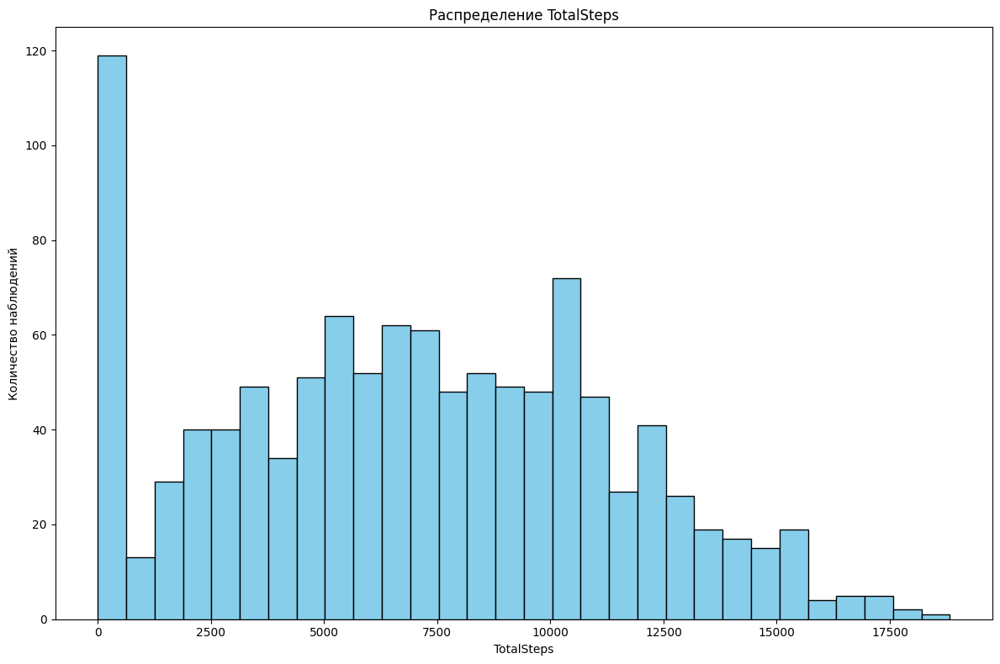

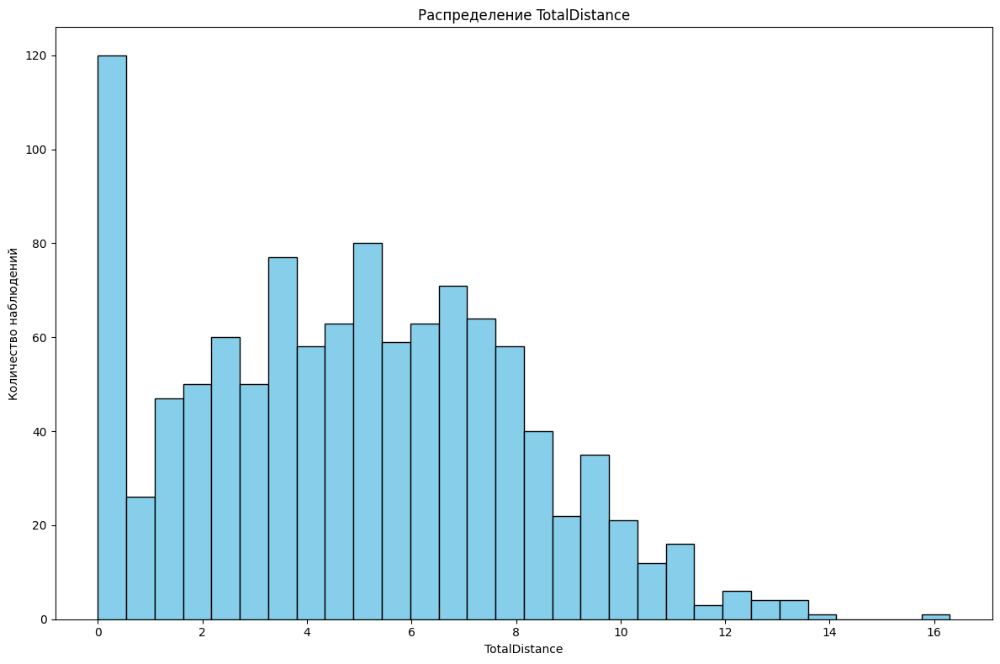

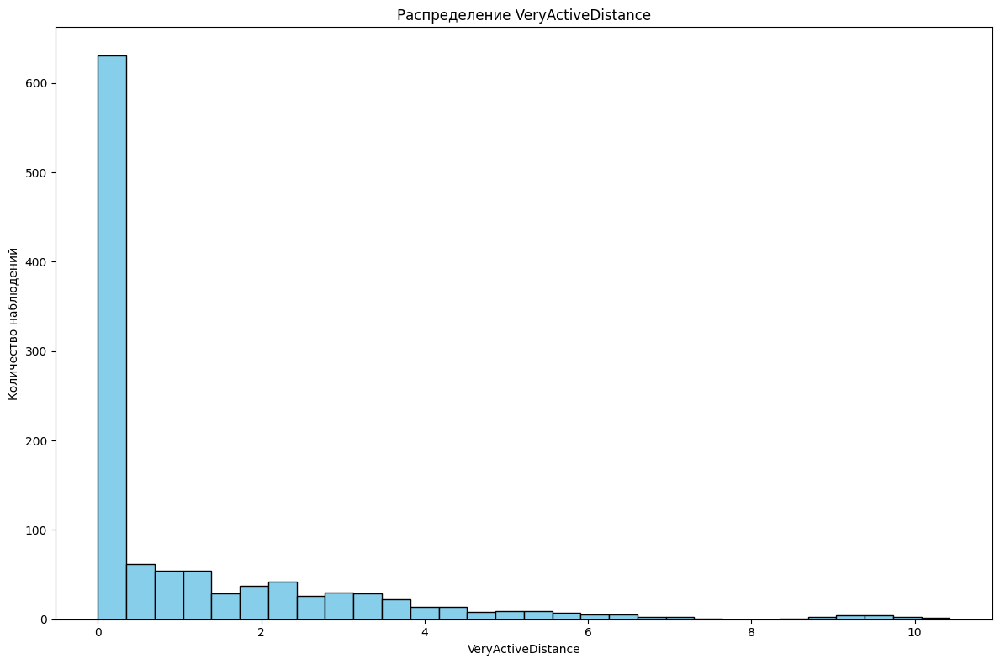

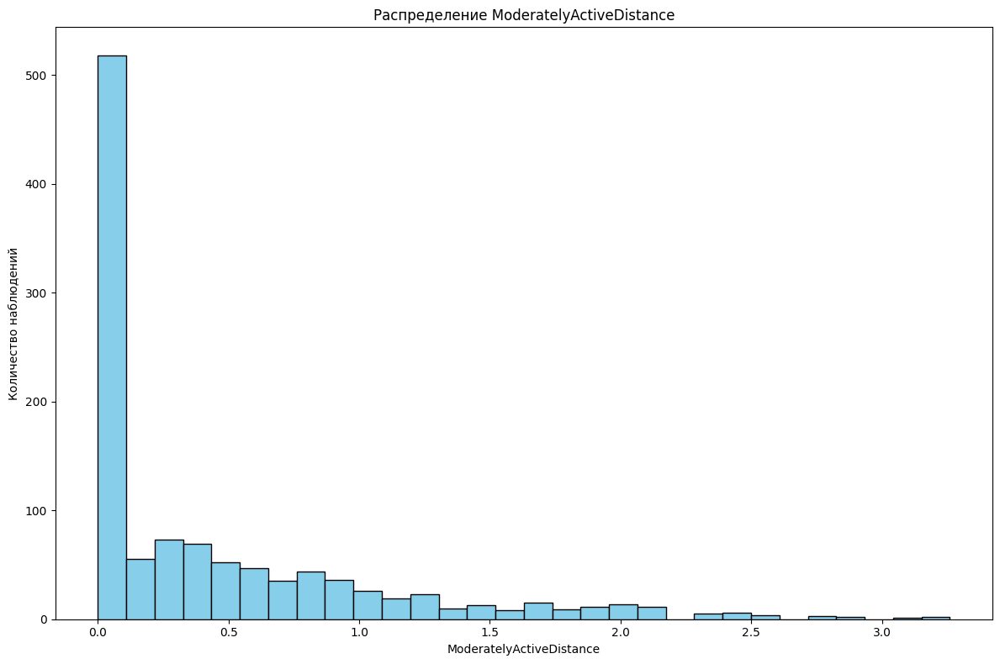

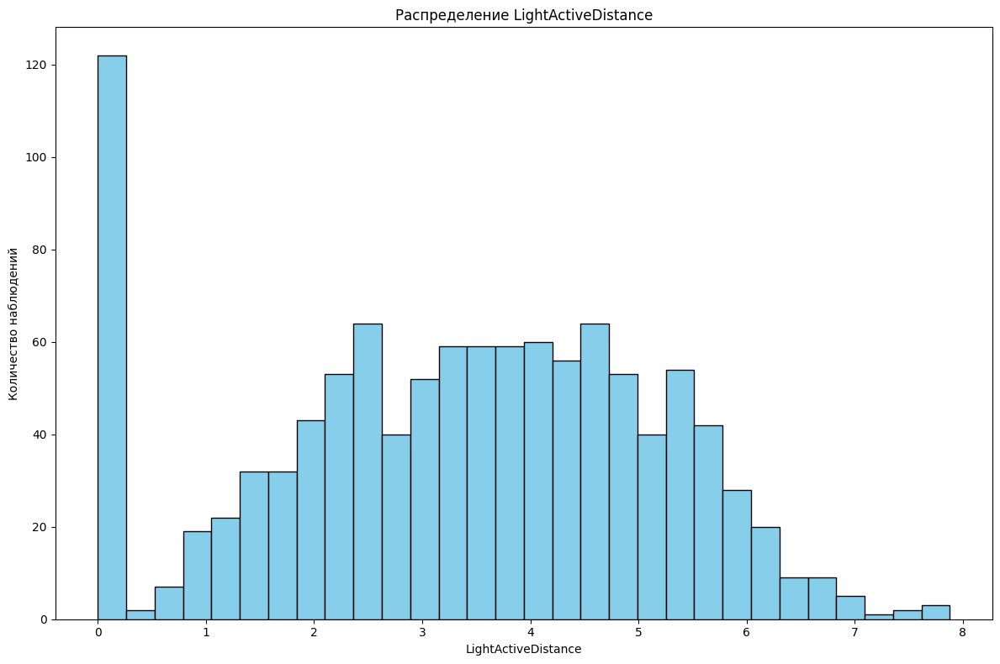

...

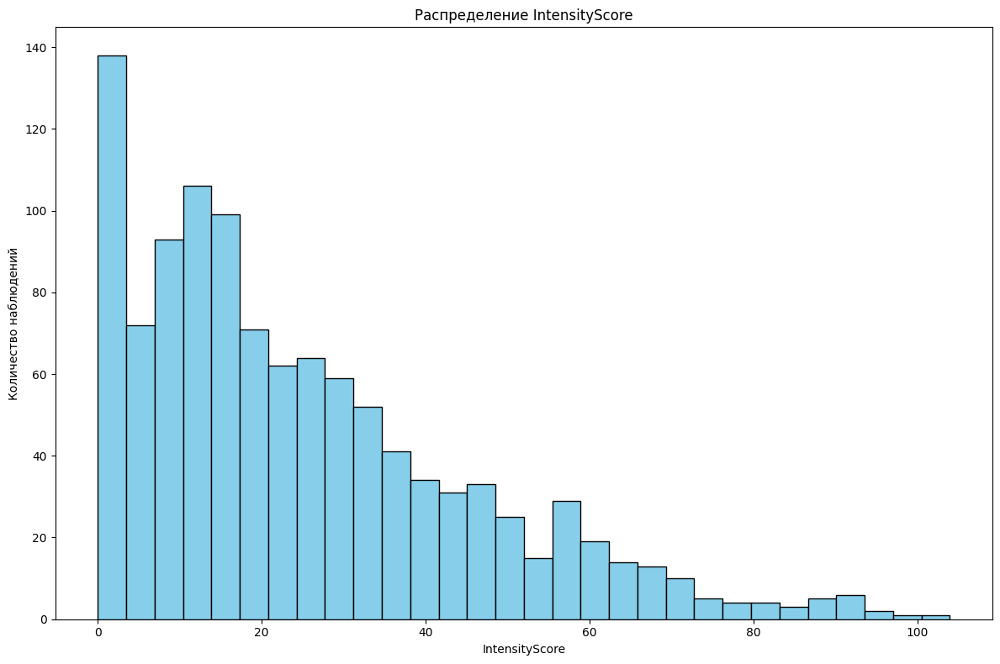

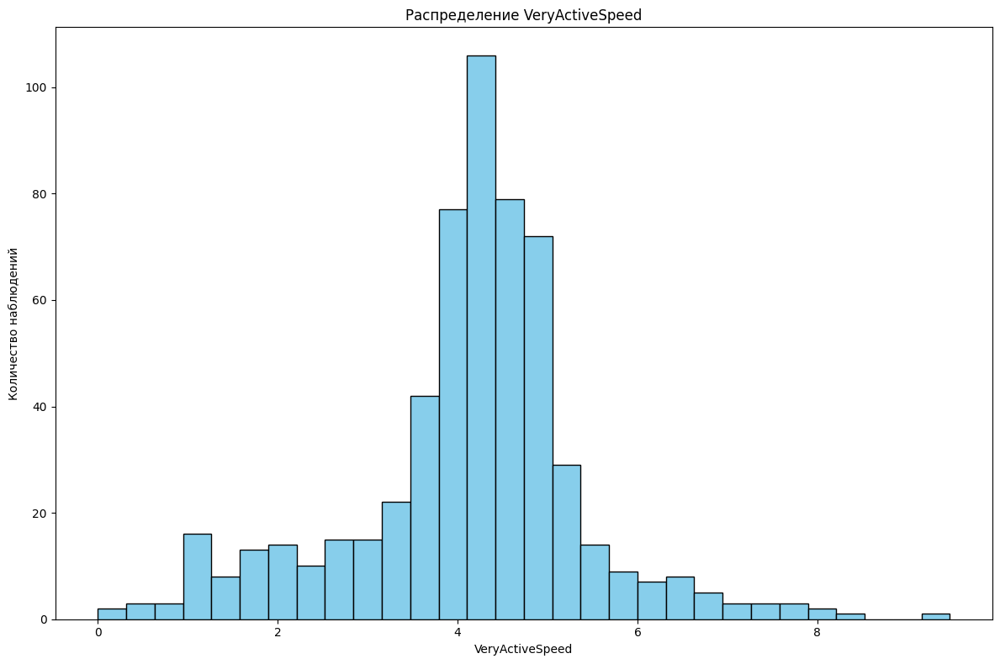

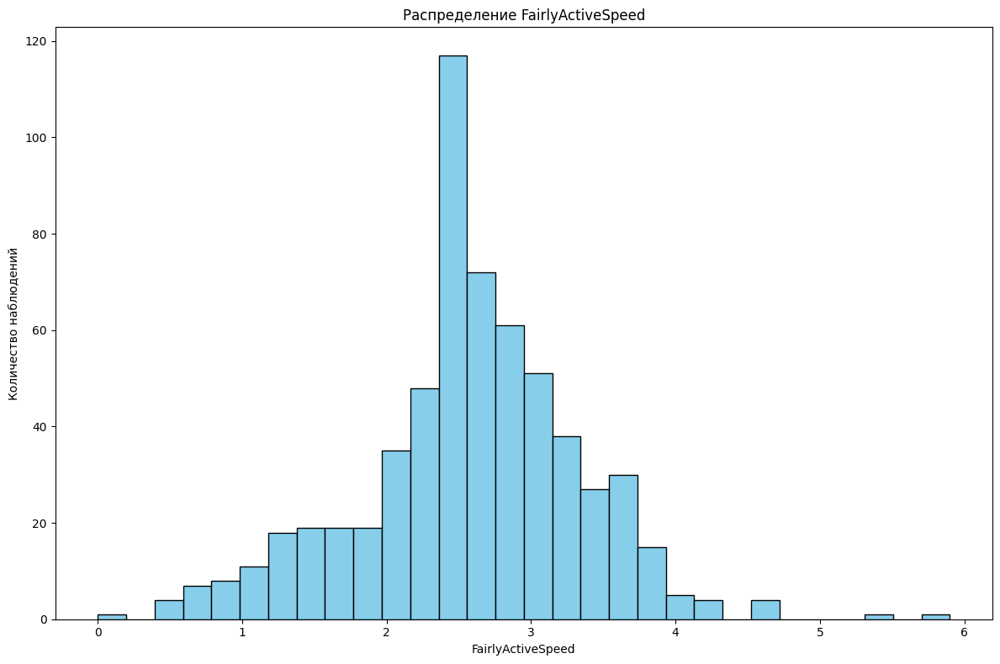

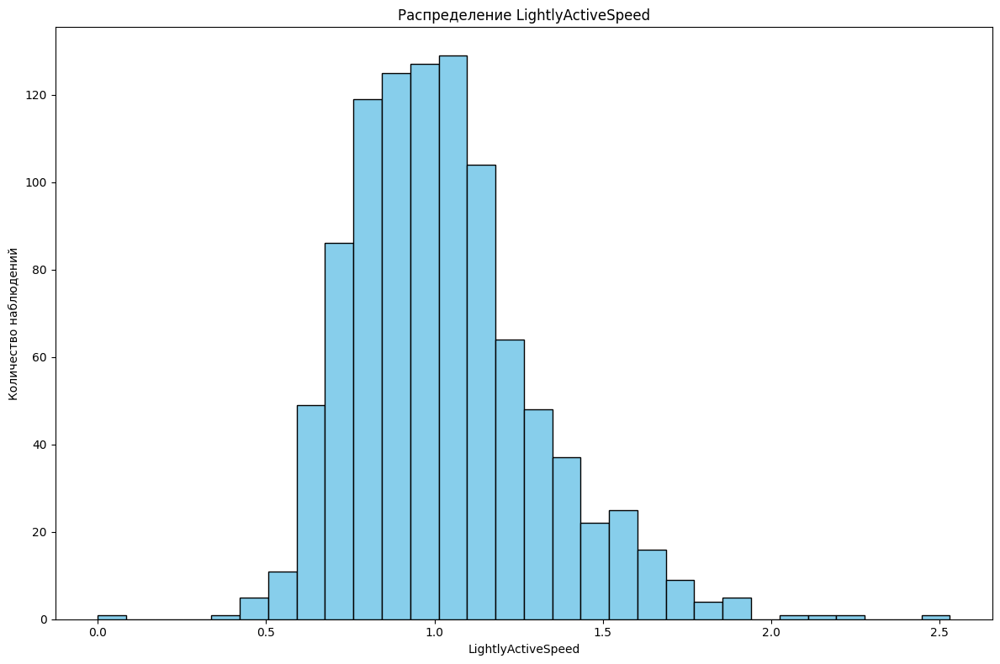

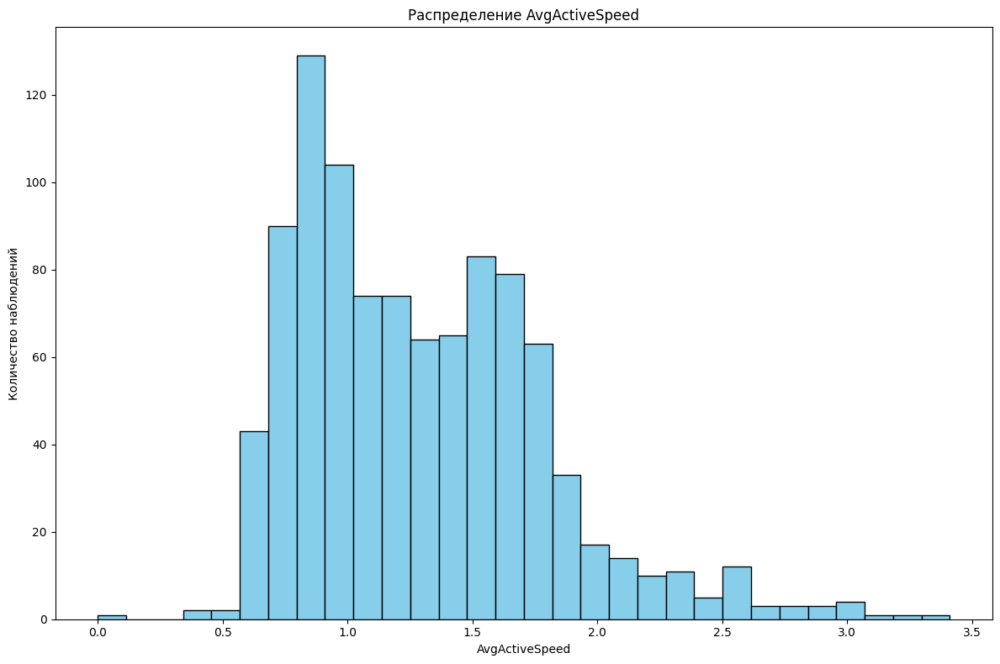

In [8]:
need_info=['TotalSteps', 'TotalDistance','VeryActiveDistance', 'ModeratelyActiveDistance', 
 'LightActiveDistance','VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes',
 'SedentaryMinutes', 'Calories', 'Activity_time',"IntensityScore","VeryActiveSpeed","FairlyActiveSpeed","LightlyActiveSpeed","AvgActiveSpeed"]
for i, col_1 in enumerate(need_info):
    plt.figure(figsize=(12, 8))
    plt.hist(dailyActivity[col_1], bins=30, color='skyblue', edgecolor='black')
    plt.title(f'Распределение {col_1}')
    plt.xlabel(col_1)
    plt.ylabel('Количество наблюдений')
    plt.tight_layout()
    plt.show()

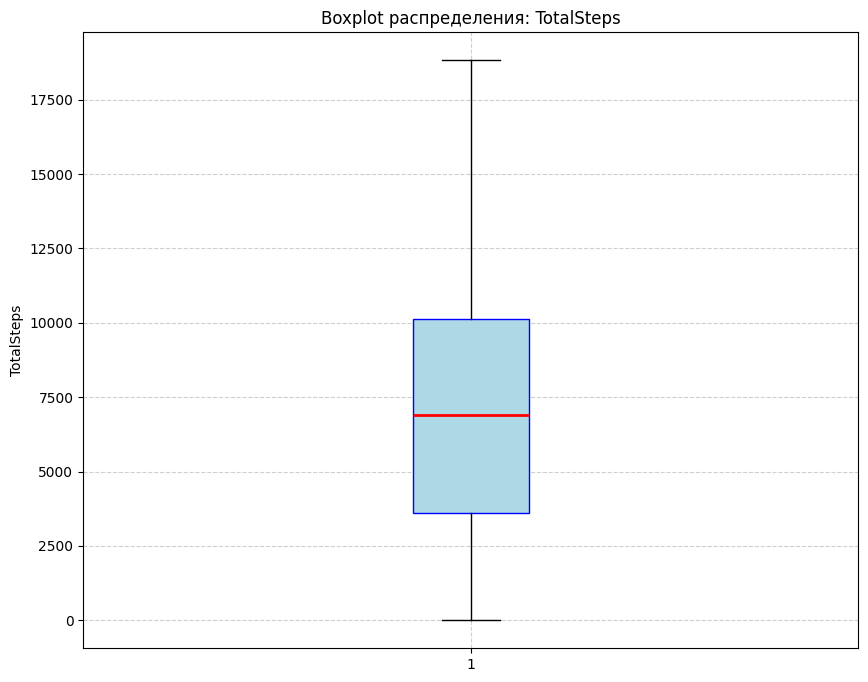

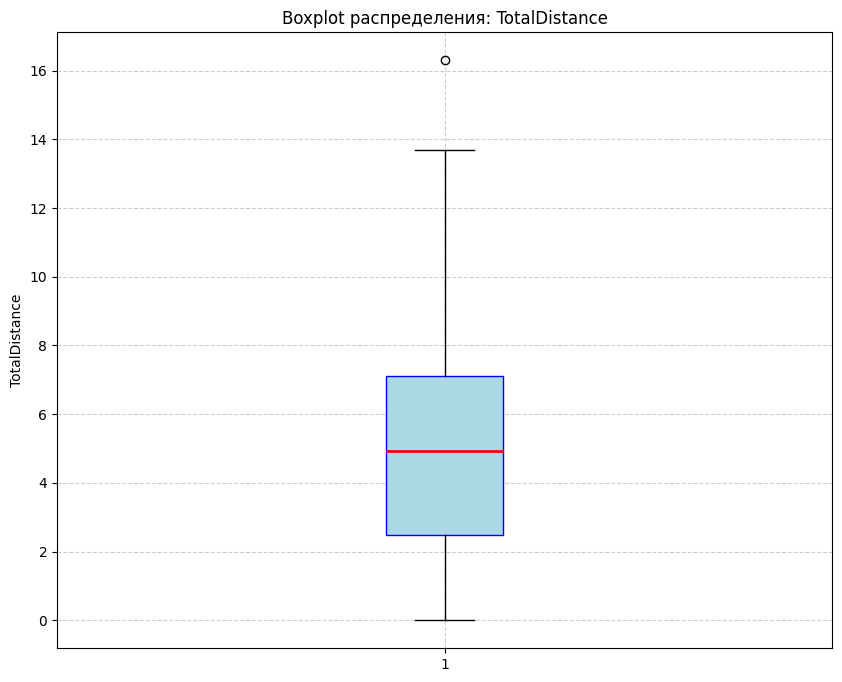

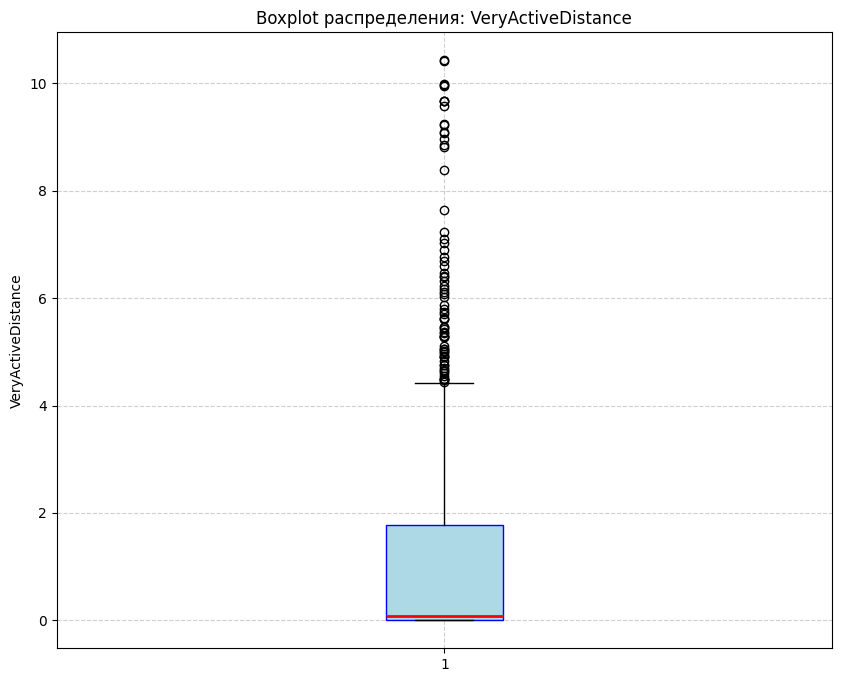

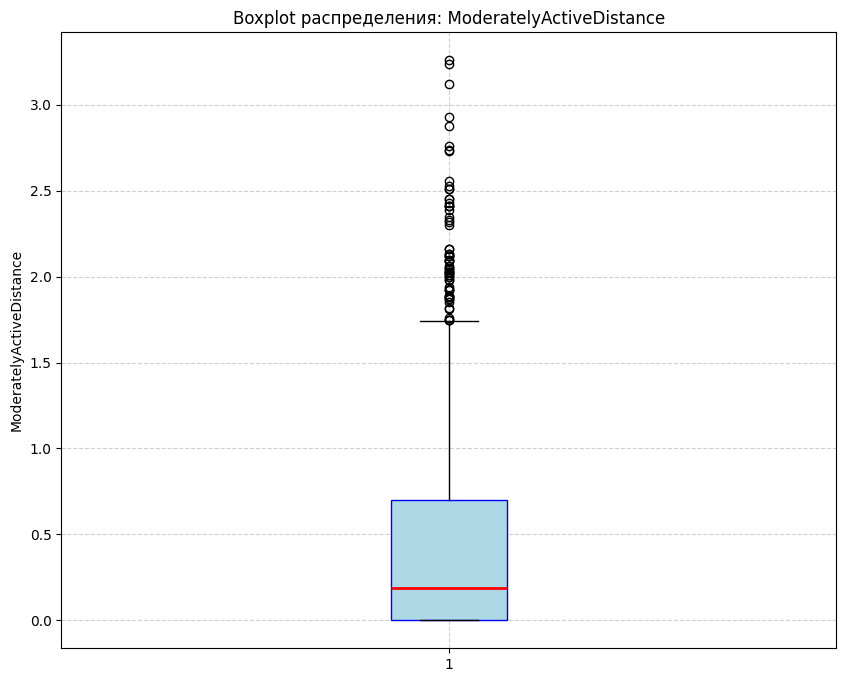

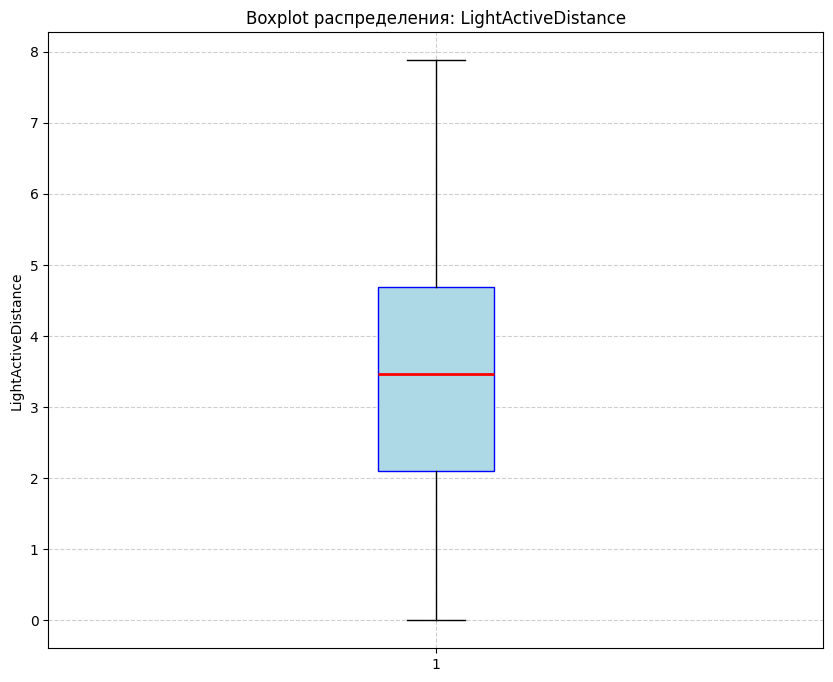

...

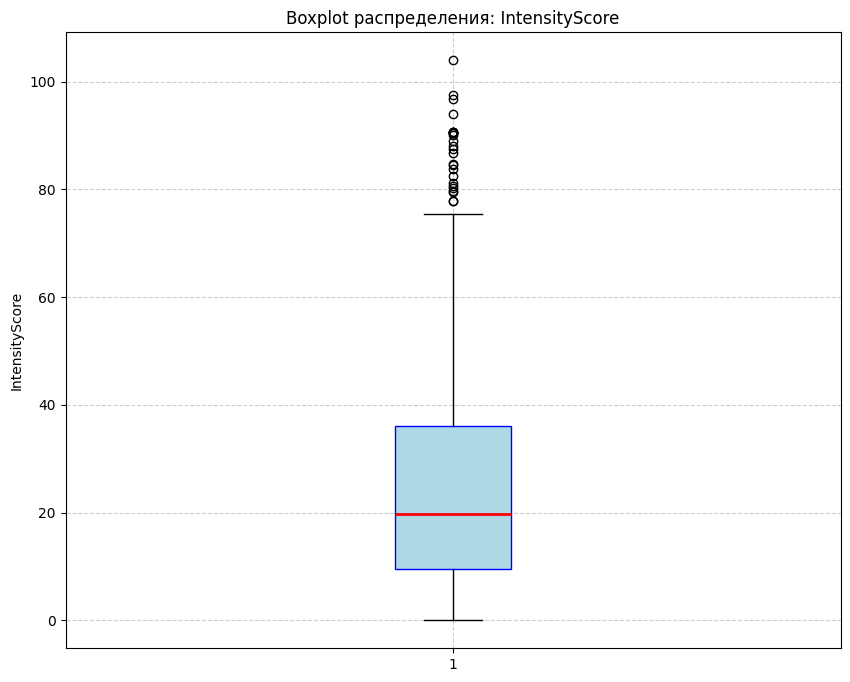

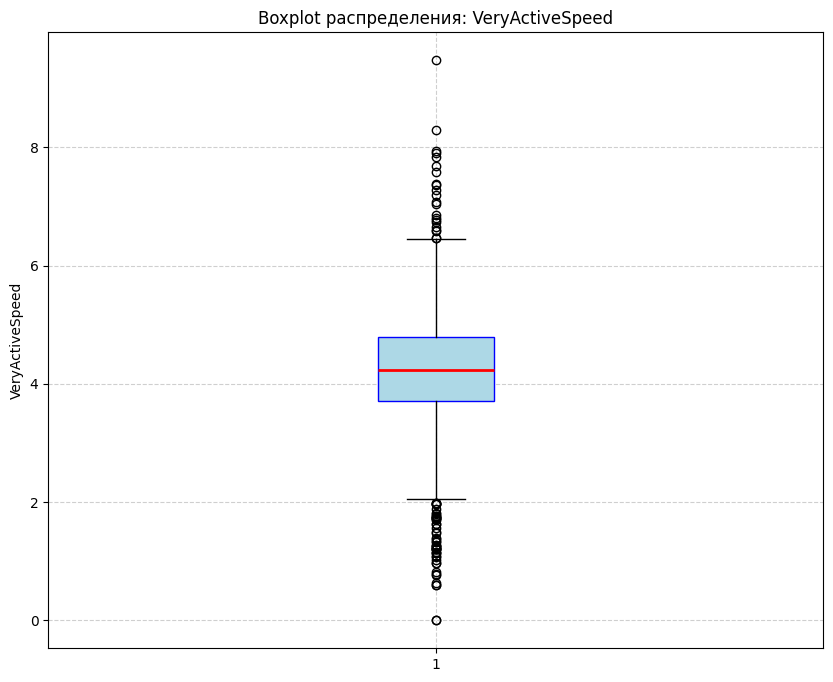

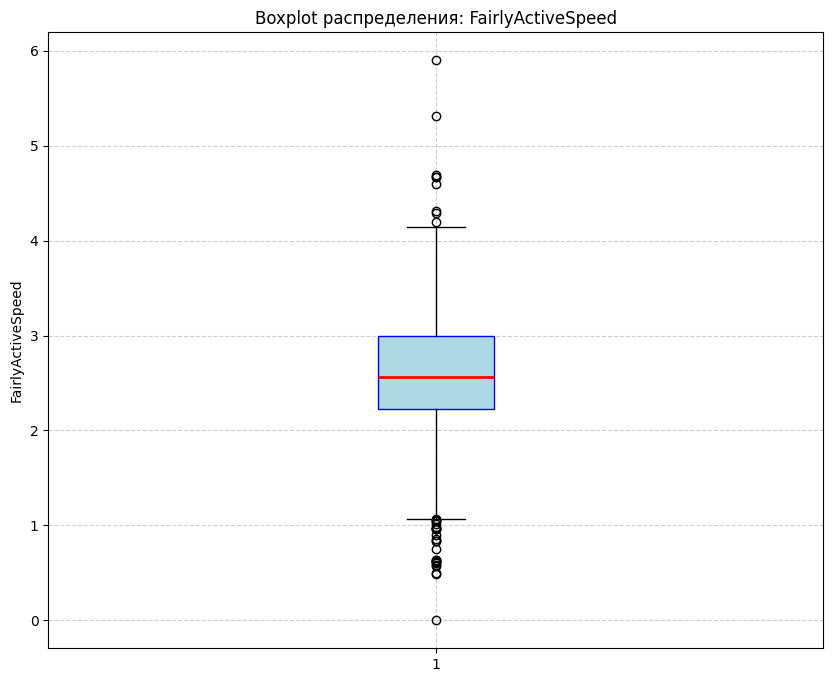

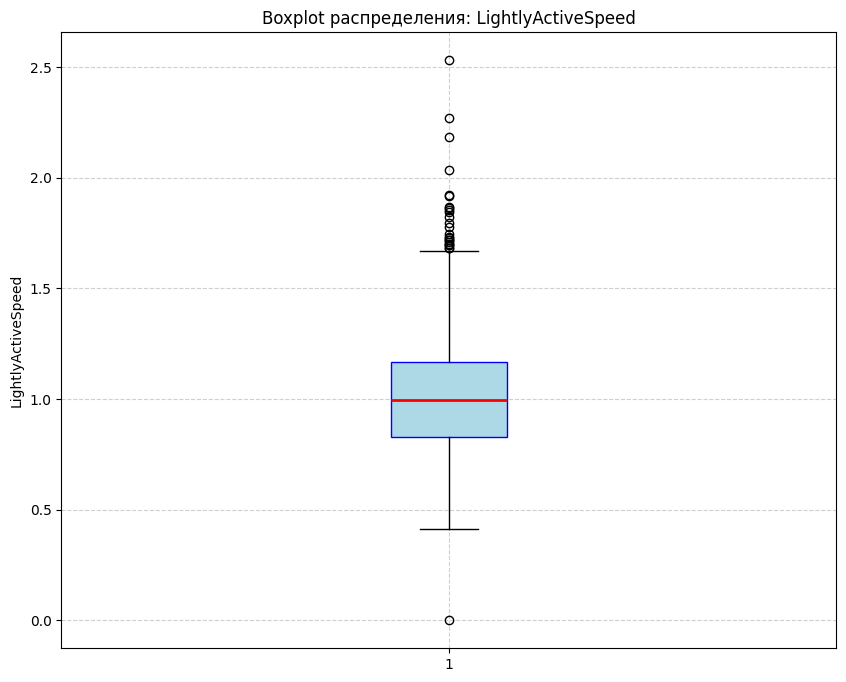

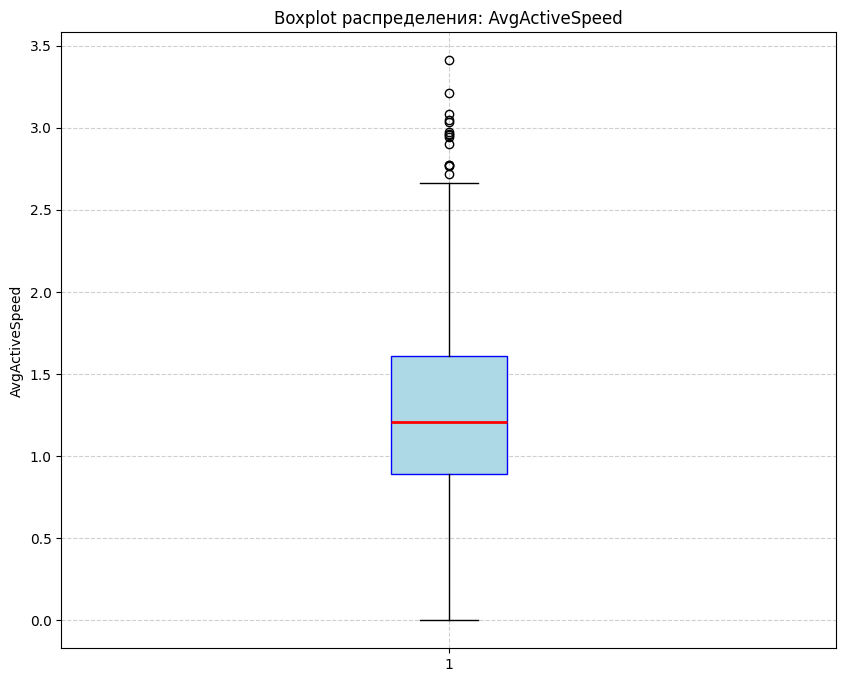

In [9]:
numeric_cols = dailyActivity.select_dtypes(include=[np.number]).columns.tolist()
for col in numeric_cols:
    plt.figure(figsize=(10, 8))
    plt.boxplot(dailyActivity[col].dropna(), vert=True, patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='blue'),
                medianprops=dict(color='red', linewidth=2))
    plt.title(f"Boxplot распределения: {col}")
    plt.ylabel(col)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

## Activity by day of the week

In [10]:
def plot_weekly_metrics_separate(
    df,
    attributes,
    agg_func='median',
    reverse_order=True,
    color='skyblue',
    orientation='barh',
    figsize=(10, 6),
):
    if 'day_of_week' not in df.columns:
        raise ValueError("The DataFrame is missing the 'day_of_week' column. Create it using dt.day_name().")
    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    if reverse_order:
        days = list(reversed(days))
    for attr in attributes:
        if attr not in df.columns:
            print(f"⚠️  Skipping attribute '{attr}' (not in data).")
            continue
        grouped = df.groupby('day_of_week')[attr]
        if agg_func == 'mean':
            result = grouped.mean().reindex(days)
        elif agg_func == 'median':
            result = grouped.median().reindex(days)
        elif agg_func == 'sum':
            result = grouped.sum().reindex(days)
        elif agg_func == 'max':
            result = grouped.max().reindex(days)
        elif agg_func == 'min':
            result = grouped.min().reindex(days)
        else:
            raise ValueError("Invalid value for agg_func. Use: 'mean', 'median', 'sum', 'max', 'min'.")
        plt.figure(figsize=figsize)
        if orientation == 'barh':
            result.plot(kind='barh', color=color, edgecolor='black')
            plt.xlabel(attr)
            plt.ylabel('Day of the week')
        else:
            result.plot(kind='bar', color=color, edgecolor='black')
            plt.ylabel(attr)
            plt.xlabel('Day of the week')
        plt.title(f"{agg_func.capitalize()} {attr} by Day of the Week", fontsize=13)
        plt.grid(axis='x' if orientation == 'barh' else 'y', linestyle='--', alpha=0.6)
        plt.tight_layout()

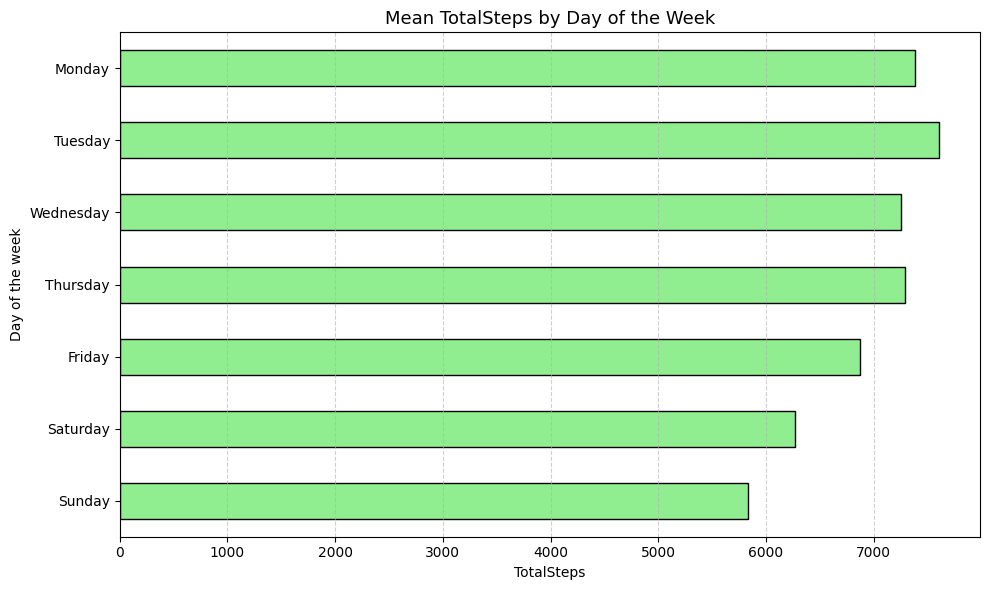

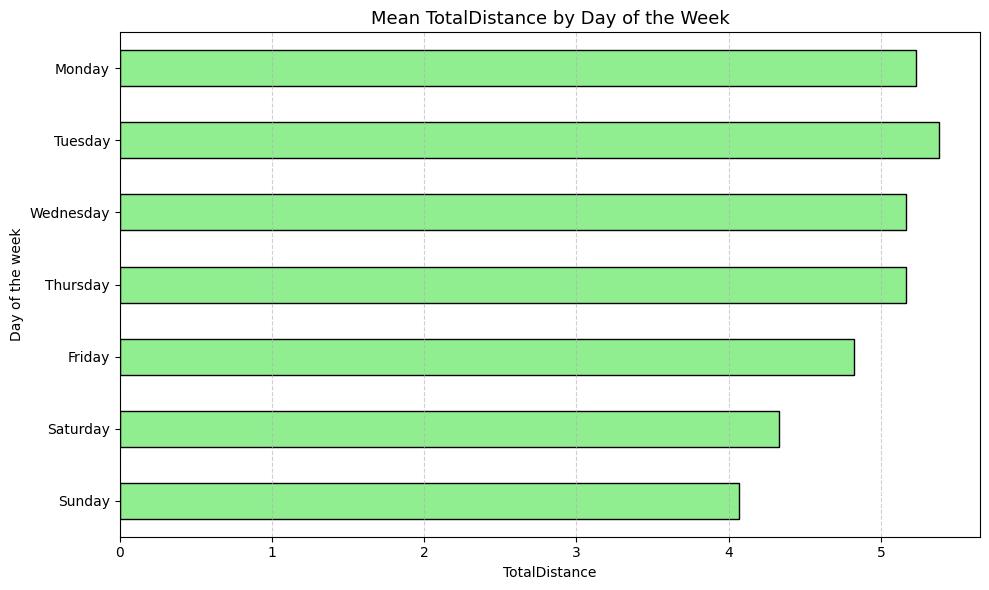

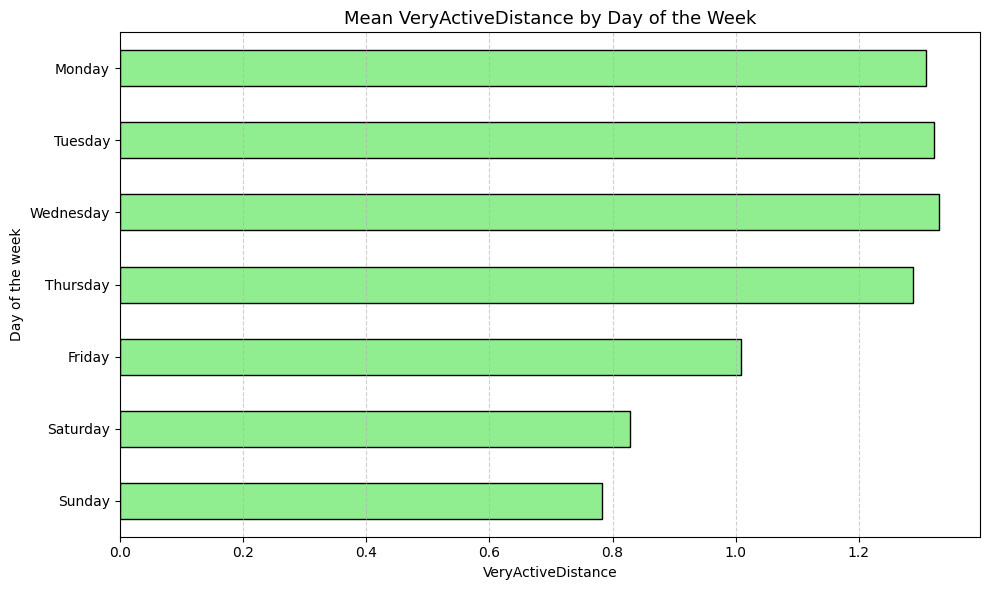

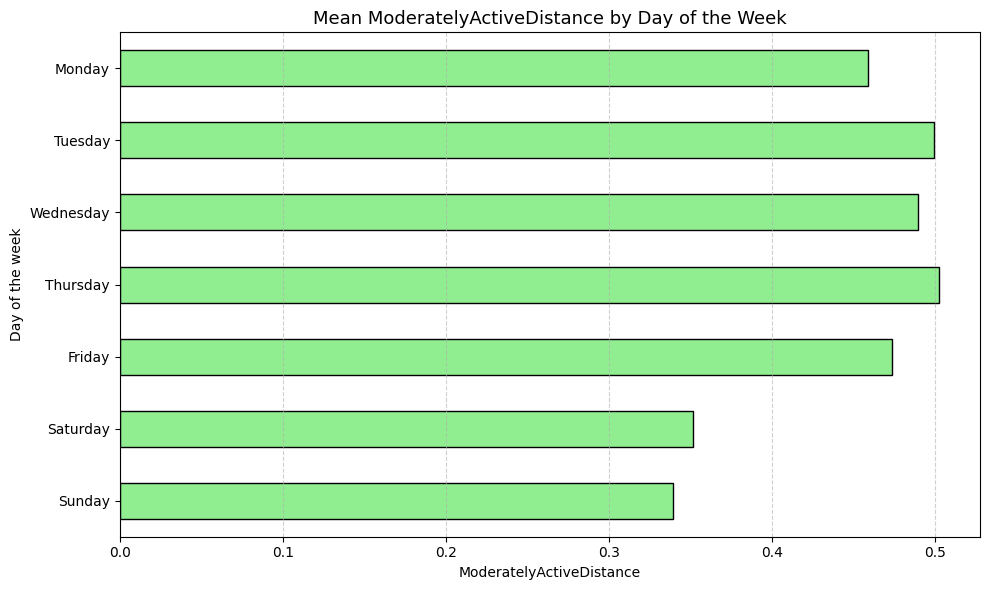

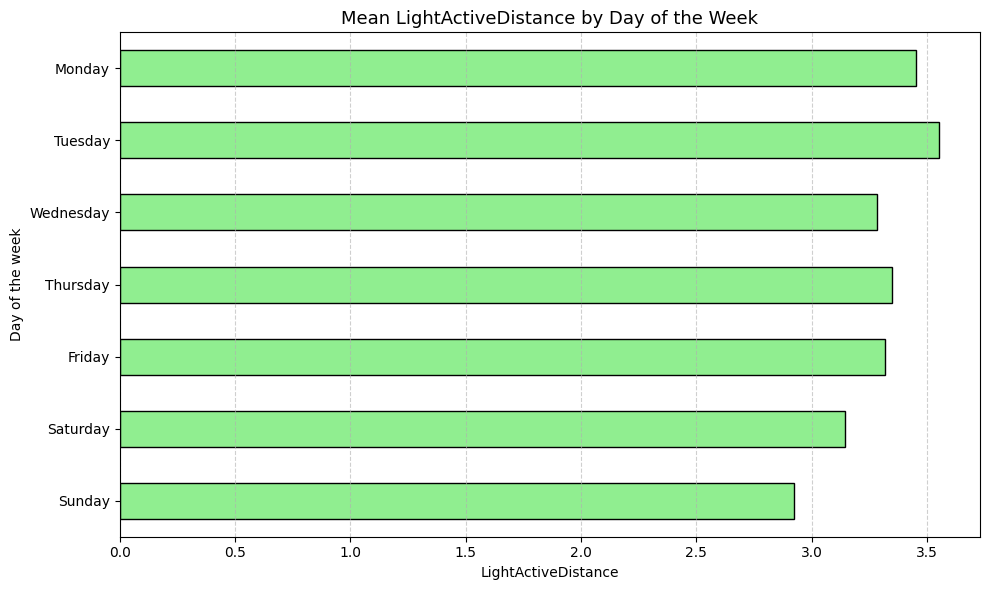

...

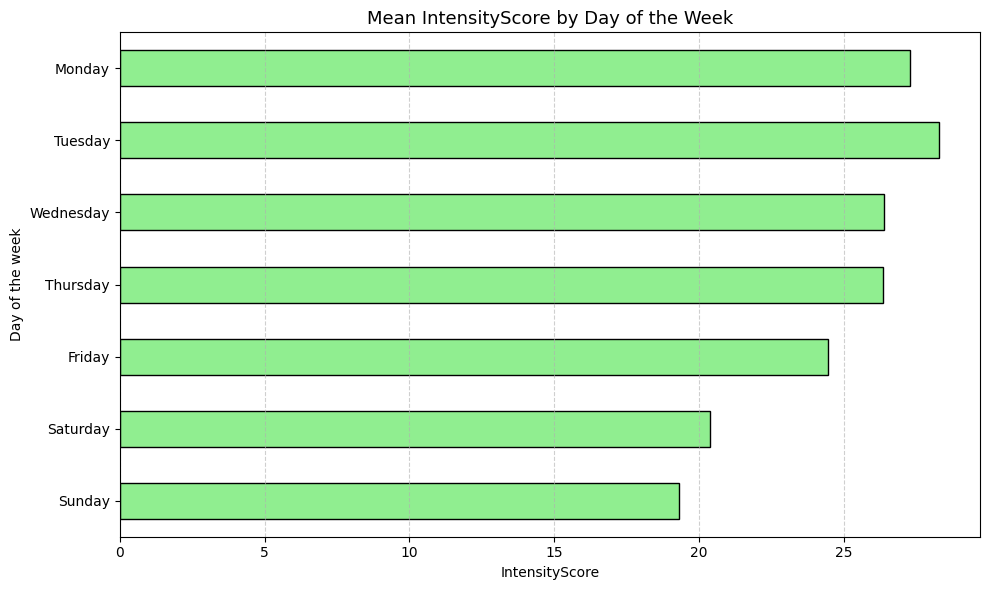

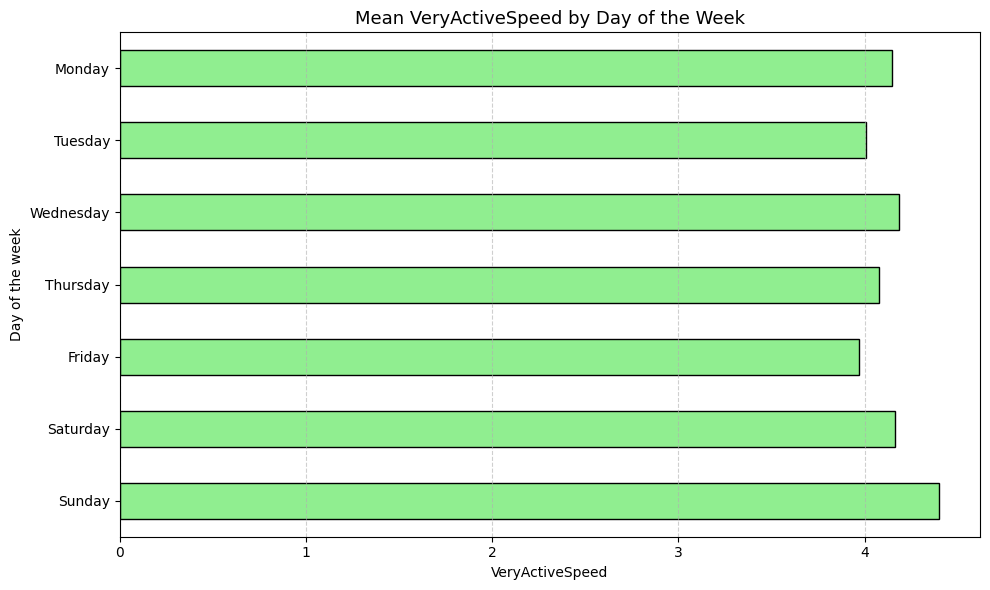

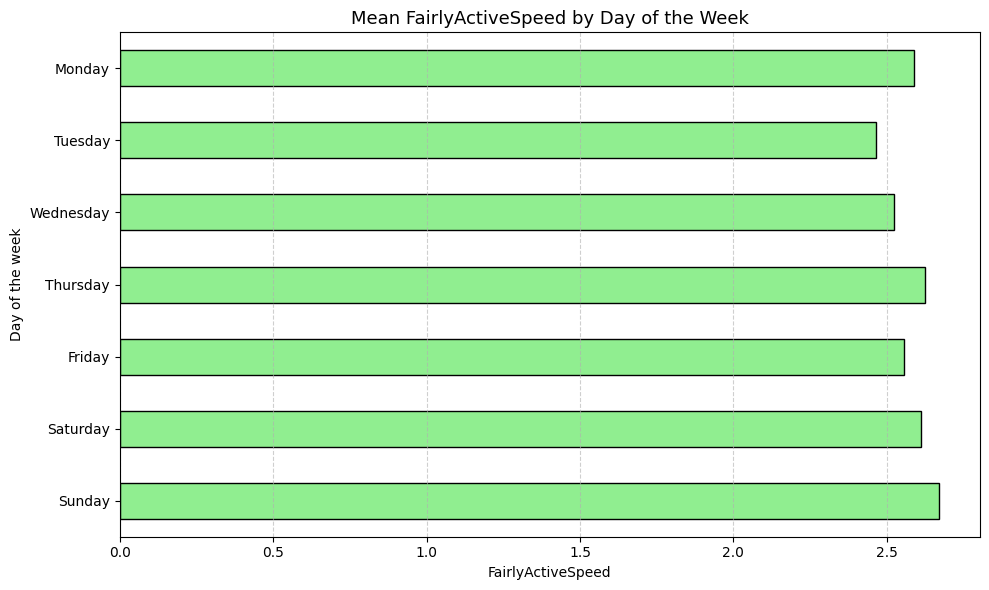

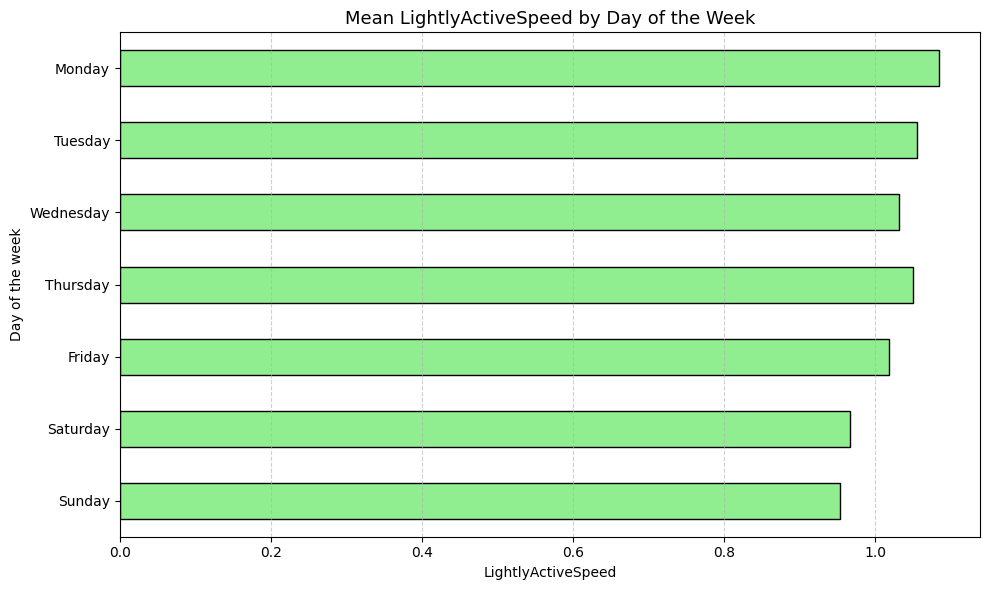

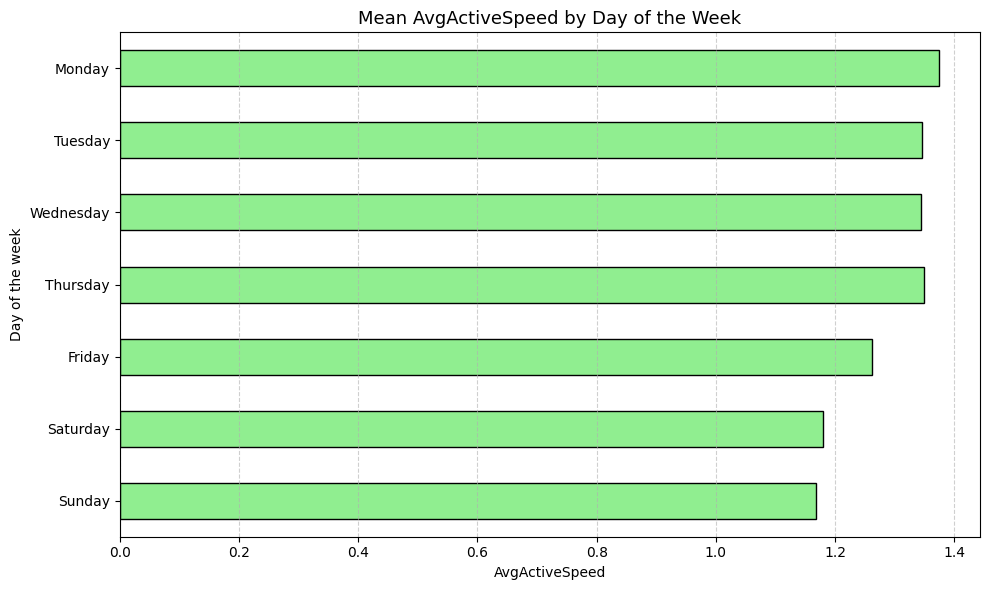

In [11]:
plot_weekly_metrics_separate(
    dailyActivity, 
    need_info, 
    agg_func='mean', 
    orientation='barh',
    color='lightgreen'
)

## Calories info

IntensityScore              0.594020
TotalDistance               0.565492
VeryActiveMinutes           0.557885
TotalSteps                  0.488271
AvgActiveSpeed              0.477367
LightlyActiveSpeed          0.467171
LightActiveDistance         0.430244
VeryActiveDistance          0.428351
Activity_time               0.381261
FairlyActiveMinutes         0.356781
ActiveRatio                 0.331082
ModeratelyActiveDistance    0.280329
LightlyActiveMinutes        0.230015
FairlyActiveSpeed          -0.132195
VeryActiveSpeed            -0.210782
SedentaryMinutes           -0.226559
Name: Calories, dtype: float64


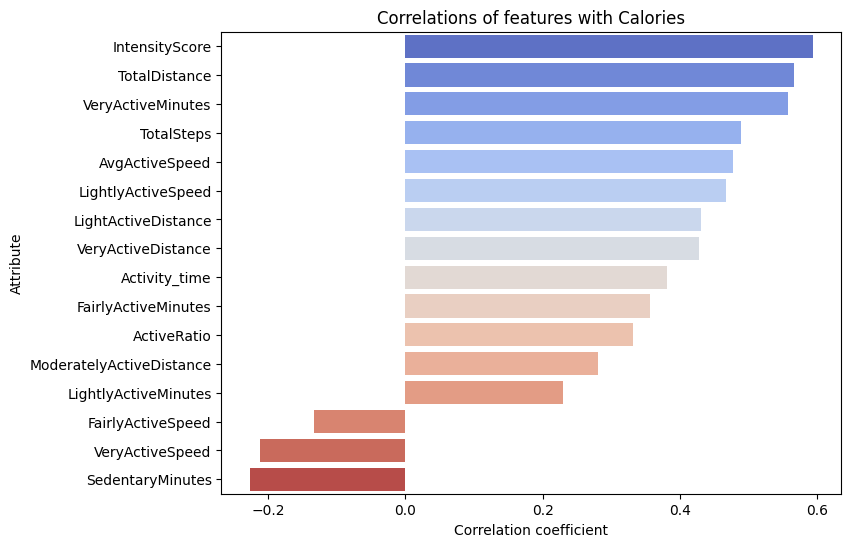

In [12]:
corr = dailyActivity.corr(numeric_only=True)['Calories'].sort_values(ascending=False)
corr=corr.drop(["Calories","Total_active_time"])
print(corr)
plt.figure(figsize=(8,6))
sns.barplot(x=corr.values, y=corr.index, palette='coolwarm')
plt.title('Correlations of features with Calories')
plt.xlabel('Correlation coefficient')
plt.ylabel('Attribute')
plt.show()

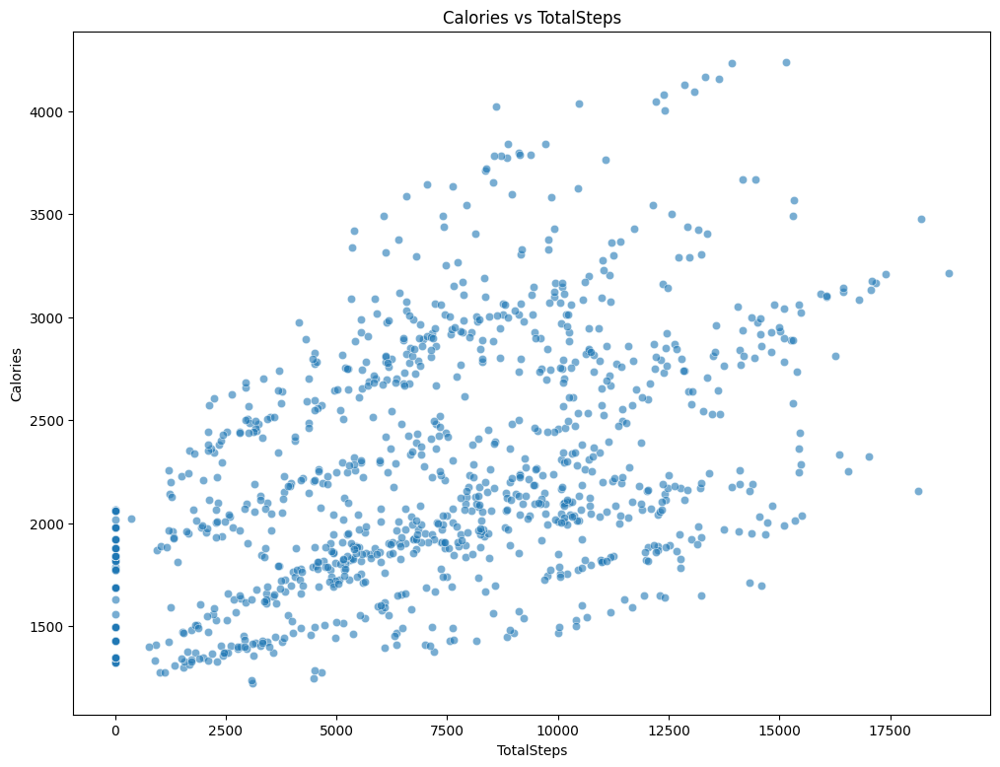

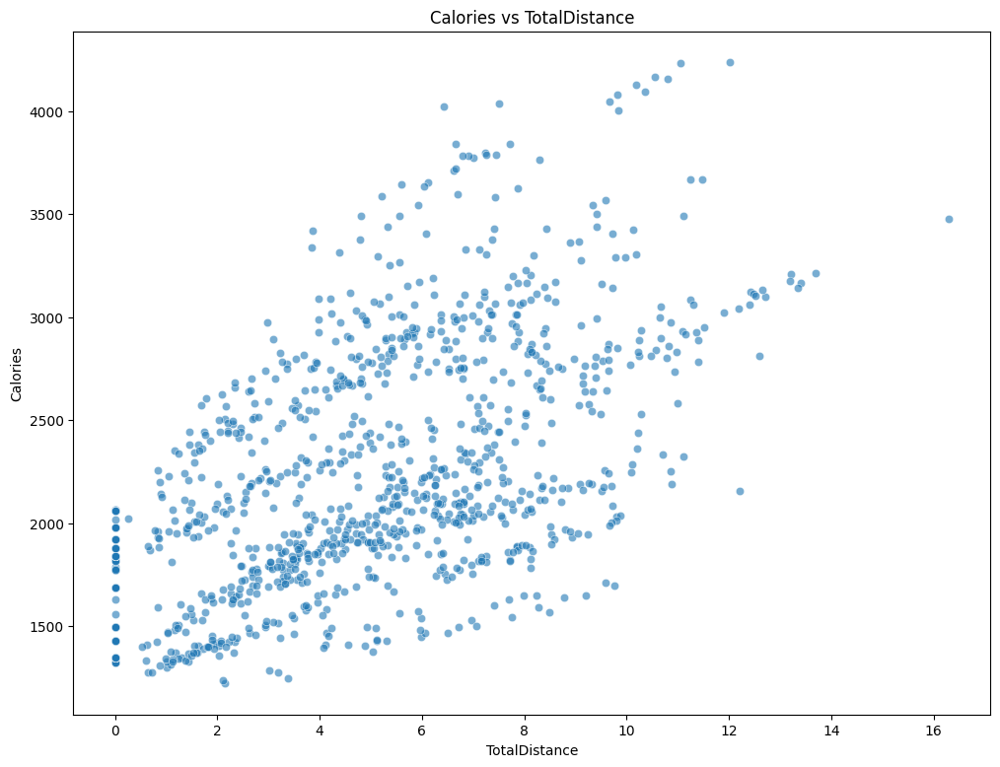

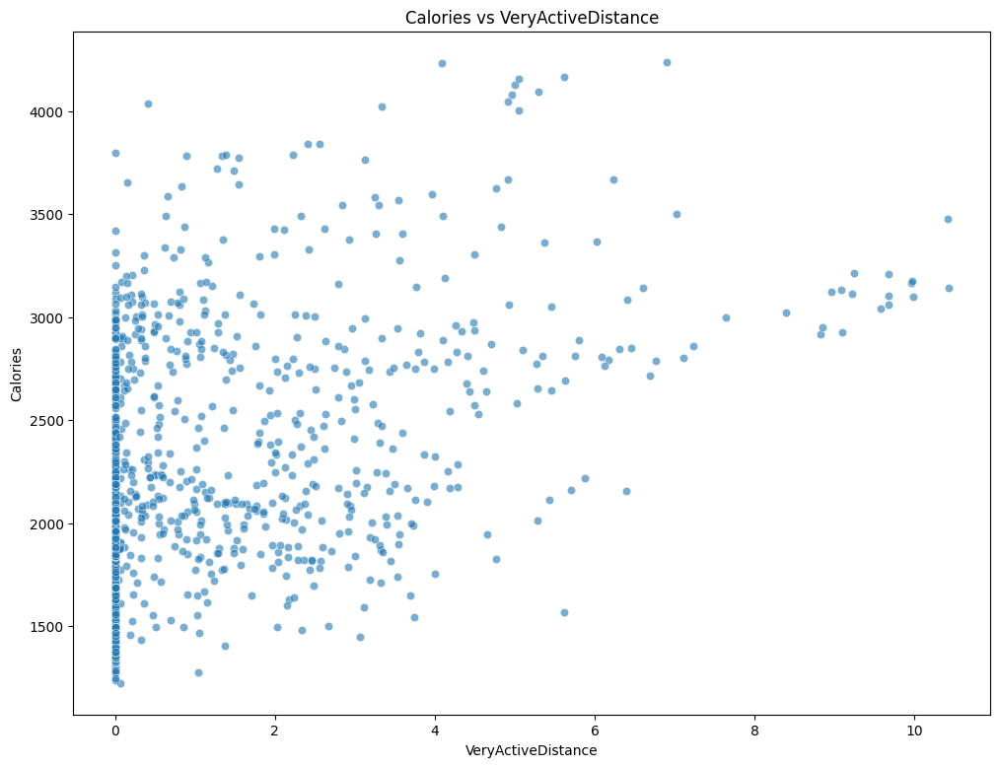

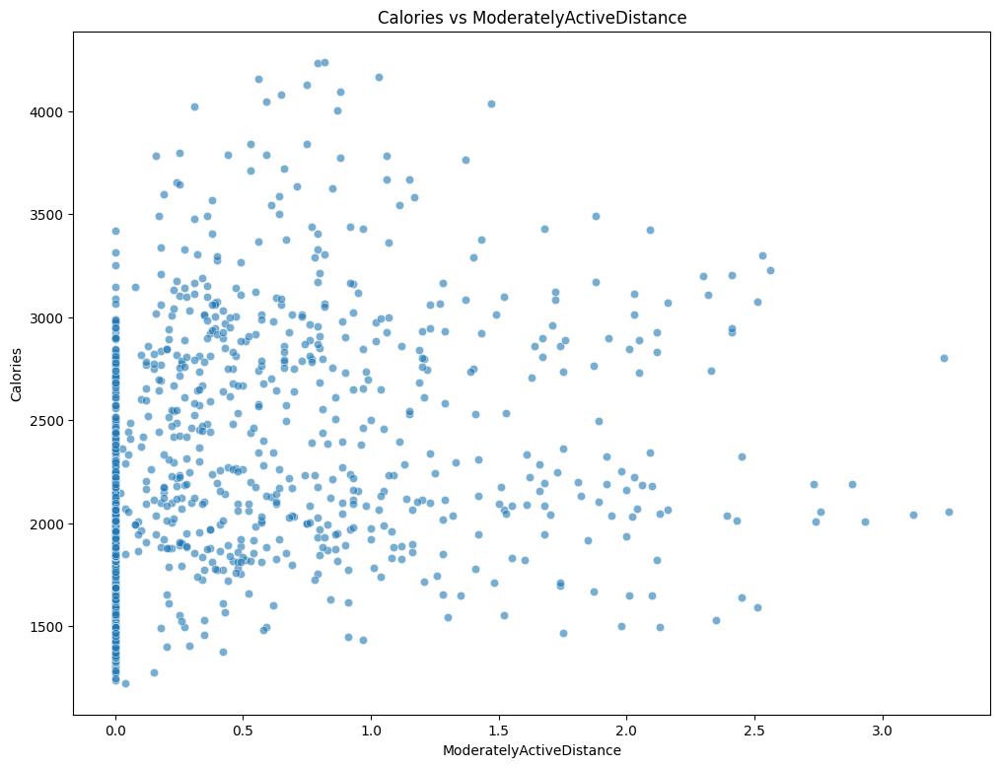

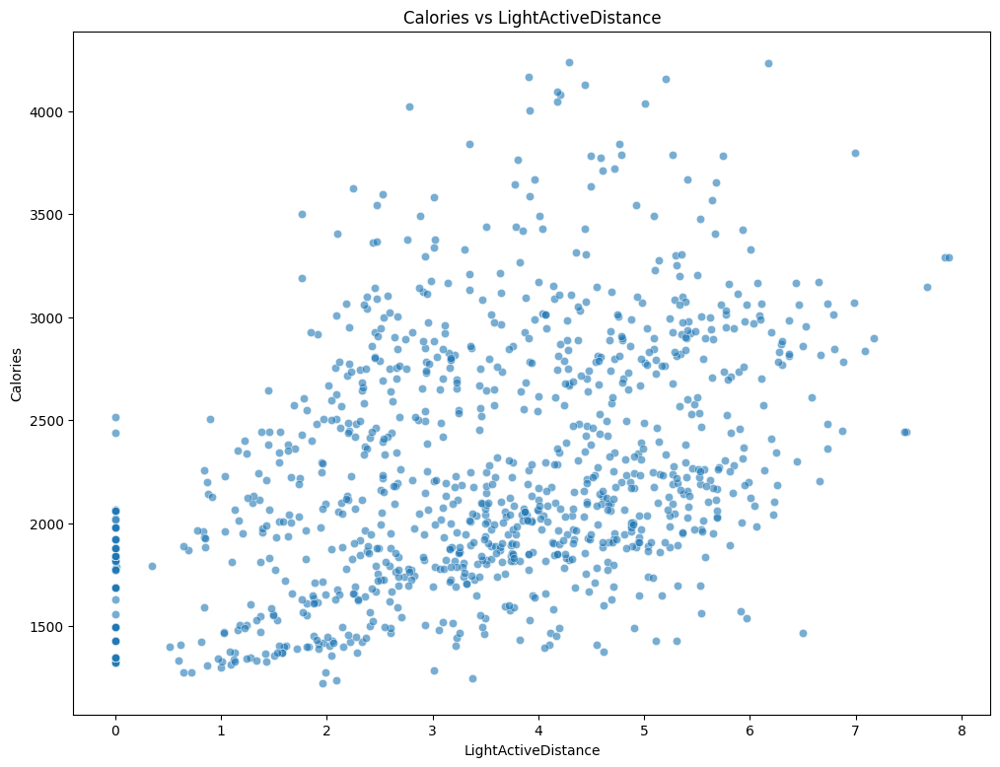

...

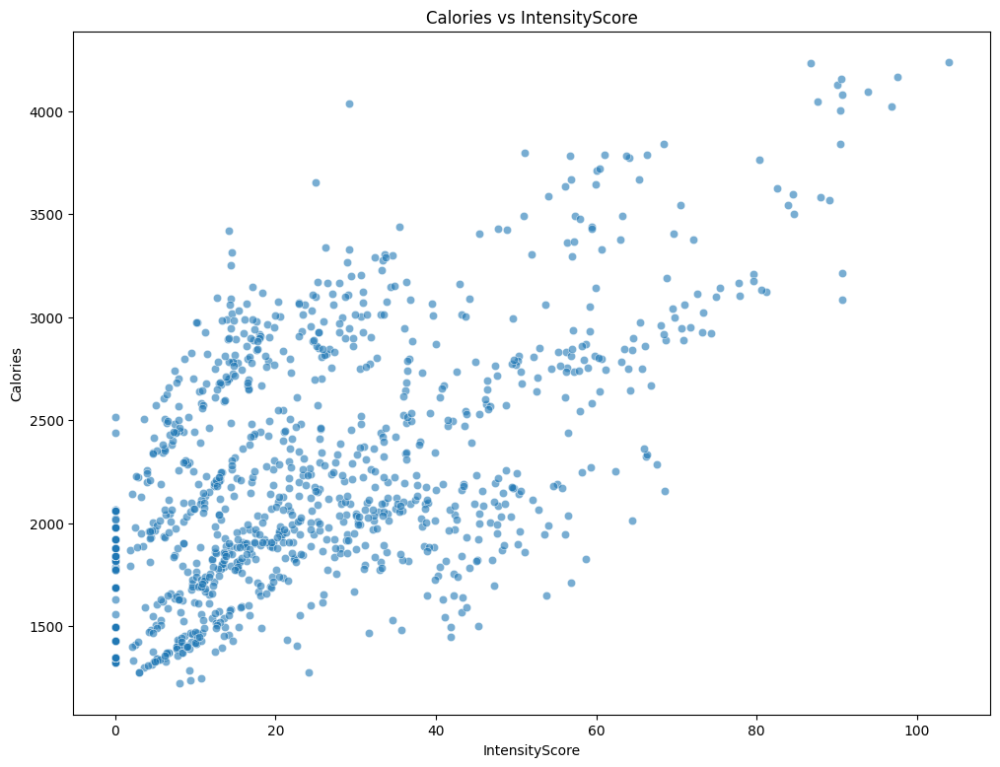

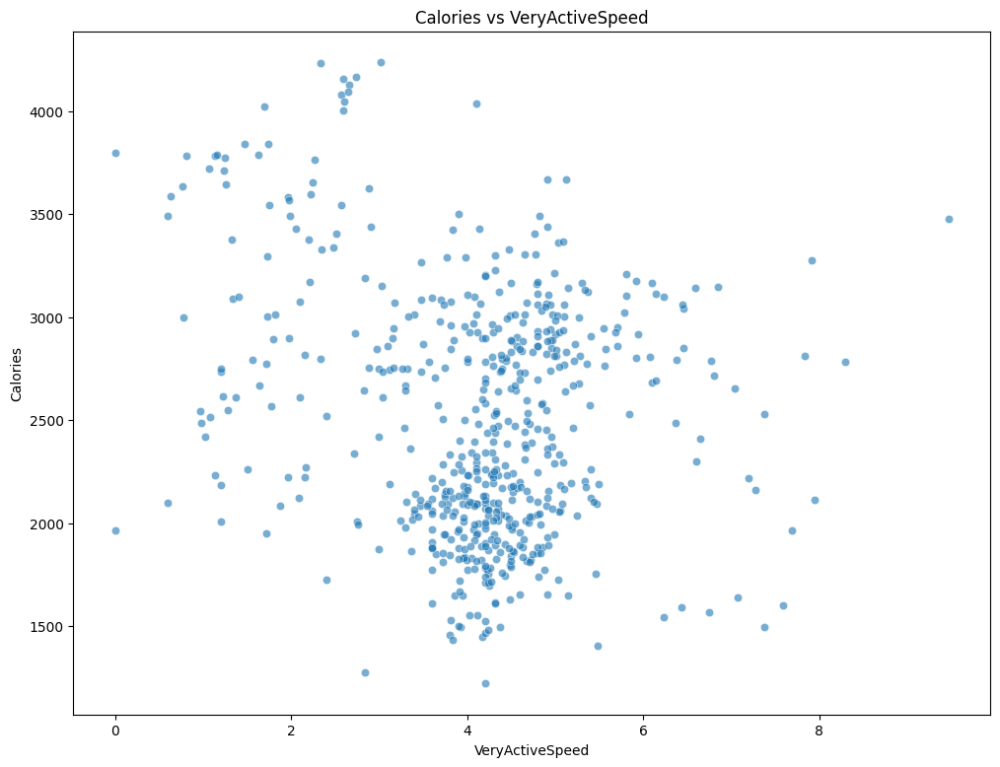

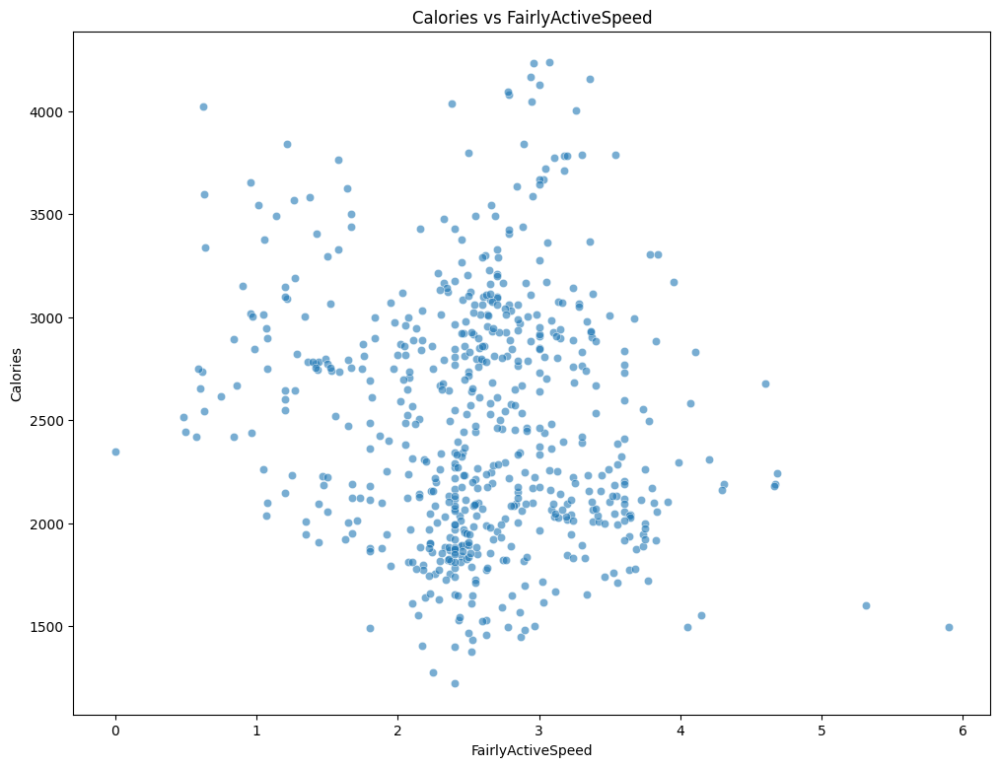

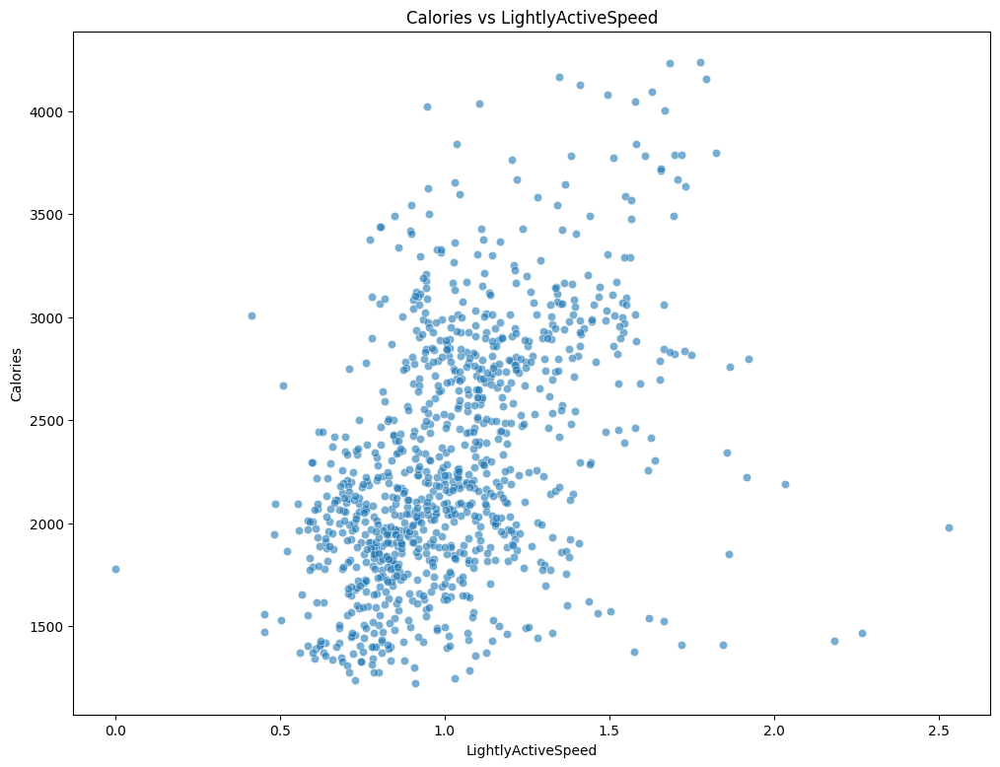

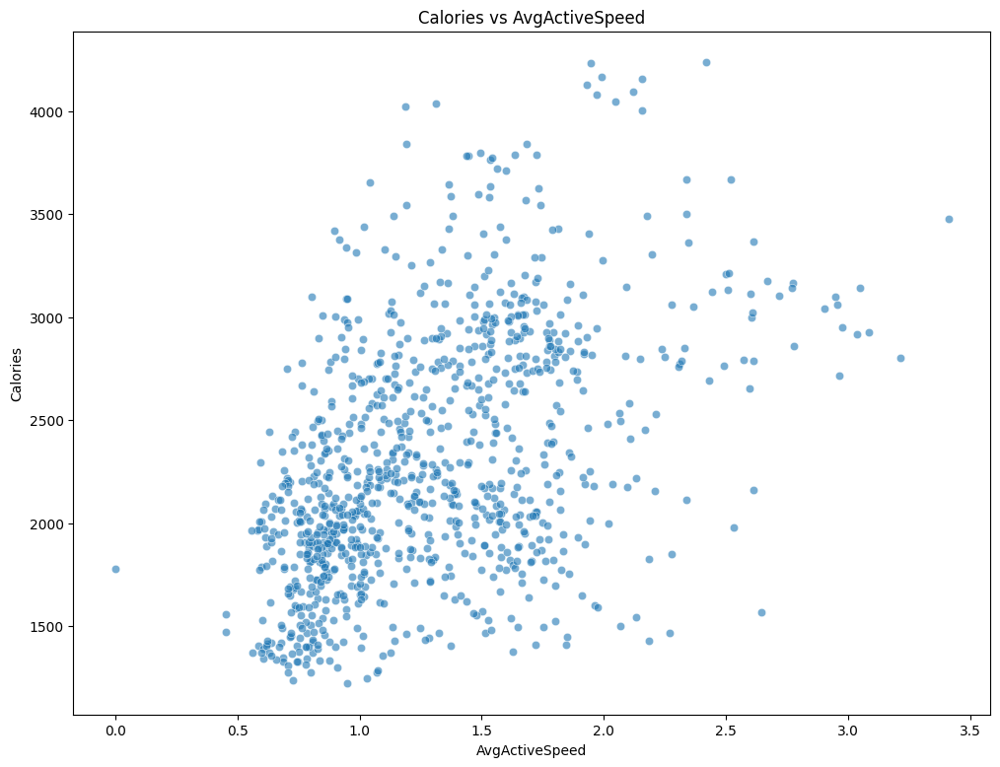

In [13]:
for f in need_info:
    plt.figure(figsize=(12,9))
    sns.scatterplot(data=dailyActivity, x=f, y='Calories', alpha=0.6)
    plt.title(f'Calories vs {f}')
    plt.show()

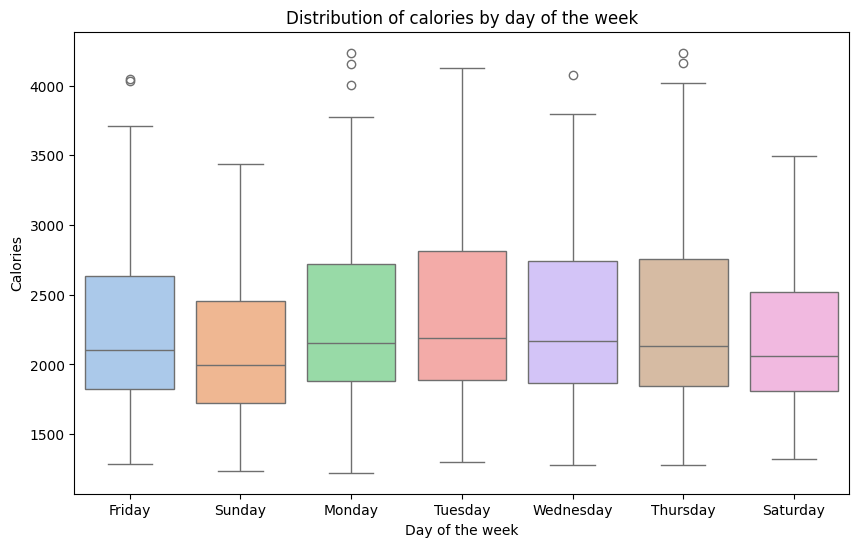

In [14]:
plt.figure(figsize=(10,6))
sns.boxplot(data=dailyActivity, x='day_of_week', y='Calories', palette='pastel')
plt.title('Distribution of calories by day of the week')
plt.xlabel('Day of the week')
plt.ylabel('Calories')
plt.show()


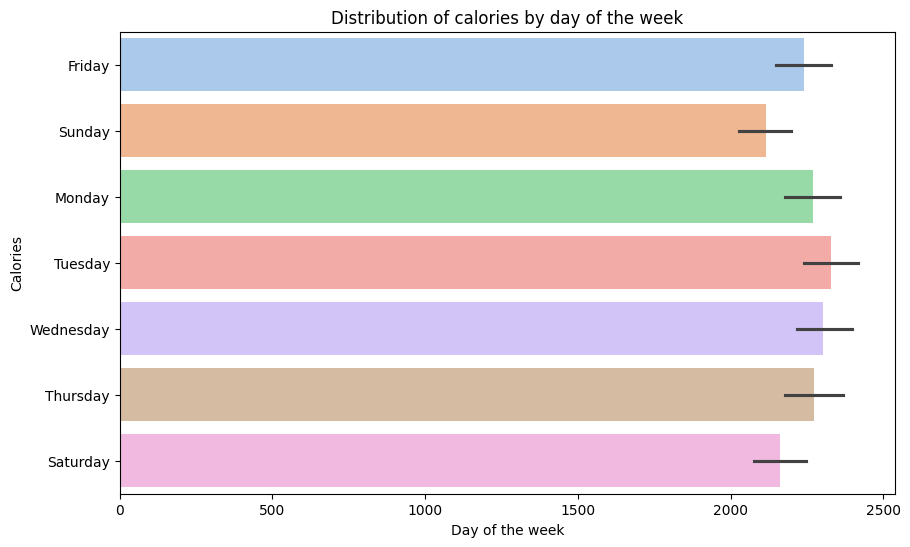

In [15]:
plt.figure(figsize=(10,6))
sns.barplot(data=dailyActivity, y='day_of_week', x='Calories', palette='pastel')
plt.title('Distribution of calories by day of the week')
plt.xlabel('Day of the week')
plt.ylabel('Calories')
plt.show()


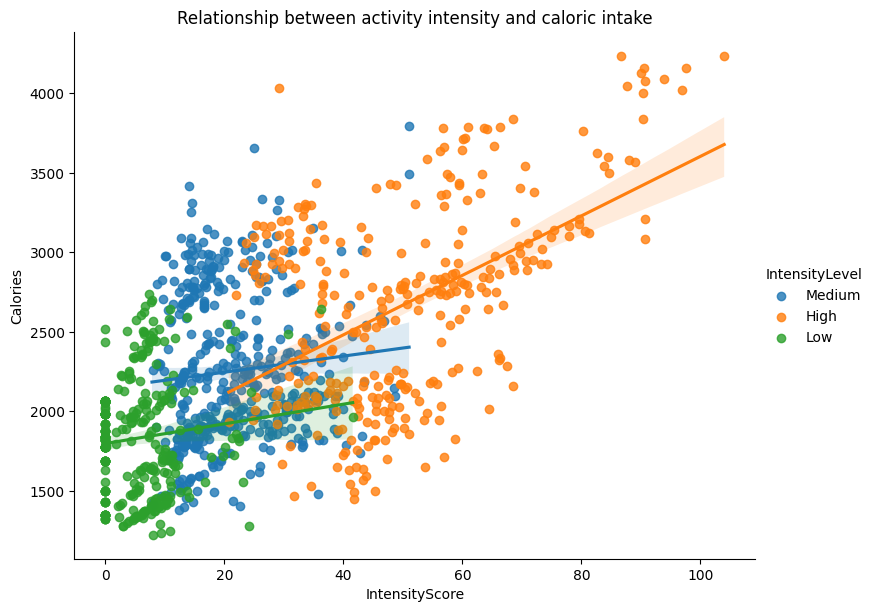

In [16]:
sns.lmplot(data=dailyActivity, x='IntensityScore', y='Calories', height=6, aspect=1.3,hue="IntensityLevel")
plt.title('Relationship between activity intensity and caloric intake')
plt.show()

In [17]:
dailyActivity.groupby('IntensityLevel')[need_info].aggregate(["mean"]).loc[["Low","Medium","High"]].T

,IntensityLevel,Low,Medium,High
TotalSteps,mean,1918.455090,7399.149675,11678.306962
TotalDistance,mean,1.311228,5.151649,8.362215
VeryActiveDistance,mean,0.071048,0.518113,3.166266
ModeratelyActiveDistance,mean,0.057305,0.258134,1.141646
LightActiveDistance,mean,1.136976,4.357332,4.045158
VeryActiveMinutes,mean,1.209581,7.798265,46.468354
FairlyActiveMinutes,mean,1.338323,6.379610,26.373418
LightlyActiveMinutes,mean,80.715569,261.973970,217.484177
SedentaryMinutes,mean,1208.161677,943.433839,895.430380
Calories,mean,1831.934132,2252.672451,2673.639241


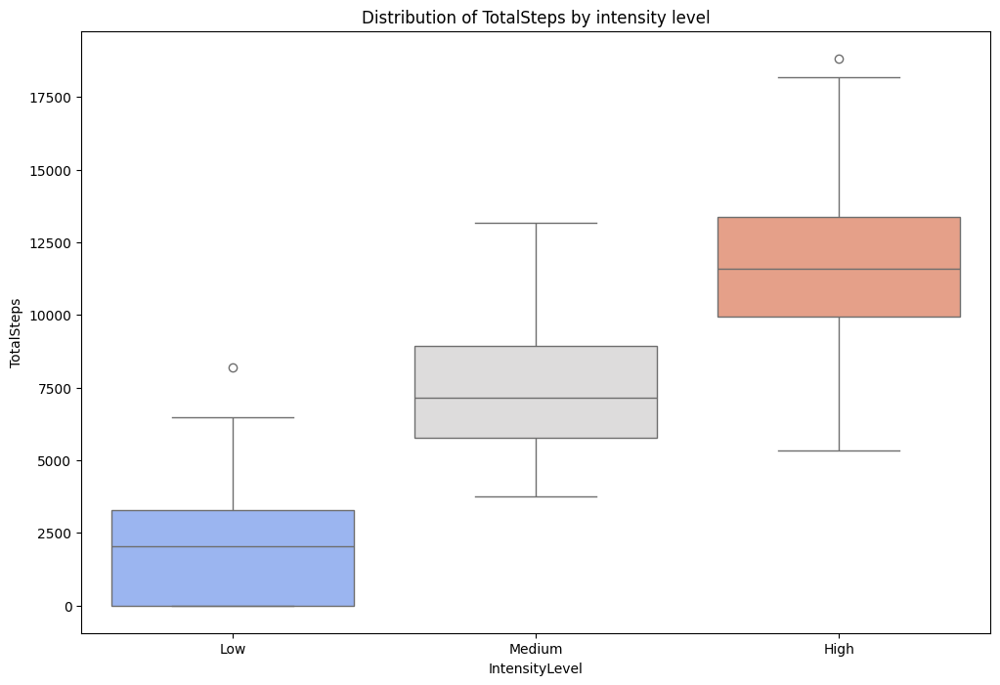

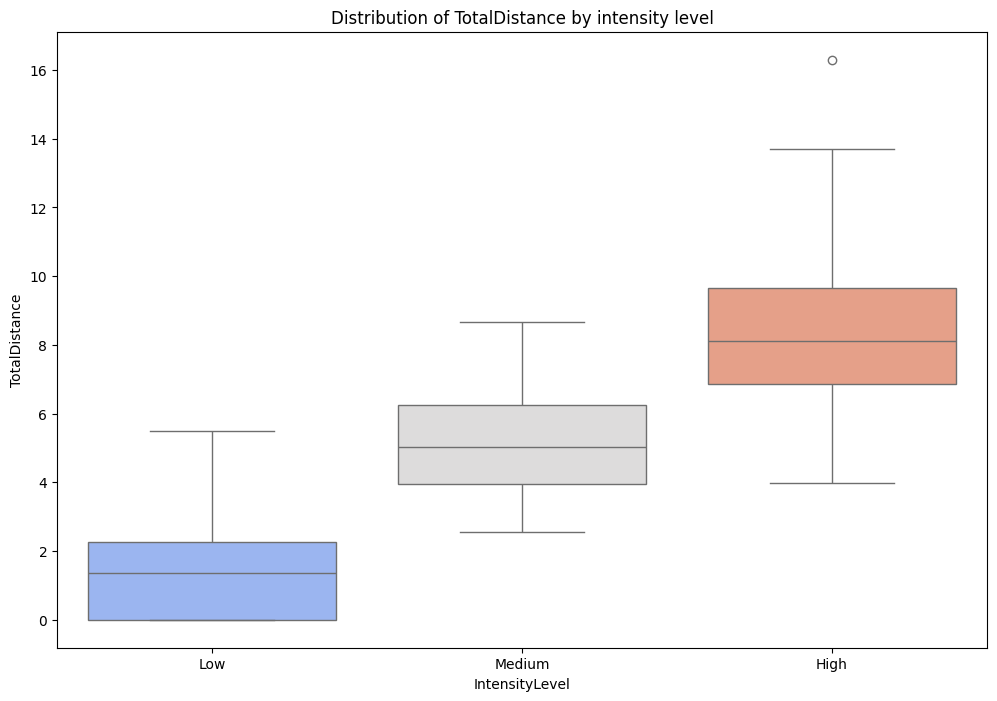

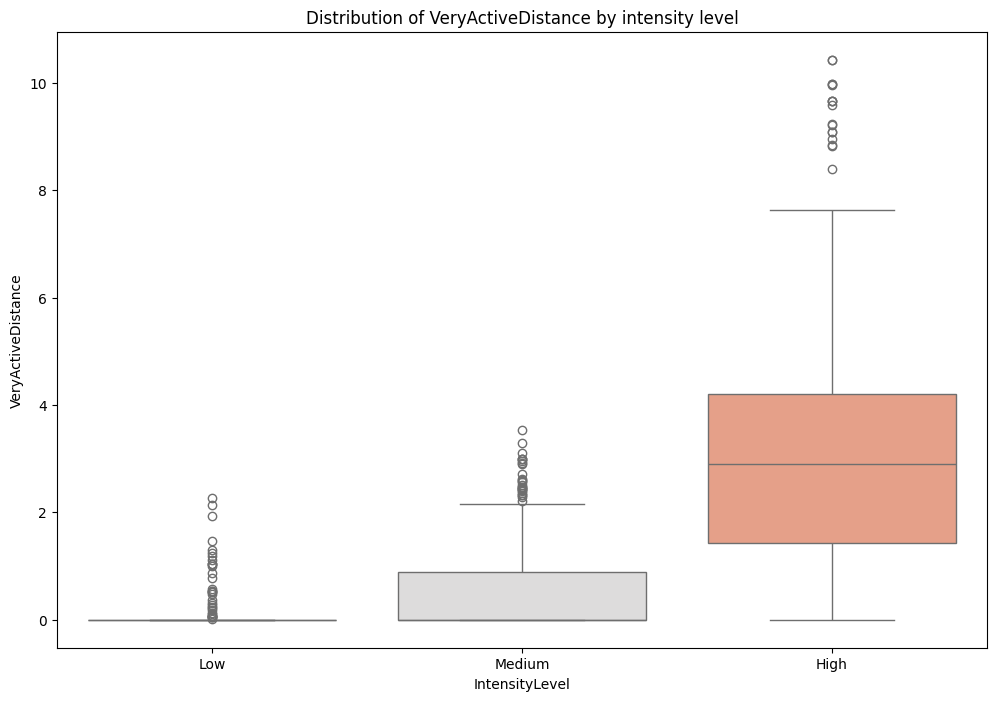

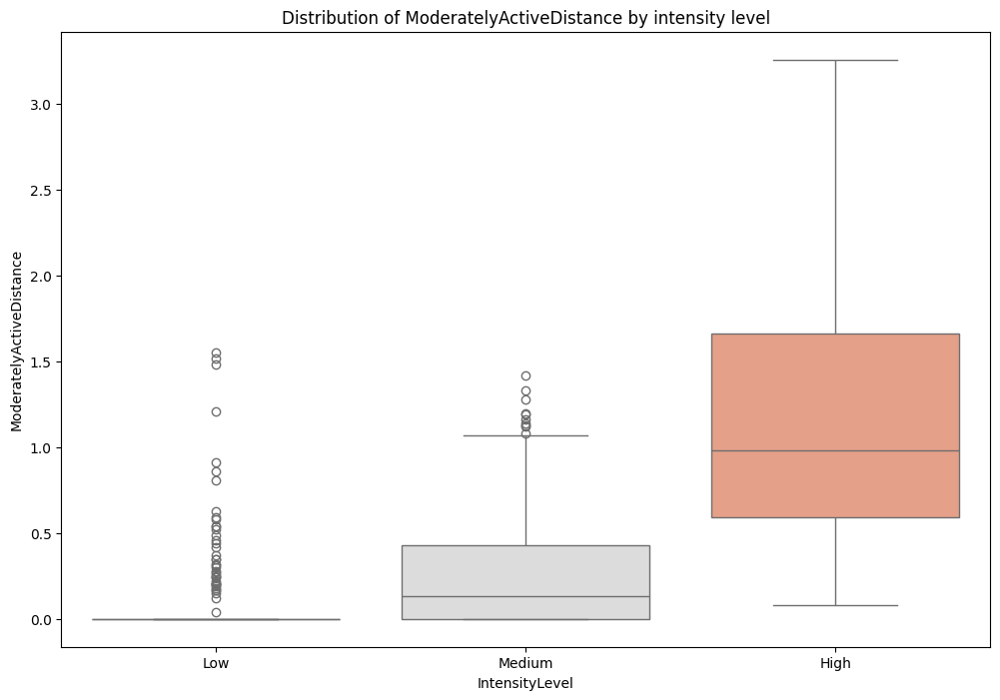

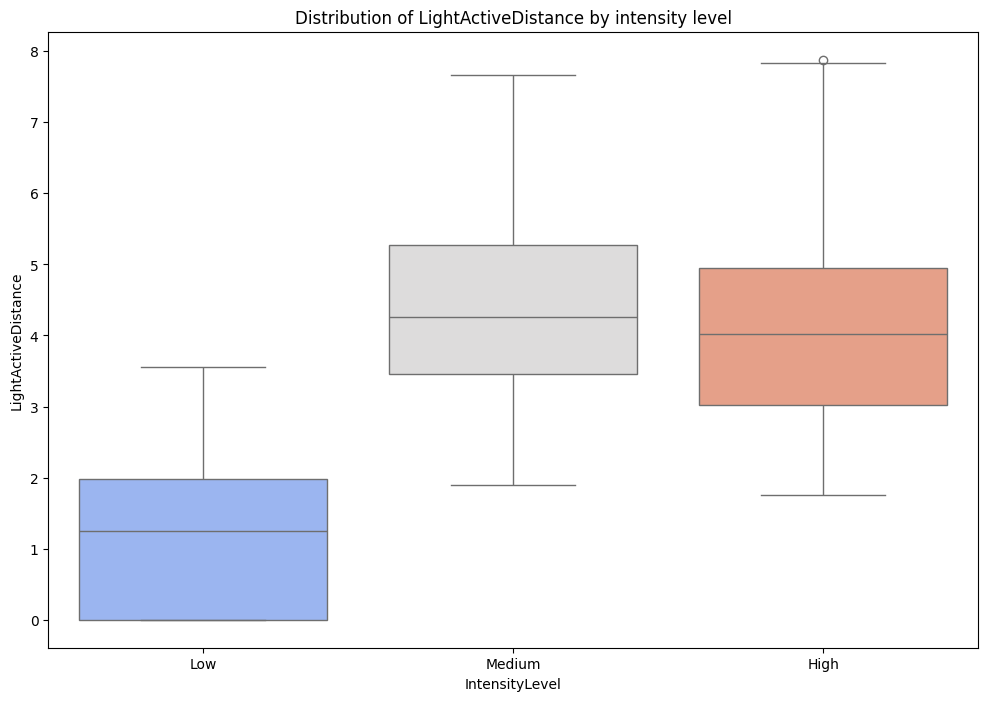

...

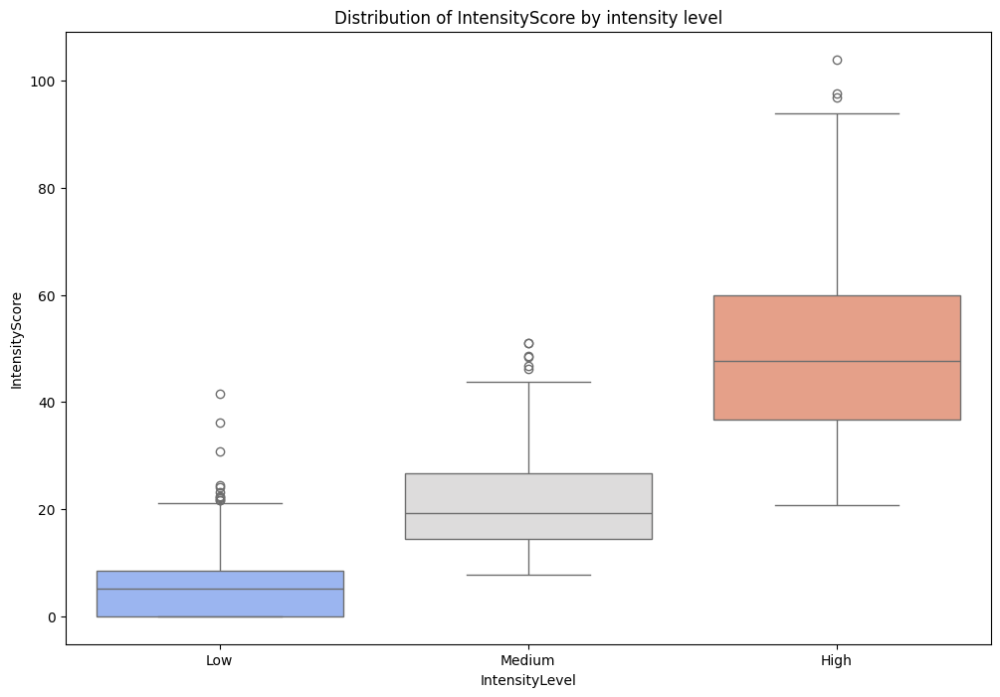

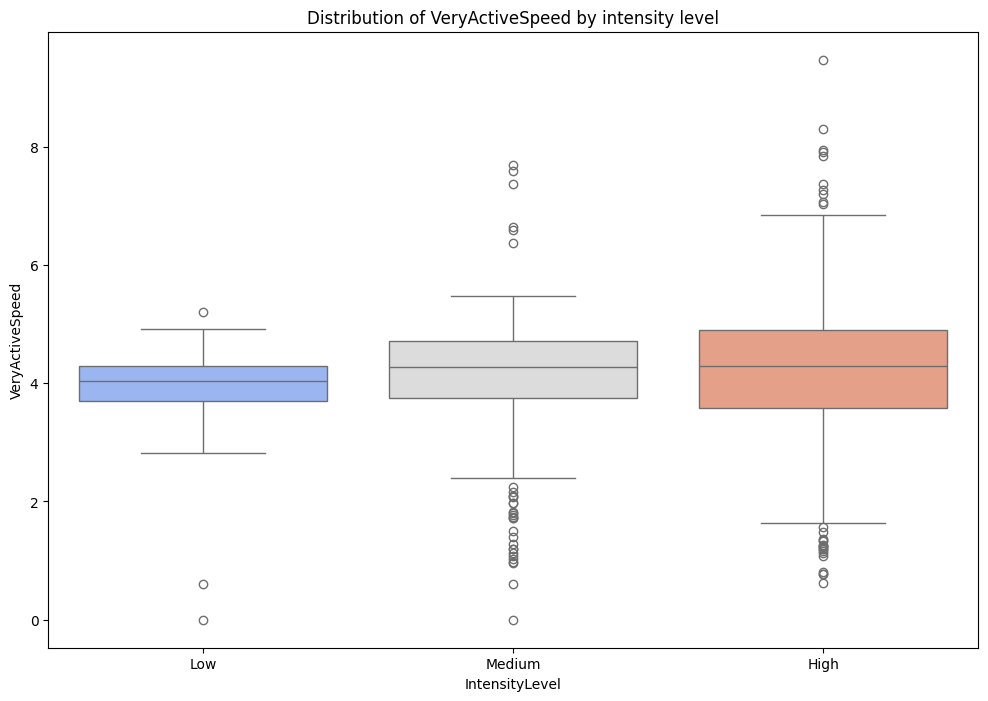

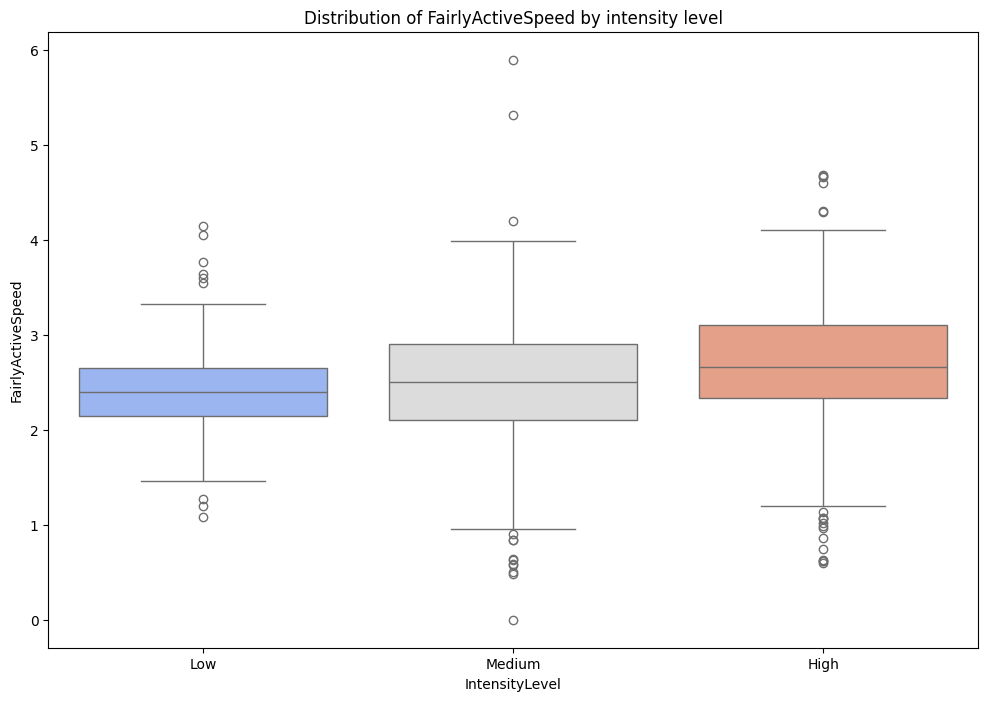

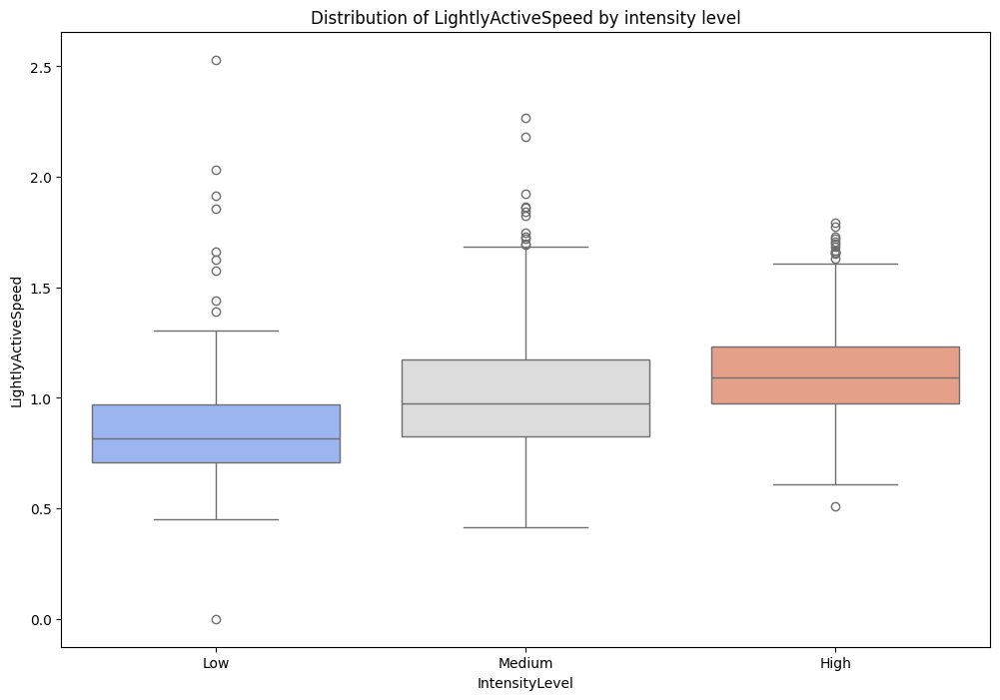

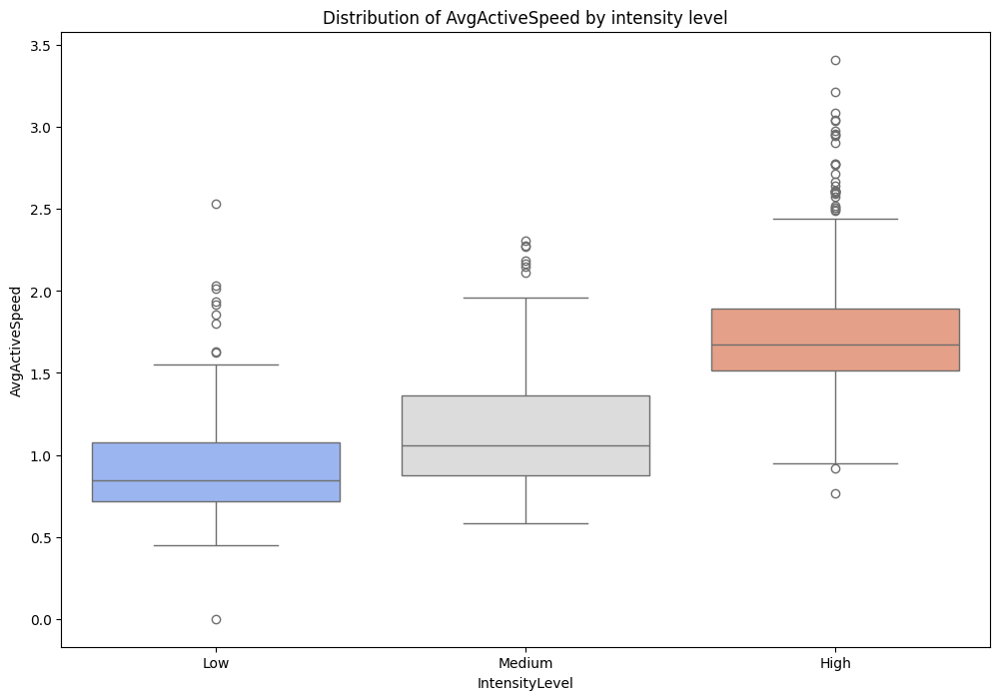

In [18]:
for i in need_info:
    plt.figure(figsize=(12,8))
    sns.boxplot(data=dailyActivity, x='IntensityLevel', y=i, palette='coolwarm',order=["Low","Medium","High"])
    plt.title('Distribution of ' + i + ' by intensity level')
    plt.show()

<Axes: xlabel='day_of_week', ylabel='Calories'>

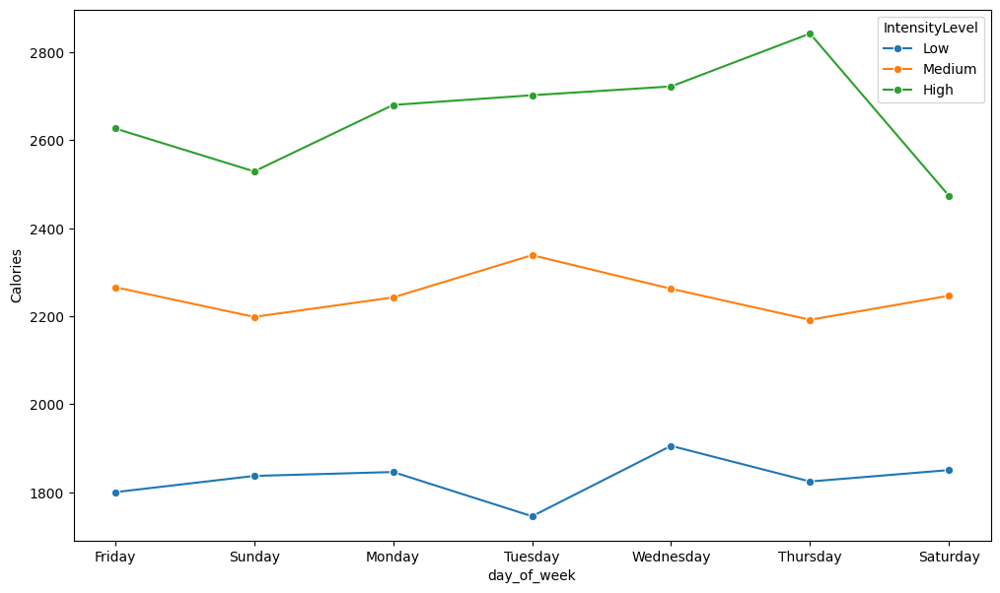

In [19]:
plt.figure(figsize=(12, 7))
sns.lineplot(data=dailyActivity, x='day_of_week', y='Calories', hue='IntensityLevel', marker='o', hue_order=['Low', 'Medium', 'High'],ci=None)

In [20]:
activity_counts = (
    dailyActivity
    .groupby('day_of_week')['IntensityLevel']
    .value_counts()
    .unstack(fill_value=0)
    .reindex(reversed(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']))
)
activity_counts = activity_counts[['Low', 'Medium', 'High']]
activity_counts

IntensityLevel,Low,Medium,High
day_of_week,,,
Sunday,61,55,30
Saturday,45,65,27
Friday,49,70,51
Thursday,45,66,45
Wednesday,48,70,52
Tuesday,40,74,60
Monday,46,61,51


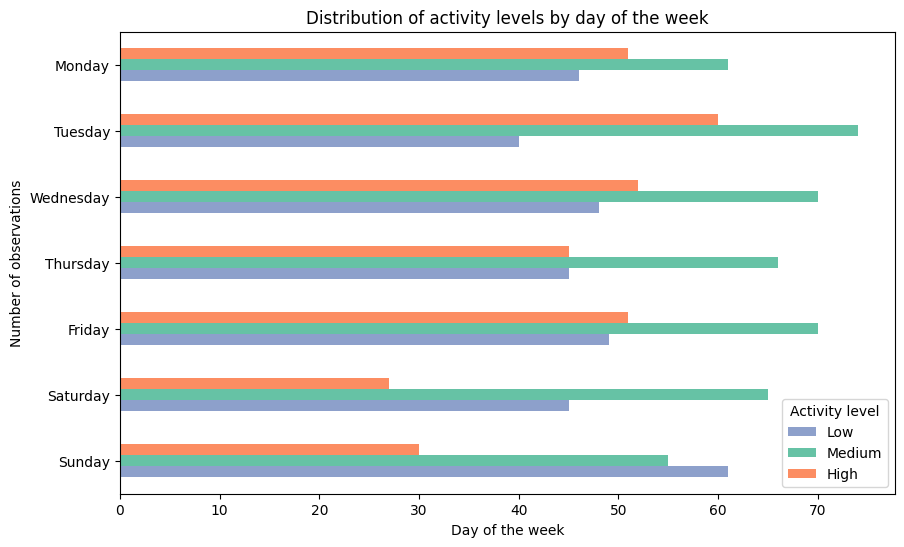

In [21]:
activity_counts.plot(
    kind='barh',
    stacked=False,
    figsize=(10,6),
    color=['#8da0cb', '#66c2a5', '#fc8d62']
)
plt.title('Distribution of activity levels by day of the week')
plt.xlabel('Day of the week')
plt.ylabel('Number of observations')
plt.legend(title='Activity level')
plt.show()

<Axes: xlabel='IntensityLevel'>

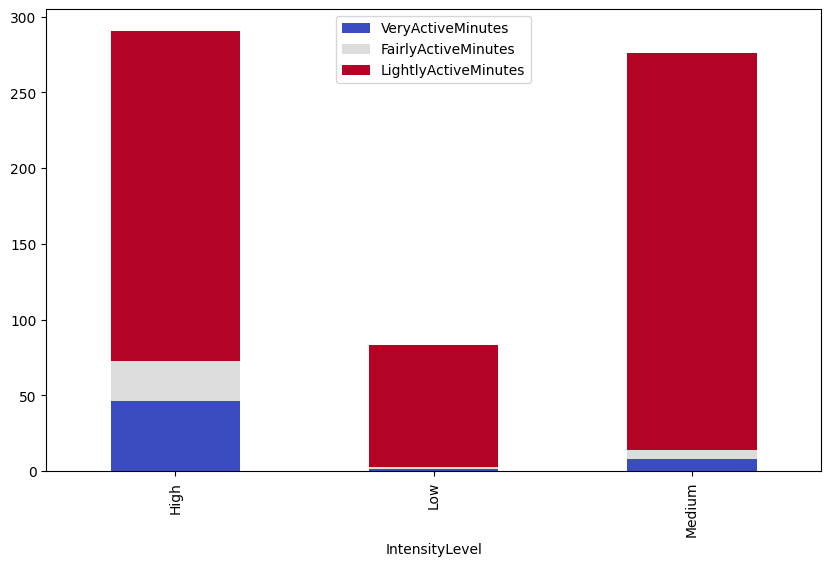

In [22]:
activity_structure = dailyActivity.groupby('IntensityLevel')[
    ['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes']
].mean()
activity_structure.plot(kind='bar', stacked=True, figsize=(10,6), colormap='coolwarm')

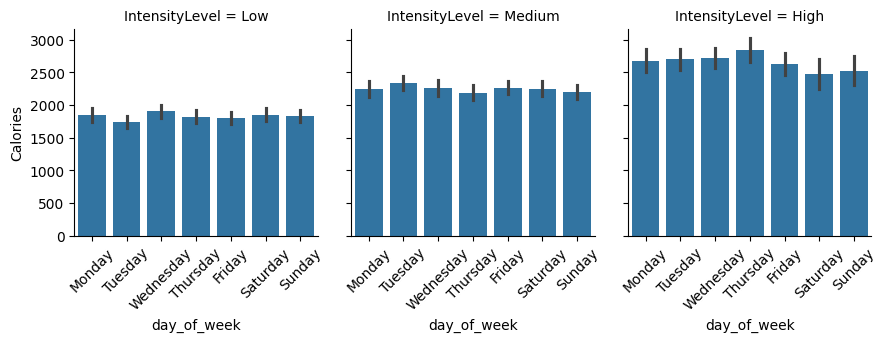

In [23]:
g = sns.FacetGrid(dailyActivity, col='IntensityLevel', col_order=['Low','Medium','High'])
g.map(sns.barplot, 'day_of_week', 'Calories', order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
g.set_xticklabels(rotation=45)


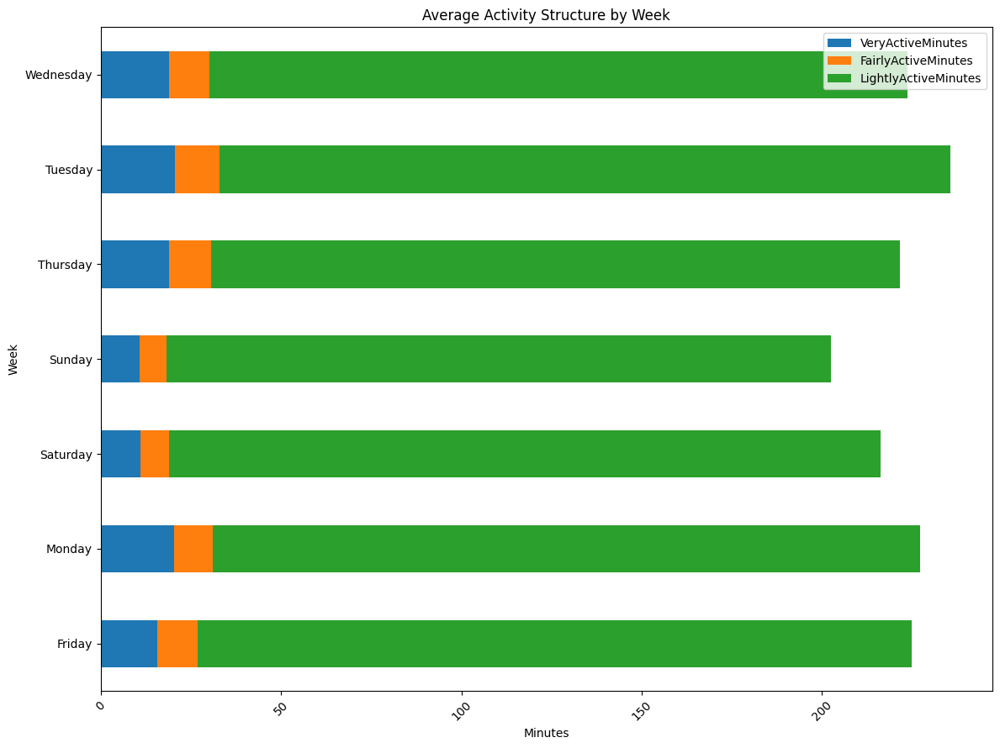

In [24]:
daily = dailyActivity.groupby('day_of_week')[['VeryActiveMinutes', 'FairlyActiveMinutes', 
                             'LightlyActiveMinutes']].mean()

daily.plot(kind='barh', stacked=True, figsize=(12,9))
plt.title('Average Activity Structure by Week')
plt.xlabel('Minutes')
plt.ylabel('Week')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<Axes: xlabel='IntensityLevel', ylabel='Activity_time'>

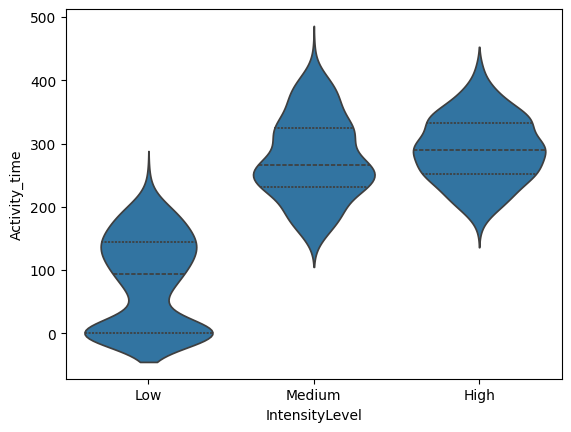

In [25]:
sns.violinplot(data=dailyActivity, x='IntensityLevel', y='Activity_time', inner='quartile',order=["Low","Medium","High"])

<Axes: xlabel='IntensityLevel', ylabel='AvgActiveSpeed'>

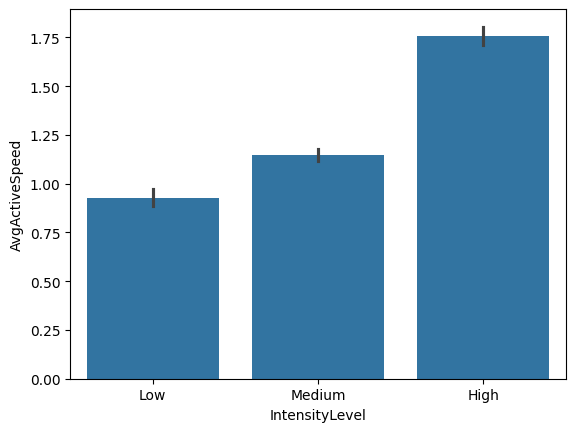

In [26]:
sns.barplot(data=dailyActivity, x='IntensityLevel', y='AvgActiveSpeed',order=["Low","Medium","High"])

<Axes: xlabel='day_of_week', ylabel='count'>

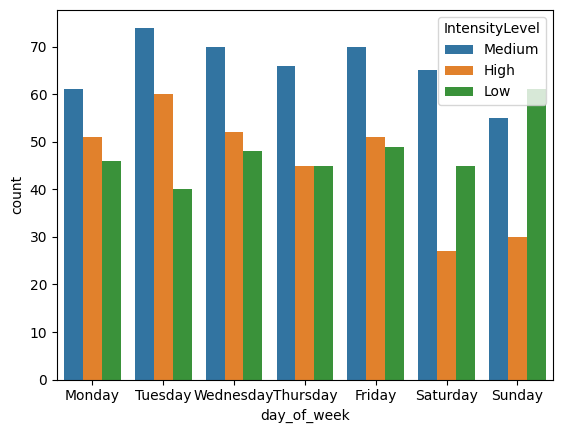

In [27]:
sns.countplot(data=dailyActivity, x='day_of_week', hue='IntensityLevel',order=["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"])

<Axes: xlabel='AvgActiveSpeed', ylabel='TotalDistance'>

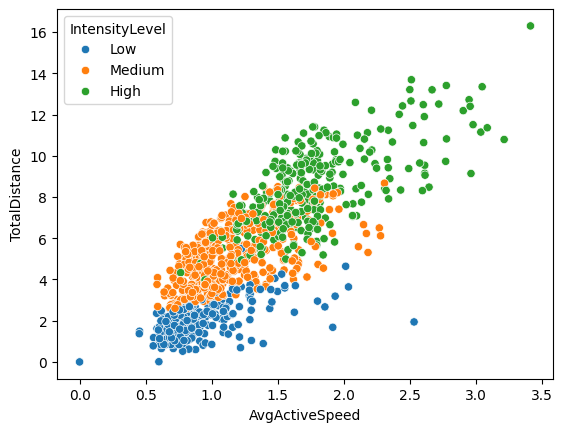

In [28]:
sns.scatterplot(data=dailyActivity, x='AvgActiveSpeed', y='TotalDistance', hue='IntensityLevel', hue_order=['Low', 'Medium', 'High'])

In [29]:
user_stats = dailyActivity.groupby('Id').agg({
    "ActivityDate": "size",
    'TotalSteps': 'mean',
    'TotalDistance': 'mean',
    'VeryActiveDistance': 'mean',
    'ModeratelyActiveDistance': 'mean',
    'LightActiveDistance': 'mean',
    'VeryActiveMinutes': 'mean',
    'FairlyActiveMinutes': 'mean',
    'LightlyActiveMinutes': 'mean',
    'Calories': 'mean',
    'Activity_time': 'mean',
    'ActiveRatio': 'mean',
    'IntensityScore': 'mean',
    'VeryActiveSpeed': 'mean',
    'FairlyActiveSpeed': 'mean',
    'LightlyActiveSpeed': 'mean',
    'AvgActiveSpeed': 'mean',
}).reset_index()
user_stats

,Id,ActivityDate,TotalSteps,TotalDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,Calories,Activity_time,ActiveRatio,IntensityScore,VeryActiveSpeed,FairlyActiveSpeed,LightlyActiveSpeed,AvgActiveSpeed
0,1503960366,47,12318.212766,7.977660,2.863404,0.765106,4.342340,38.127660,18.680851,231.297872,1877.297872,288.106383,26.062377,43.337166,4.484735,2.433953,1.126571,1.669772
1,1624580081,45,4299.200000,2.816667,0.181778,0.166889,2.459333,2.155556,2.844444,141.644444,1432.288889,146.644444,10.183642,9.990483,5.077363,3.715748,0.989419,1.072911
2,1644430081,32,7350.718750,5.345313,0.856875,0.957500,3.526250,11.125000,21.000000,178.281250,2857.156250,210.406250,15.081280,23.016067,4.456661,2.741356,1.255185,1.536407
3,1844505072,34,3554.000000,2.350000,0.025588,0.047941,2.274706,0.382353,1.235294,158.558824,1689.823529,160.176471,13.174188,9.286781,3.955556,2.304167,0.866608,0.883461
4,1927972279,28,1379.535714,0.955357,0.000000,0.026429,0.928929,0.000000,0.714286,69.107143,2255.285714,69.821429,5.996742,3.984795,NaN,2.242424,0.815776,0.827866
5,2022484408,39,11353.461538,8.094872,2.499744,0.717692,4.877692,35.282051,18.641026,258.769231,2499.025641,312.692308,21.927475,42.928802,4.330591,2.414075,1.132461,1.550046
6,2026352035,35,4738.457143,2.939714,0.005429,0.010000,2.923714,0.085714,0.228571,232.200000,1507.400000,232.514286,25.121595,12.845850,3.800000,2.625000,0.740855,0.744483
7,2320127002,41,4368.902439,2.953415,0.103902,0.087073,2.760244,1.292683,2.268293,181.902439,1705.341463,185.463415,12.900033,11.460447,4.475714,2.390807,0.897380,0.935426
8,2347167796,28,9395.964286,6.248571,0.803929,1.103214,4.340357,10.928571,20.642857,261.250000,2089.750000,292.821429,29.763605,27.332931,4.272350,3.007115,1.002715,1.291885
9,2873212765,39,7558.179487,5.097949,0.491795,0.284103,4.317436,8.487179,6.410256,313.923077,1890.743590,328.820513,23.156201,24.651835,3.669864,2.460164,0.823009,0.931546


<BarContainer object of 35 artists>

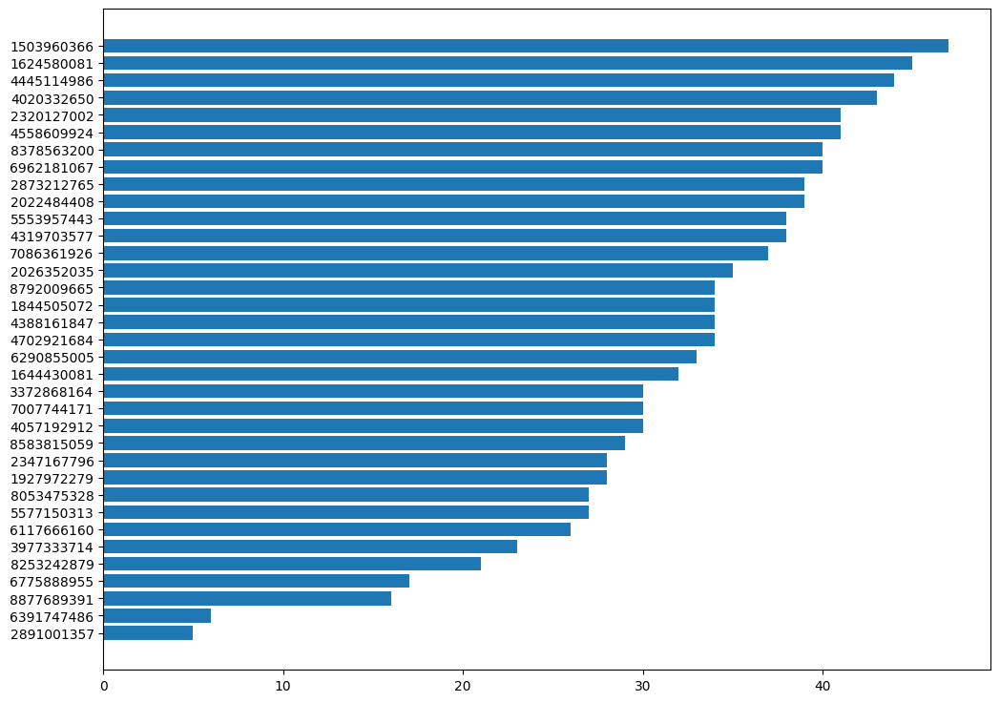

In [30]:
plt.figure(figsize=(12,9))
plt.barh(data=user_stats.sort_values(by="ActivityDate"),width="ActivityDate",y="Id")

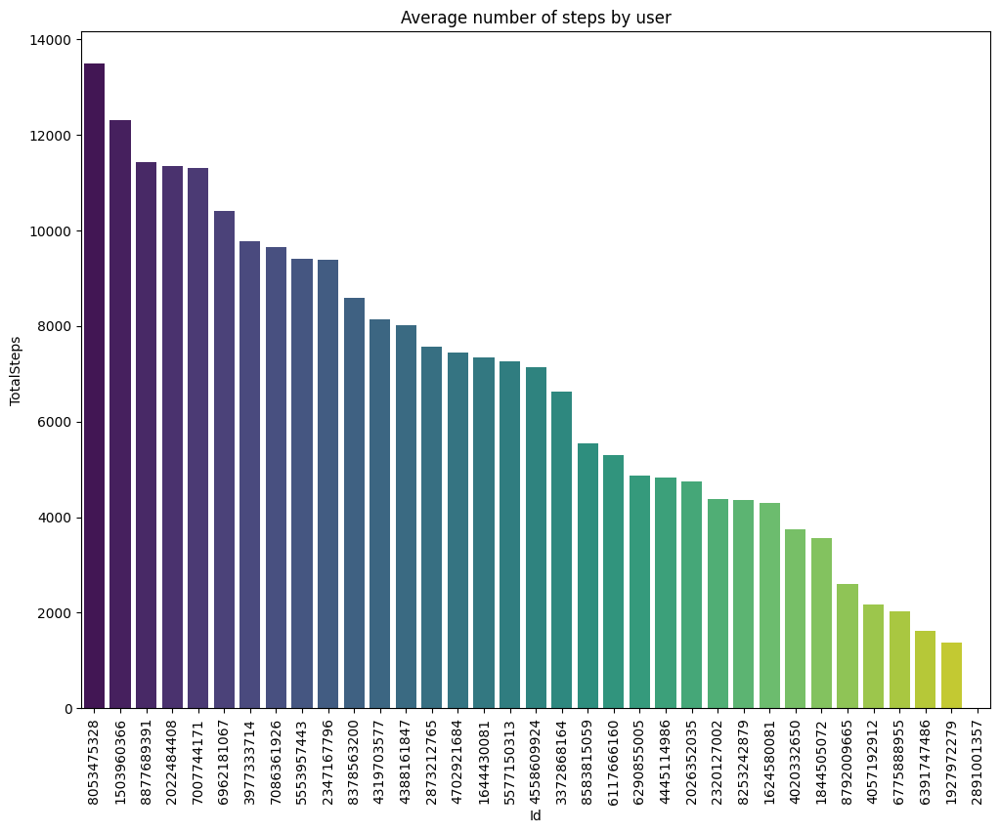

In [31]:
plt.figure(figsize=(12,9))
sns.barplot(data=user_stats.sort_values('TotalSteps', ascending=False),
            x='Id', y='TotalSteps', palette='viridis')
plt.xticks(rotation=90)
plt.title('Average number of steps by user')
plt.show()


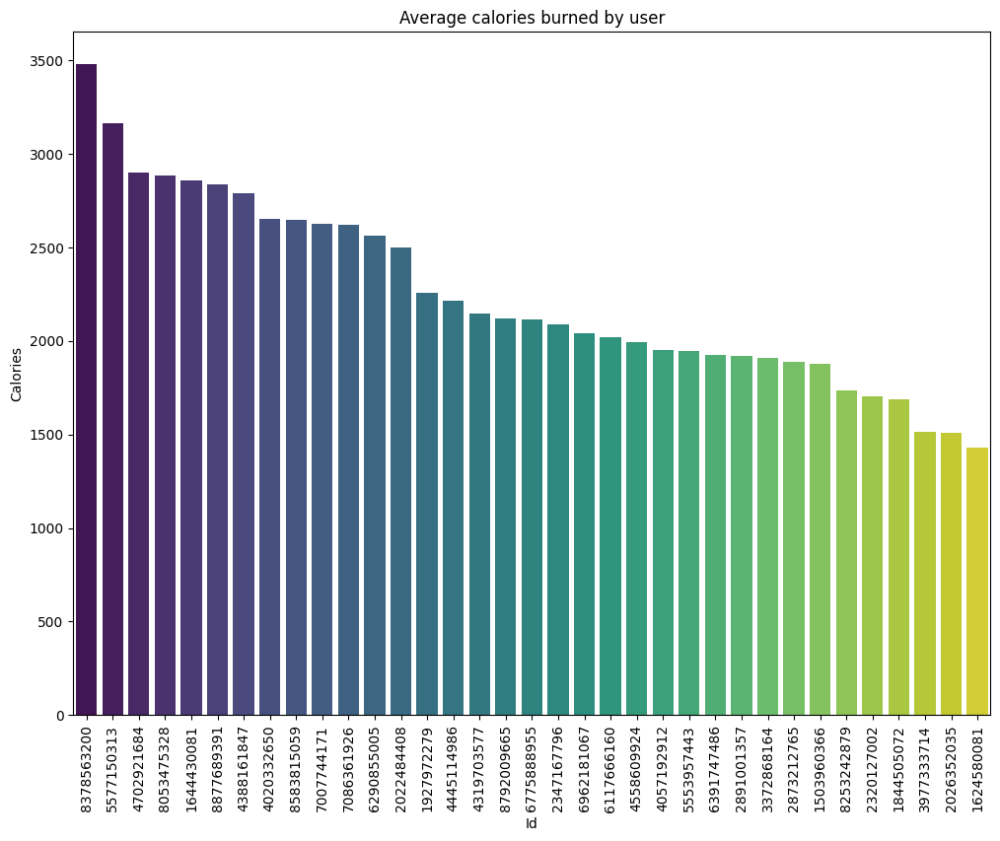

In [32]:
plt.figure(figsize=(12,9))
sns.barplot(data=user_stats.sort_values('Calories', ascending=False),
            x='Id', y='Calories', palette='viridis')
plt.xticks(rotation=90)
plt.title('Average calories burned by user')
plt.show()

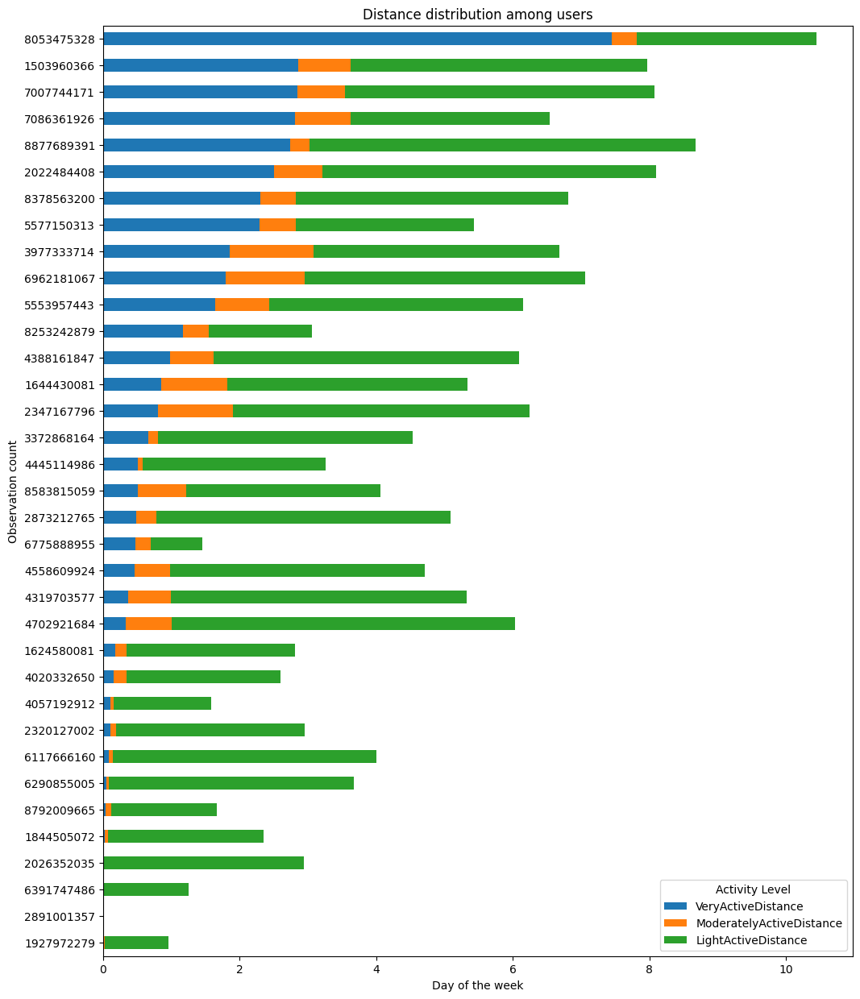

In [33]:
temp=user_stats.set_index("Id")[["VeryActiveDistance","ModeratelyActiveDistance","LightActiveDistance"]]
temp["sum"]=user_stats.set_index("Id")[["VeryActiveDistance","ModeratelyActiveDistance","LightActiveDistance"]].sum(axis=1)
temp=temp.sort_values(by="VeryActiveDistance",ascending=True)
temp[["VeryActiveDistance","ModeratelyActiveDistance","LightActiveDistance"]].plot(
    kind='barh',
    stacked=True,
    figsize=(12,15),
)
plt.title('Distance distribution among users')
plt.xlabel('Day of the week')
plt.ylabel('Observation count')
plt.legend(title='Activity Level')
plt.show()

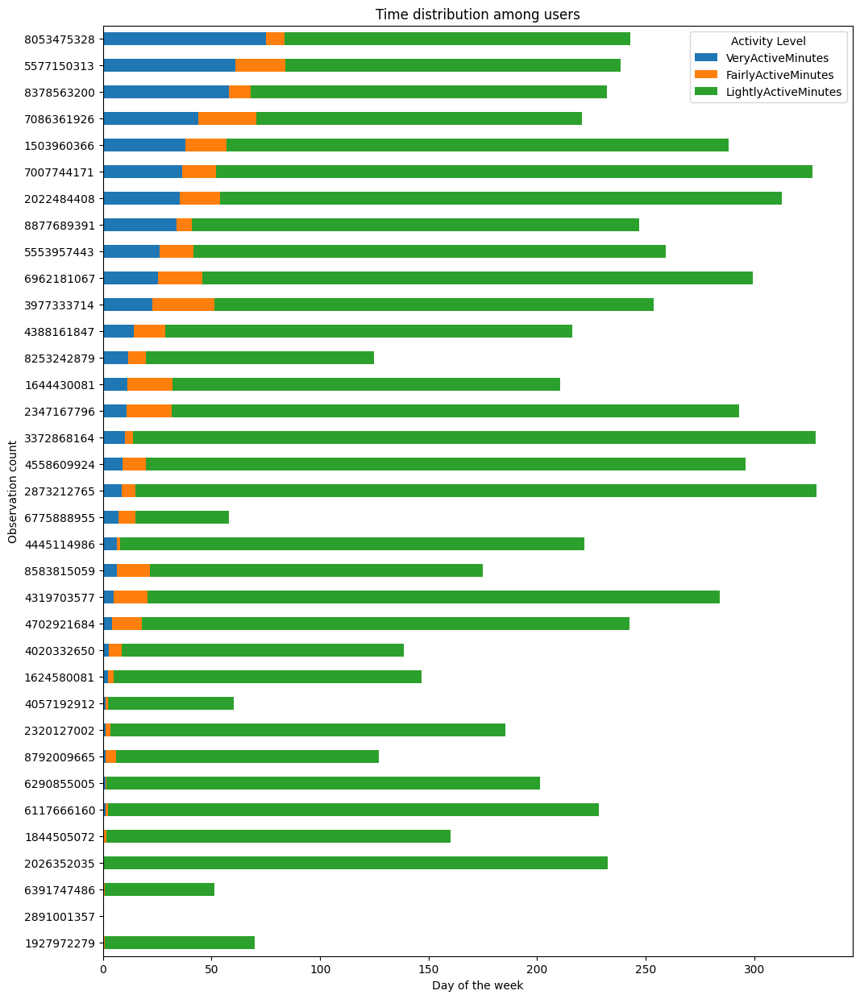

In [34]:
temp=user_stats.set_index("Id")[['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes',]]
temp["sum"]=user_stats.set_index("Id")[['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes',]].sum(axis=1)
temp=temp.sort_values(by="VeryActiveMinutes",ascending=True)
temp[['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes',]].plot(
    kind='barh',
    stacked=True,
    figsize=(12,15),
)
plt.title('Time distribution among users')
plt.xlabel('Day of the week')
plt.ylabel('Observation count')
plt.legend(title='Activity Level')
plt.show()

Text(0.5, 1.0, 'Activity level distribution among users (%)')

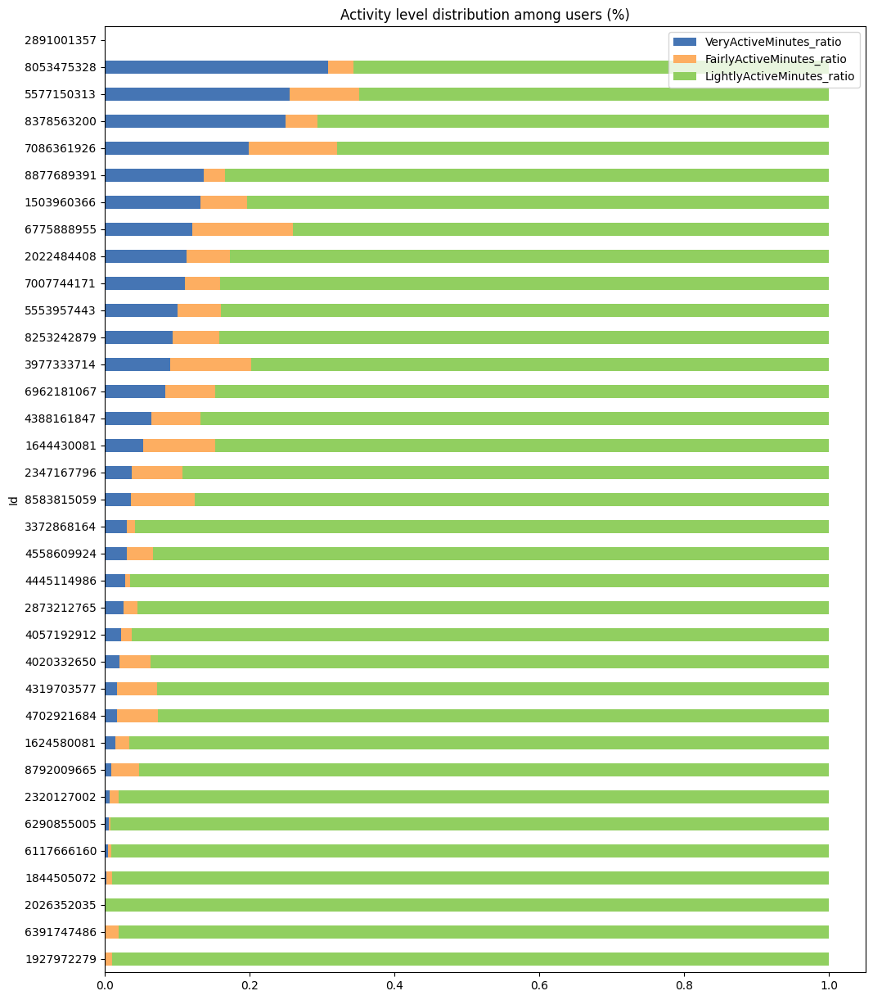

In [35]:
temp['TotalActiveMinutes'] = user_stats.set_index("Id")[['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes']].sum(axis=1)
for col in ['VeryActiveMinutes', 'FairlyActiveMinutes', 'LightlyActiveMinutes']:
    temp[f'{col}_ratio'] = temp[col] / temp['TotalActiveMinutes']
ratios = temp[['VeryActiveMinutes_ratio', 'FairlyActiveMinutes_ratio', 'LightlyActiveMinutes_ratio']].sort_values(by="VeryActiveMinutes_ratio")
ratios.plot(kind='barh', stacked=True, figsize=(12,15), color=['#4575b4','#fdae61','#91cf60'])
plt.title('Activity level distribution among users (%)')

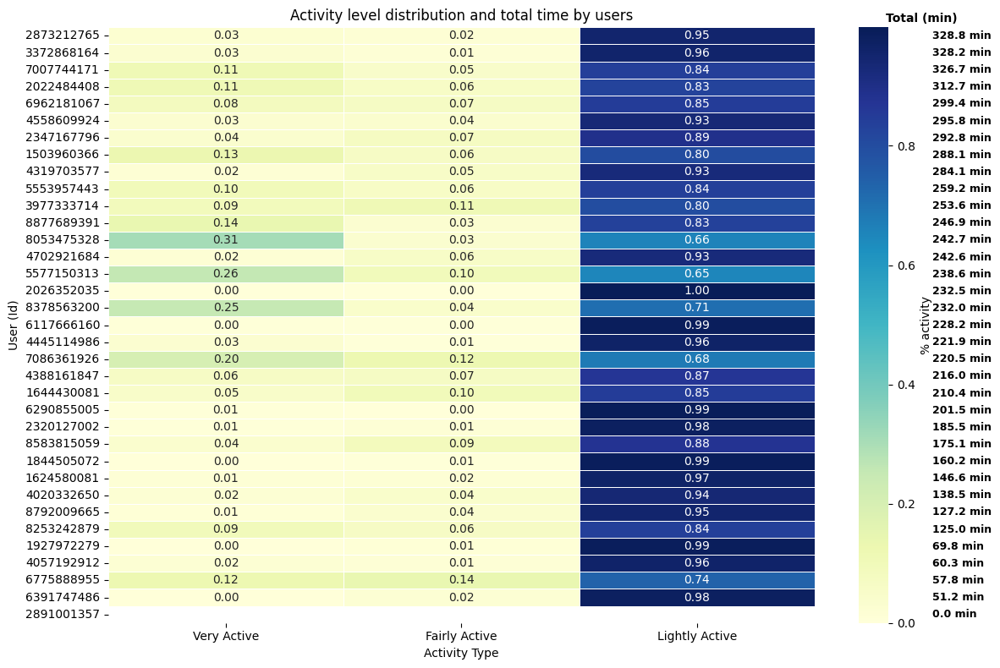

In [36]:
ratios["sum"]=temp["sum"]
ratios = ratios.sort_values('sum', ascending=False)
ratio_cols = ['VeryActiveMinutes_ratio', 'FairlyActiveMinutes_ratio', 'LightlyActiveMinutes_ratio']
ratios_only = ratios[ratio_cols]
sum_col = ratios['sum']
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    ratios_only,
    cmap='YlGnBu',
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={'label': '% activity'},
    ax=ax
)
ax.set_title('Activity level distribution and total time by users')
ax.set_xlabel('Activity Type')
ax.set_ylabel('User (Id)')
ax.set_xticks([x + 0.5 for x in range(len(ratio_cols))])
ax.set_xticklabels(['Very Active', 'Fairly Active', 'Lightly Active'])

for y, total in enumerate(sum_col.round(1)):
    ax.text(
        len(ratio_cols) + 0.5, y + 0.5,
        f"{total} min",
        va='center', ha='left', fontsize=9, color='black', weight='bold'
    )
ax.text(len(ratio_cols) + 0.3, -0.3, "Total (min)", fontsize=10, weight='bold')
plt.tight_layout()
plt.show()

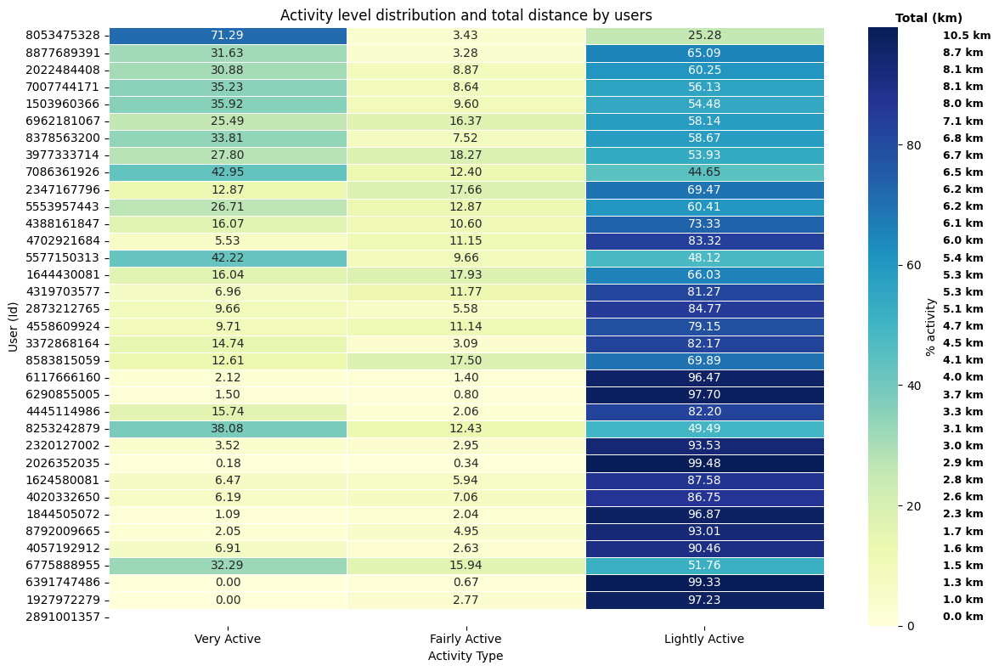

In [37]:
temp=user_stats.set_index("Id")[["VeryActiveDistance","ModeratelyActiveDistance","LightActiveDistance"]]
temp["sum"]=user_stats.set_index("Id")[["VeryActiveDistance","ModeratelyActiveDistance","LightActiveDistance"]].sum(axis=1)
temp['TotalActiveDistance'] = user_stats.set_index("Id")[['VeryActiveDistance', 'ModeratelyActiveDistance', 'LightActiveDistance']].sum(axis=1)
for col in ['VeryActiveDistance', 'ModeratelyActiveDistance', 'LightActiveDistance']:
    temp[f'{col}_ratio'] = temp[col] / temp['TotalActiveDistance']
ratios = temp[['VeryActiveDistance_ratio', 'ModeratelyActiveDistance_ratio', 'LightActiveDistance_ratio']].sort_values(by="VeryActiveDistance_ratio")
ratios["sum"]=temp["sum"]
ratios = ratios.sort_values('sum', ascending=False)
ratio_cols = ['VeryActiveDistance_ratio', 'ModeratelyActiveDistance_ratio', 'LightActiveDistance_ratio']
ratios_only = ratios[ratio_cols]*100
sum_col = ratios['sum']
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    ratios_only,
    cmap='YlGnBu',
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={'label': '% activity'},
    ax=ax
)
ax.set_title('Activity level distribution and total distance by users')
ax.set_xlabel('Activity Type')
ax.set_ylabel('User (Id)')
ax.set_xticks([x + 0.5 for x in range(len(ratio_cols))])
ax.set_xticklabels(['Very Active', 'Fairly Active', 'Lightly Active'])
for y, total in enumerate(sum_col.round(1)):
    ax.text(
        len(ratio_cols) + 0.5, y + 0.5,
        f"{total} km",
        va='center', ha='left', fontsize=9, color='black', weight='bold'
    )
ax.text(len(ratio_cols) + 0.3, -0.3, "Total (km)", fontsize=10, weight='bold')
plt.tight_layout()
plt.show()

In [38]:
def extract_behavior_patterns(df):
    users = []
    for user_id, group in df.groupby('Id'):
        group = group.sort_values('ActivityDate')

        # 1️⃣ Mean Intensity Score
        avg_intensity = group['IntensityScore'].mean()

        # 2️⃣ Activity Stability (1 - Coefficient of Variation)
        stability = 1 - (group['IntensityScore'].std() / group['IntensityScore'].mean()
                         if group['IntensityScore'].mean() > 0 else 0)

        # 3️⃣ Activity Trend (Slope of Linear Regression)
        if len(group) > 2:
            slope, _, _, _, _ = linregress(range(len(group)), group['IntensityScore'])
        else:
            slope = np.nan

        # 4️⃣ Weekend Activity vs Weekday Activity
        weekend_mask = group['day_of_week'].isin(['Saturday', 'Sunday'])
        weekend_mean = group.loc[weekend_mask, 'IntensityScore'].mean()
        weekday_mean = group.loc[~weekend_mask, 'IntensityScore'].mean()
        weekend_ratio = (weekend_mean / weekday_mean) if weekday_mean > 0 else np.nan

        # 5️⃣ Most Active Day of the Week
        most_active_day = (group.groupby('day_of_week')['IntensityScore']
                           .mean()
                           .idxmax())

        # 6️⃣ High Activity Days Ratio
        high_ratio = (group['IntensityLevel'] == 'High').mean()


        # 8️⃣ Dominant Activity Level
        dominant_level = group['IntensityLevel'].mode()[0]

        users.append({
            'Id': user_id,
            'avg_intensity_score': avg_intensity,
            'activity_stability': stability,
            'trend_score': slope,
            'weekend_activity_ratio': weekend_ratio,
            'most_active_day': most_active_day,
            'high_activity_ratio': high_ratio,
            'dominant_intensity_level': dominant_level
        })

    return pd.DataFrame(users)
user_patterns = extract_behavior_patterns(dailyActivity)

In [39]:
user_patterns.head()

,Id,avg_intensity_score,activity_stability,trend_score,weekend_activity_ratio,most_active_day,high_activity_ratio,dominant_intensity_level
0,1503960366,43.337166,0.787018,0.170277,1.020379,Tuesday,0.638298,High
1,1624580081,9.990483,0.350975,0.091498,1.495001,Sunday,0.022222,Low
2,1644430081,23.016067,0.341443,-0.419797,1.503994,Saturday,0.468750,High
3,1844505072,9.286781,0.216353,-0.429742,0.819121,Thursday,0.000000,Low
4,1927972279,3.984795,-0.136862,-0.340946,1.497019,Friday,0.000000,Low


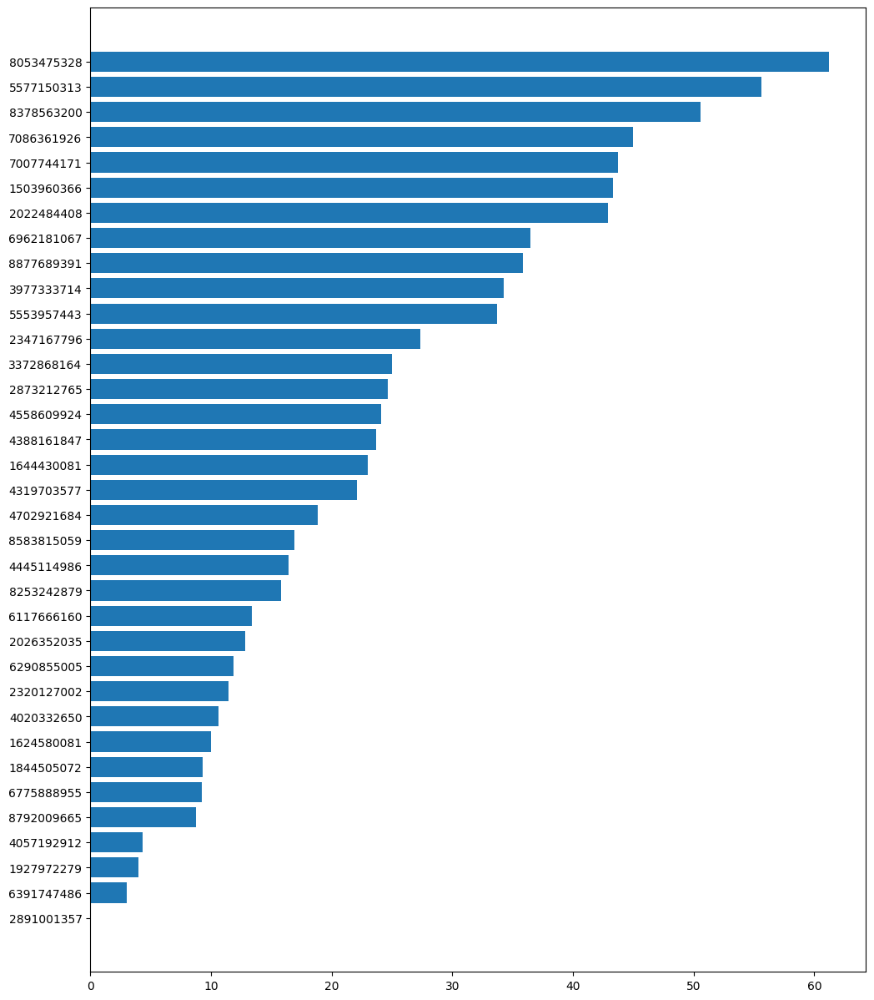

In [40]:
plt.figure(figsize=(12,15))
plt.barh(data=user_patterns.sort_values(by="avg_intensity_score"),y="Id",width="avg_intensity_score")
plt.show()

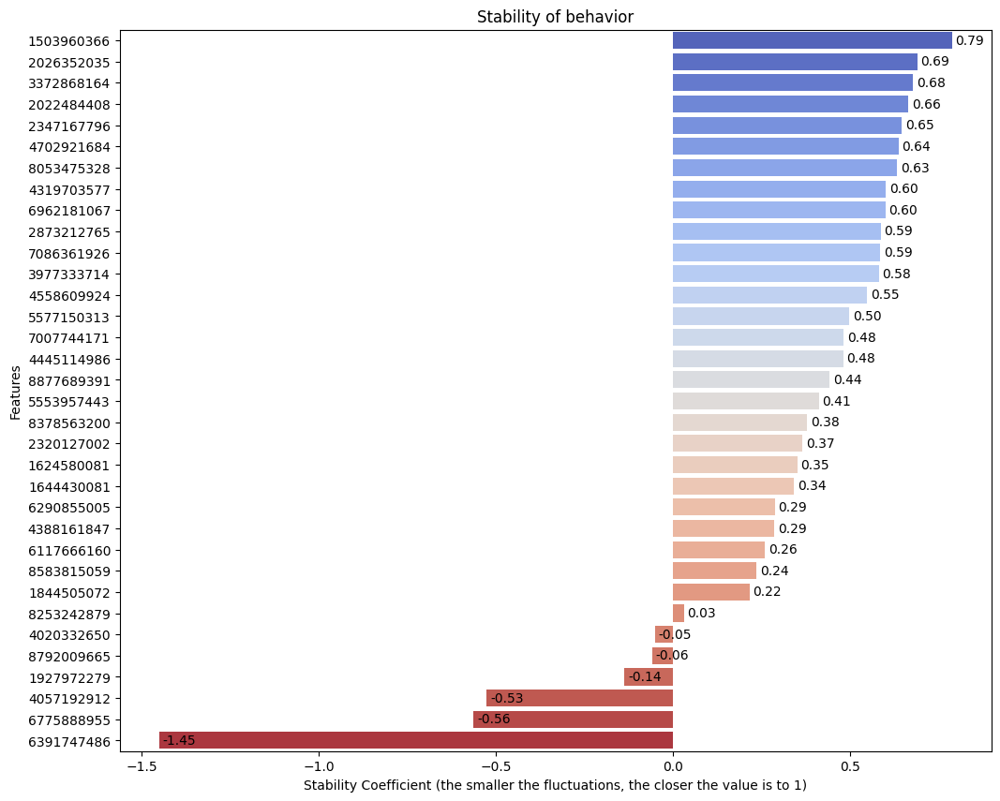

In [41]:
# визуализация
plt.figure(figsize=(12,10))
ax=sns.barplot(data=user_patterns[user_patterns["Id"]!="2891001357"].sort_values(by="activity_stability",ascending=False),x="activity_stability", y="Id", palette='coolwarm')
for p, value in zip(ax.patches, user_patterns[user_patterns["Id"]!="2891001357"].sort_values(by="activity_stability",ascending=False)['activity_stability']):
    ax.text(
        p.get_width() + 0.01,              
        p.get_y() + p.get_height() / 2,     
        f"{value:.2f}",                   
        va='center'
    )
plt.title('Stability of behavior')
plt.xlabel('Stability Coefficient (the smaller the fluctuations, the closer the value is to 1)')
plt.ylabel('Features')
plt.show()

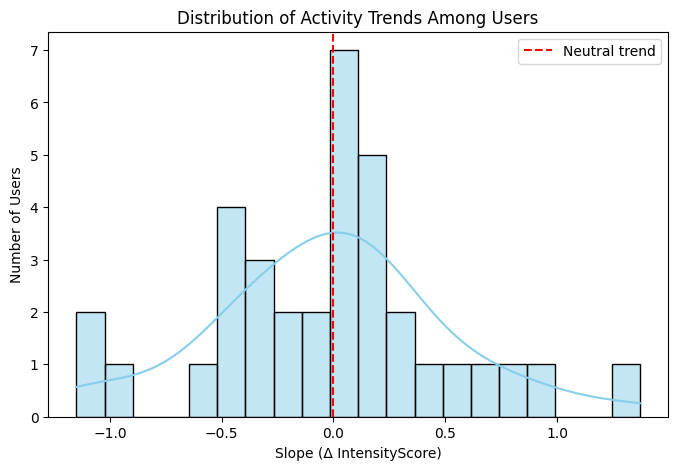

In [42]:
plt.figure(figsize=(8,5))
sns.histplot(user_patterns['trend_score'], bins=20, kde=True, color='skyblue')
plt.axvline(0, color='red', linestyle='--', label='Neutral trend')
plt.title("Distribution of Activity Trends Among Users")
plt.xlabel("Slope (Δ IntensityScore)")
plt.ylabel("Number of Users")
plt.legend()
plt.show()


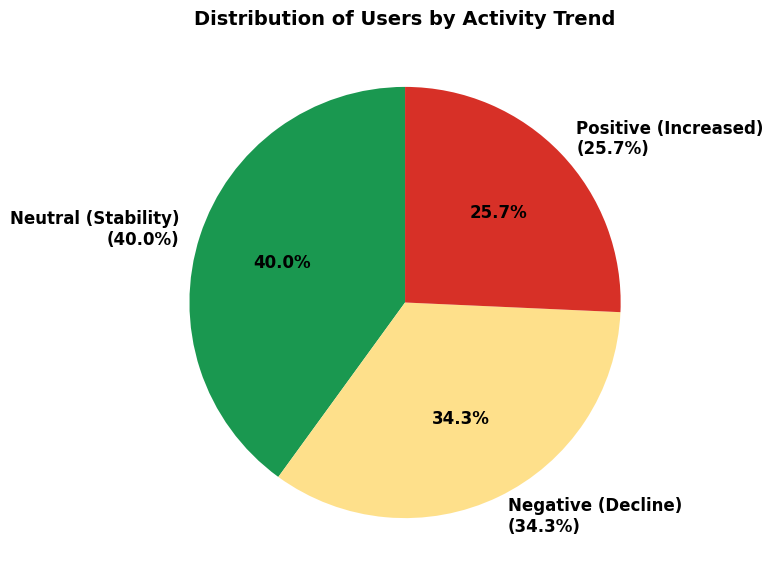

In [43]:
def categorize_trend(value, neutral_threshold=0.2):
    if value > neutral_threshold:
        return 'Positive (Increased)'
    elif value < -neutral_threshold:
        return 'Negative (Decline)'
    else:
        return 'Neutral (Stability)'

user_patterns['trend_category'] = user_patterns['trend_score'].apply(categorize_trend)
trend_counts = user_patterns['trend_category'].value_counts(normalize=True) * 100
colors = ['#1a9850', '#fee08b', '#d73027']
labels = [f'{cat}\n({pct:.1f}%)' for cat, pct in zip(trend_counts.index, trend_counts.values)]
plt.figure(figsize=(7,7))
plt.pie(
    trend_counts.values,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',
    startangle=90,
    textprops={'fontsize': 12, 'weight': 'bold'}
)
plt.title('Distribution of Users by Activity Trend', fontsize=14, weight='bold')
plt.show()

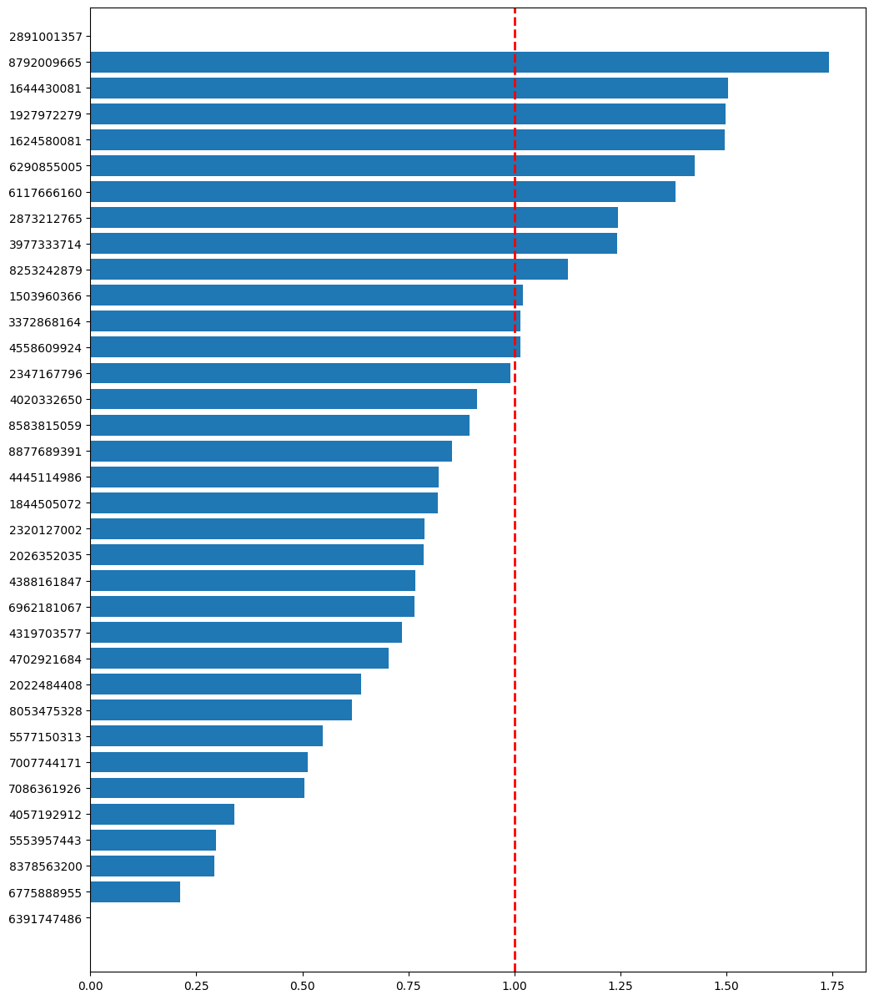

In [44]:
plt.figure(figsize=(12,15))
plt.barh(data=user_patterns.sort_values(by="weekend_activity_ratio"),y="Id",width="weekend_activity_ratio")
plt.axvline(1, color='red', linestyle='--', linewidth=2, label='Neutral trend')
plt.show()

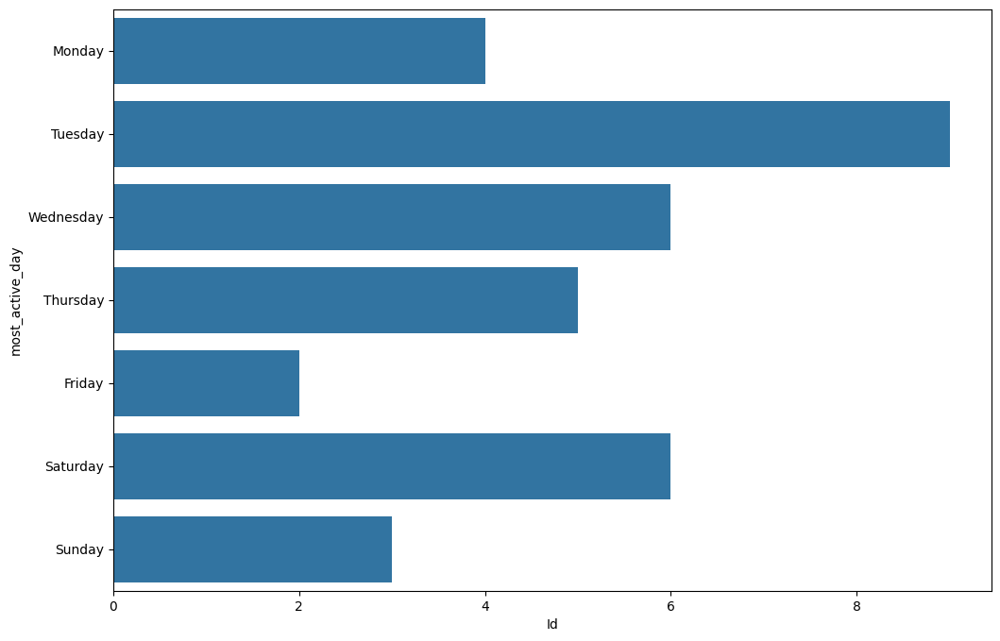

In [45]:
temp_data=user_patterns.groupby("most_active_day")["Id"].count().reset_index()
plt.figure(figsize=(12,8))
sns.barplot(data=temp_data,y="most_active_day",x="Id",order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
plt.show()

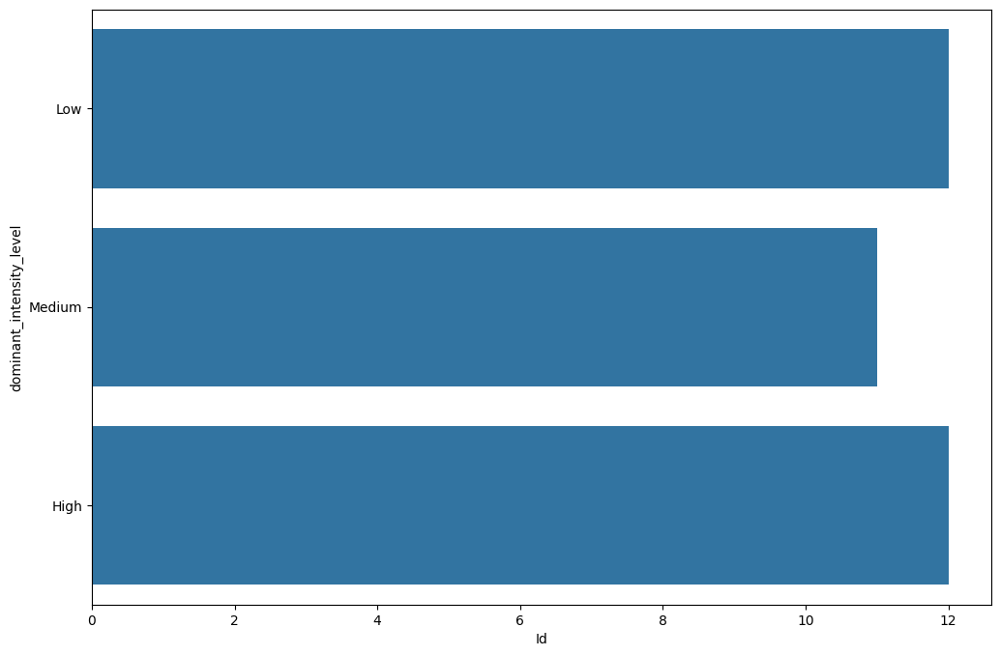

In [46]:
temp_data=user_patterns.groupby("dominant_intensity_level")["Id"].count().reset_index()
plt.figure(figsize=(12,8))
sns.barplot(data=temp_data,y="dominant_intensity_level",x="Id",order=['Low','Medium','High'])
plt.show()

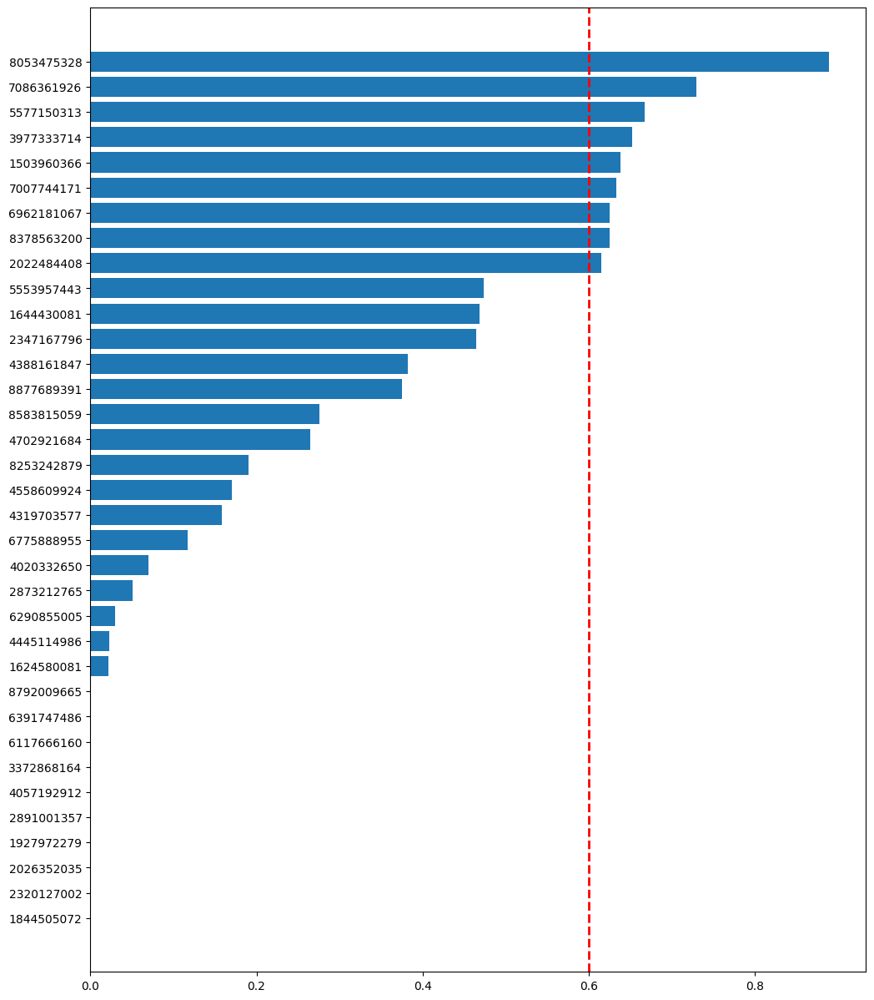

In [47]:
plt.figure(figsize=(12,15))
plt.barh(data=user_patterns.sort_values(by="high_activity_ratio"),y="Id",width="high_activity_ratio")
plt.axvline(0.6, color='red', linestyle='--', linewidth=2, label='Neutral trend')
plt.show()

In [48]:
user_patterns.to_csv(path+"\patterns.csv", index=False)

# Hourly

In [49]:
hourly=pd.read_csv(path+"\hourly.csv")
hourly["Id"]=hourly["Id"].astype(str)
hourly["ActivityHour"]=pd.to_datetime(hourly["ActivityHour"])
hourly

,Id,ActivityHour,Calories,TotalIntensity,AverageIntensity,StepTotal,Hour,day_part,day_of_week
0,1503960366,2016-03-12 00:00:00,48,0,0.000000,0,0,Night,Saturday
1,1503960366,2016-03-12 01:00:00,48,0,0.000000,0,1,Night,Saturday
2,1503960366,2016-03-12 02:00:00,48,0,0.000000,0,2,Night,Saturday
3,1503960366,2016-03-12 03:00:00,48,0,0.000000,0,3,Night,Saturday
4,1503960366,2016-03-12 04:00:00,48,0,0.000000,0,4,Night,Saturday
...,...,...,...,...,...,...,...,...,...
46178,8877689391,2016-05-12 10:00:00,126,12,0.200000,514,10,Morning,Thursday
46179,8877689391,2016-05-12 11:00:00,192,29,0.483333,1407,11,Morning,Thursday
46180,8877689391,2016-05-12 12:00:00,321,93,1.550000,3135,12,Day,Thursday
46181,8877689391,2016-05-12 13:00:00,101,6,0.100000,307,13,Day,Thursday


In [50]:
hourly[['Calories', 'TotalIntensity', 'AverageIntensity','StepTotal']].describe()

,Calories,TotalIntensity,AverageIntensity,StepTotal
count,46183.000000,46183.000000,46183.000000,46183.000000
mean,95.759673,11.404846,0.190081,302.462963
std,60.044212,20.718734,0.345312,677.431448
min,42.000000,0.000000,0.000000,0.000000
25%,62.000000,0.000000,0.000000,0.000000
50%,80.000000,2.000000,0.033333,20.000000
75%,106.000000,15.000000,0.250000,322.000000
max,948.000000,180.000000,3.000000,10565.000000


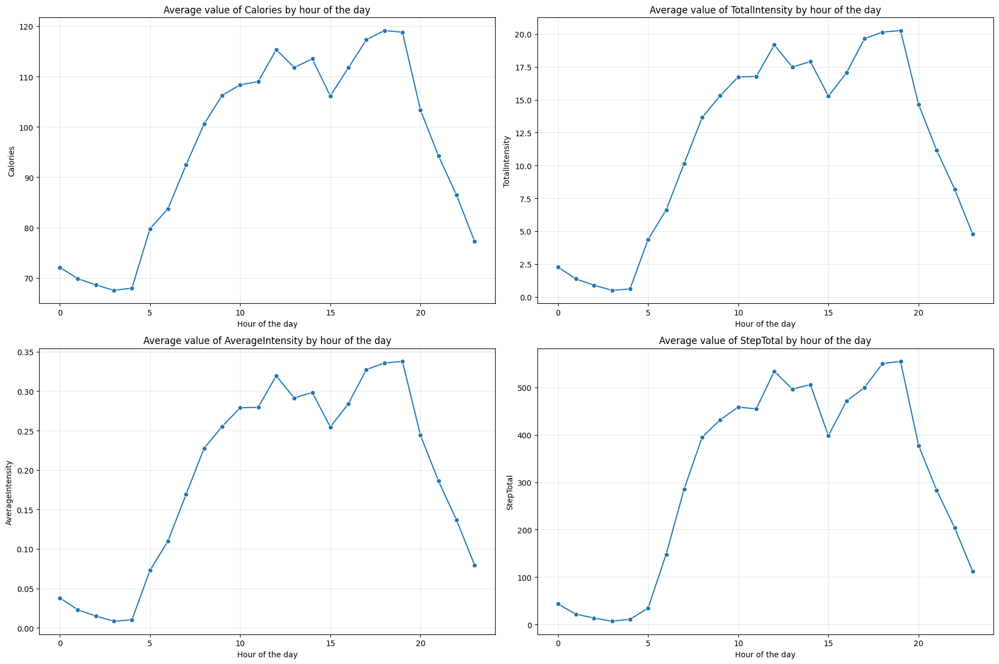

In [51]:
hourly["Hour"]=hourly["ActivityHour"].dt.hour
hourly_stats = hourly.groupby('Hour').agg({
    'Calories': 'mean',
    'TotalIntensity': 'mean',
    'AverageIntensity': 'mean',
    'StepTotal': 'mean',
}).reset_index()

plt.figure(figsize=(18, 12))

for i, col in enumerate(['Calories', 'TotalIntensity', 'AverageIntensity', 'StepTotal'], 1):
    plt.subplot(2, 2, i)
    sns.lineplot(data=hourly_stats, x='Hour', y=col, marker='o')
    plt.title(f'Average value of {col} by hour of the day')
    plt.xlabel('Hour of the day')
    plt.ylabel(col)
    plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [52]:
hourly_stats

,Hour,Calories,TotalIntensity,AverageIntensity,StepTotal
0,0,72.116624,2.273657,0.037894,43.354476
1,1,69.873081,1.367451,0.022791,21.734903
2,2,68.631525,0.895599,0.014927,13.702661
3,3,67.549180,0.497439,0.008291,6.888832
4,4,68.005128,0.604103,0.010068,11.162564
5,5,79.772191,4.370959,0.072849,34.603899
6,6,83.774525,6.605033,0.110084,148.062661
7,7,92.455527,10.149100,0.169152,285.754242
8,8,100.578785,13.647786,0.227463,395.294542
9,9,106.248841,15.315301,0.255255,431.718187


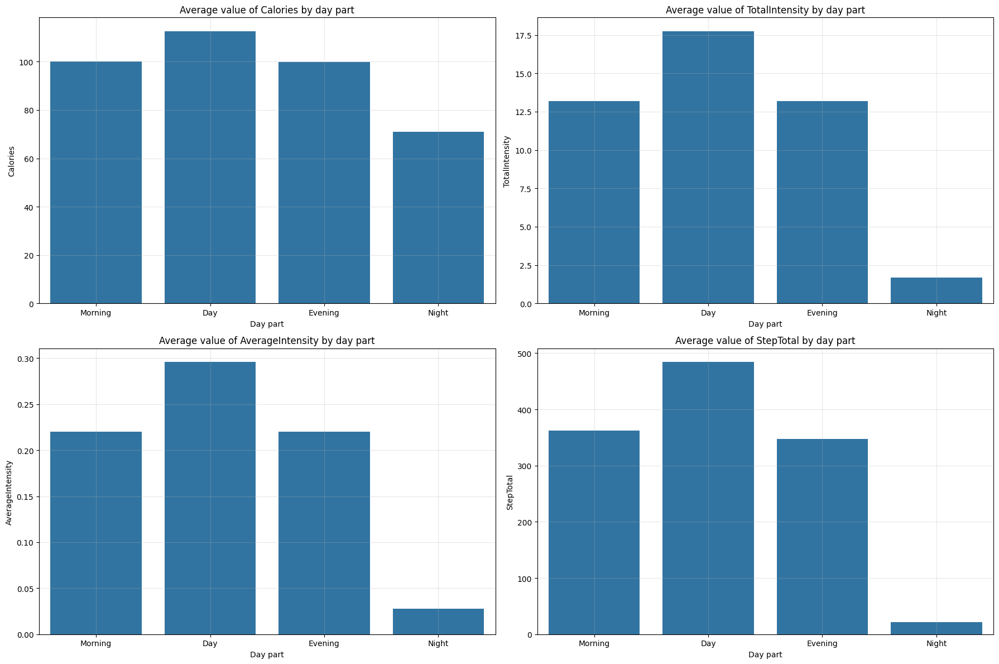

In [53]:
hourly_stats=hourly_stats = hourly.groupby('day_part')[["Calories","TotalIntensity","AverageIntensity","StepTotal"]].mean().reset_index()
plt.figure(figsize=(18, 12))
for i, col in enumerate(['Calories', 'TotalIntensity', 'AverageIntensity', 'StepTotal'], 1):
    plt.subplot(2, 2, i)
    sns.barplot(data=hourly_stats, x='day_part', y=col,order=["Morning","Day","Evening","Night"])
    plt.title(f'Average value of {col} by day part')
    plt.xlabel('Day part')
    plt.ylabel(col)
    plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

<Axes: xlabel='StepTotal', ylabel='Calories'>

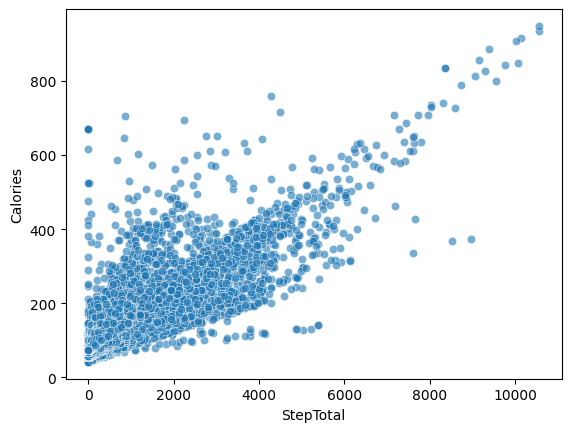

In [54]:
sns.scatterplot(data=hourly, x='StepTotal', y='Calories', alpha=0.6)

<Axes: xlabel='TotalIntensity', ylabel='Calories'>

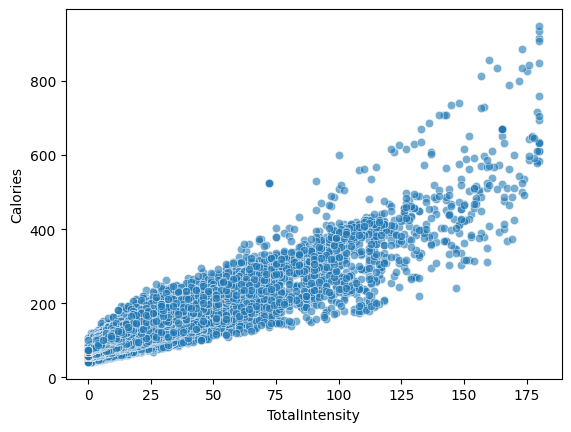

In [55]:
sns.scatterplot(data=hourly, x='TotalIntensity', y='Calories', alpha=0.6)

In [56]:
hourly["day_of_week"]=hourly["ActivityHour"].dt.day_name()

<Axes: xlabel='Hour', ylabel='day_of_week'>

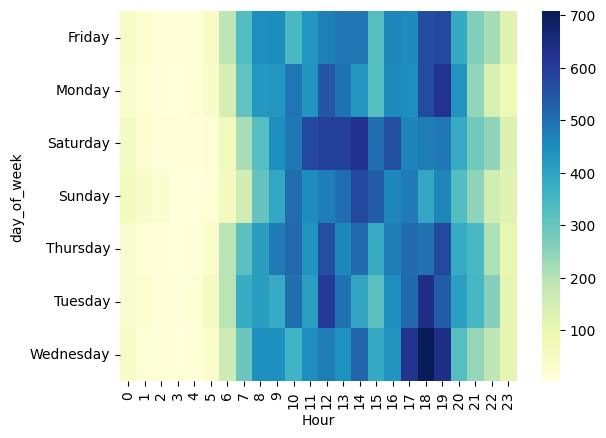

In [57]:
heat_data = hourly.groupby(['day_of_week','Hour'])['StepTotal'].mean().unstack()
sns.heatmap(heat_data, cmap='YlGnBu')

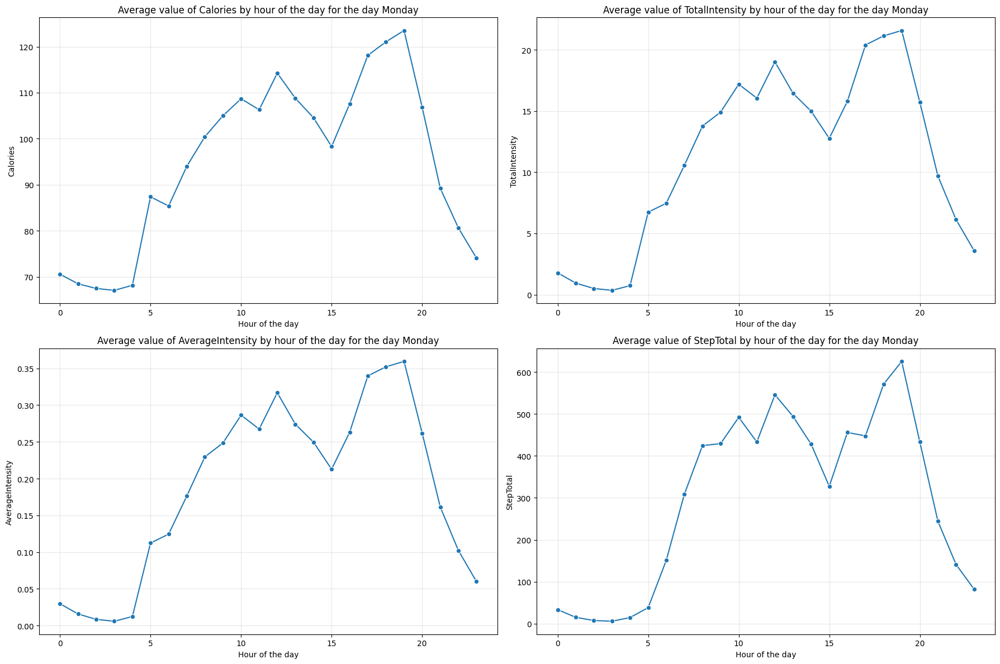

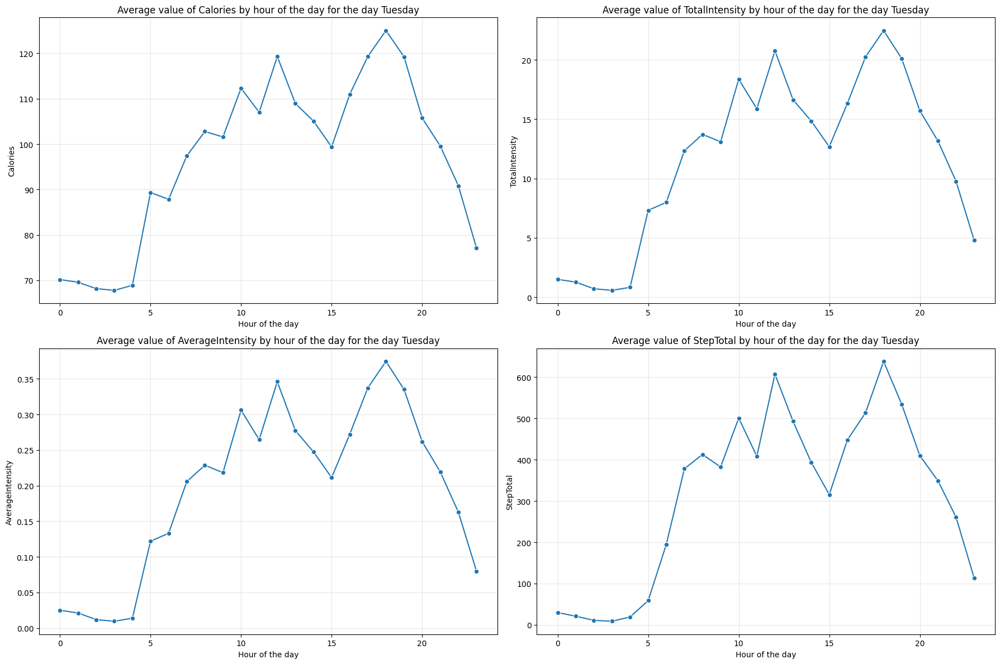

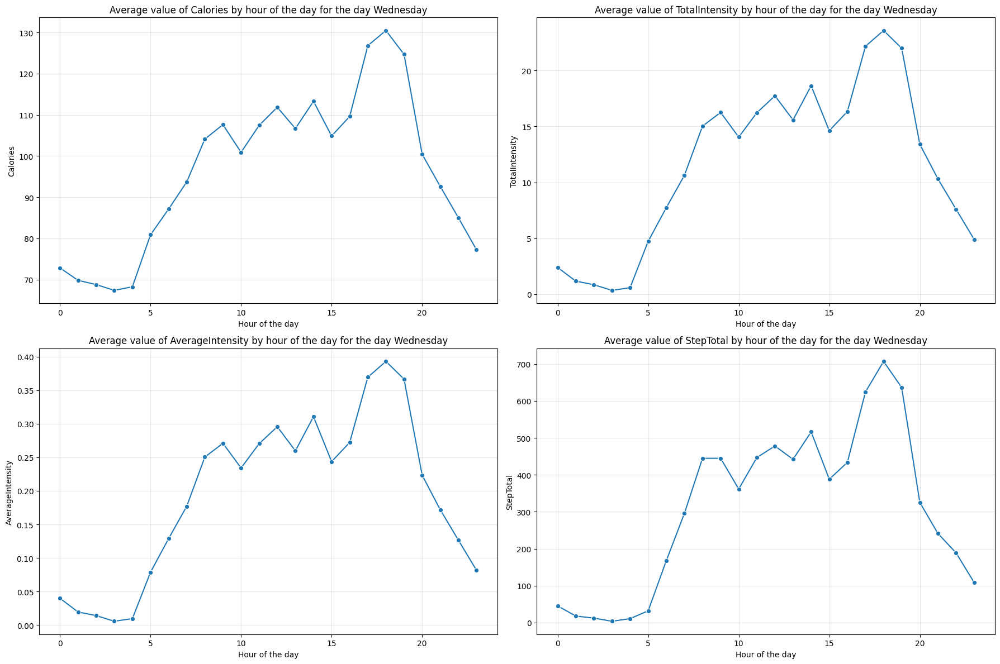

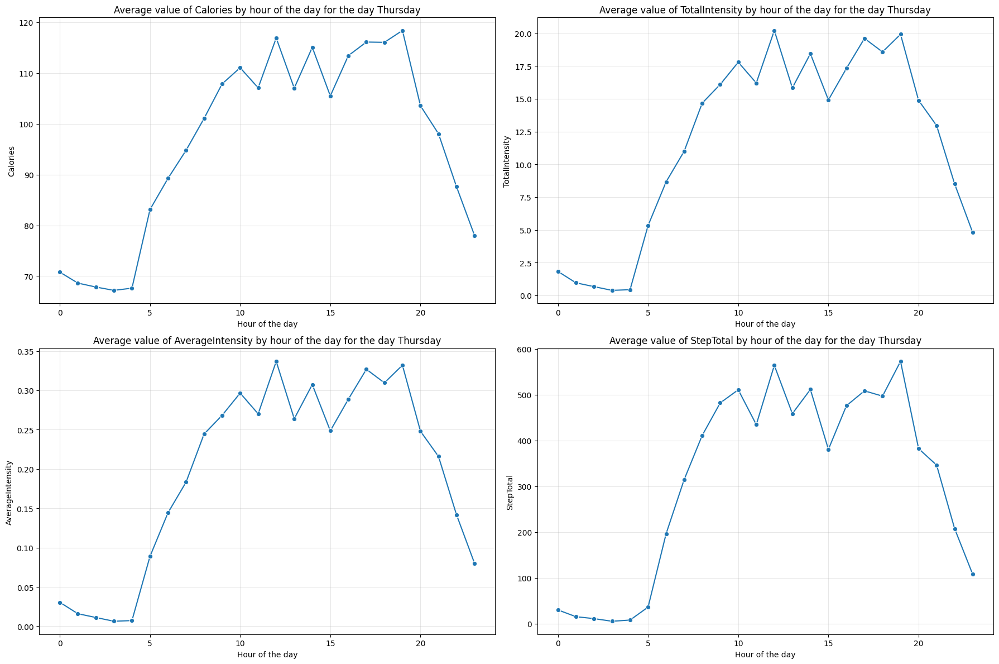

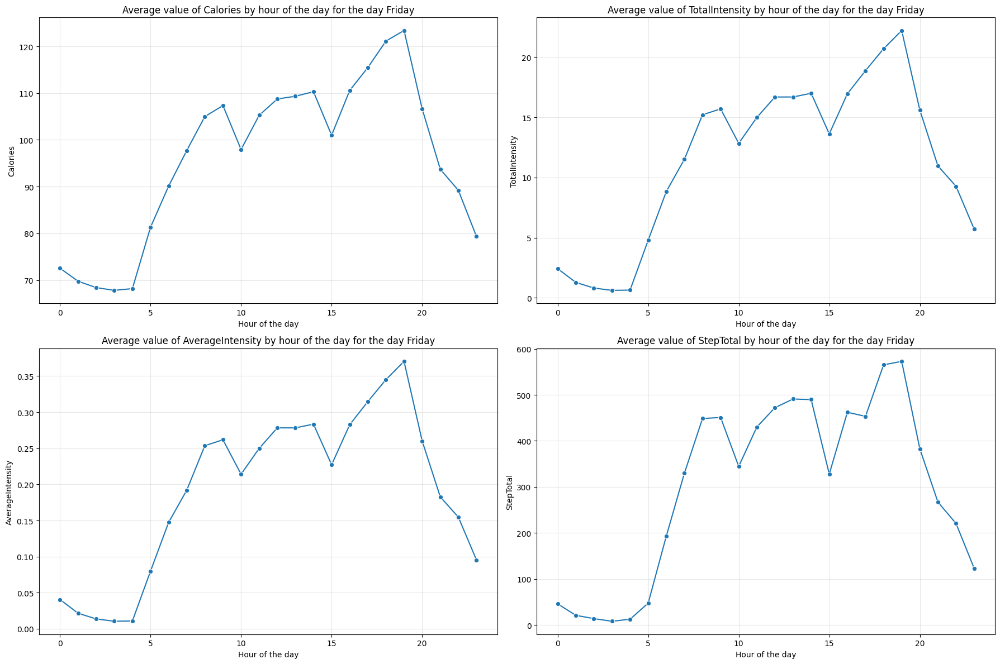

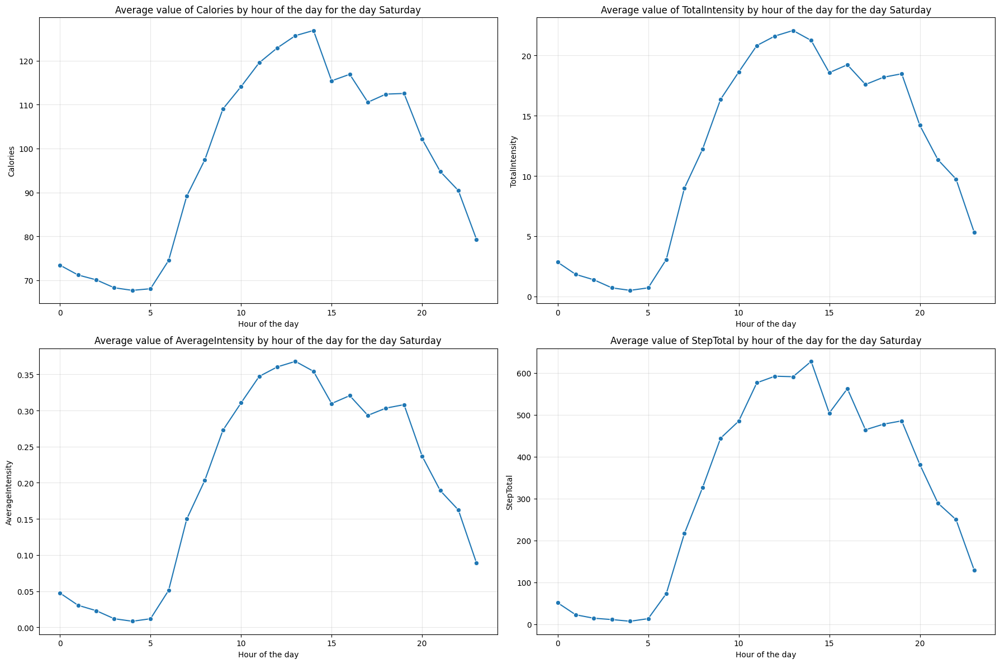

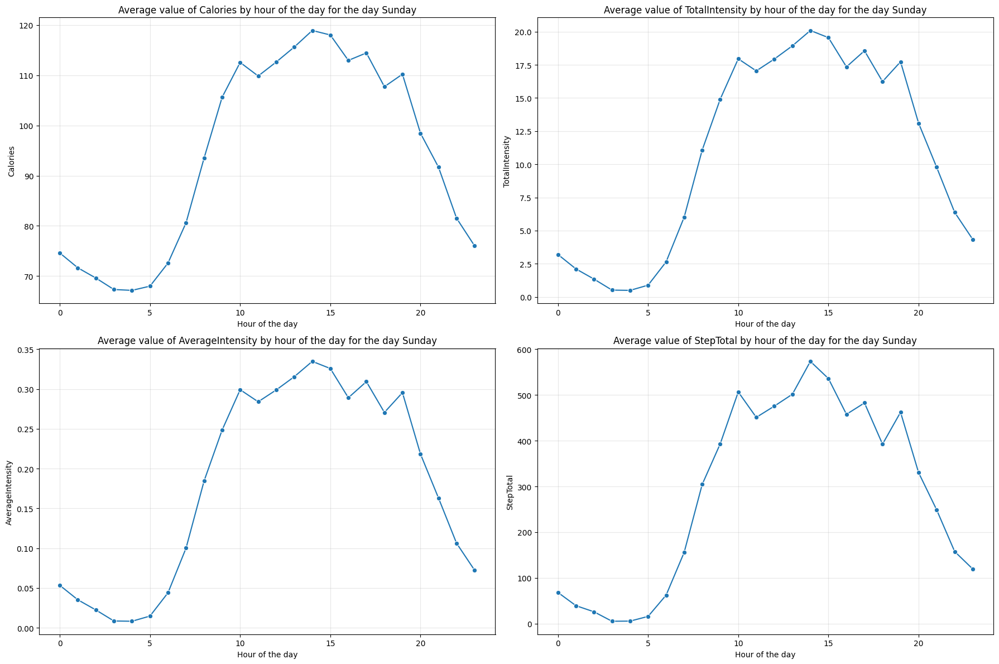

In [58]:
for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']:
    plt.figure(figsize=(18, 12))

    for i, col in enumerate(['Calories', 'TotalIntensity', 'AverageIntensity', 'StepTotal'], 1):
        plt.subplot(2, 2, i)
        sns.lineplot(data=hourly[hourly["day_of_week"]==day], x='Hour', y=col, marker='o',ci=None)
        plt.title(f'Average value of {col} by hour of the day for the day '+ day)
        plt.xlabel('Hour of the day')
        plt.ylabel(col)
        plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

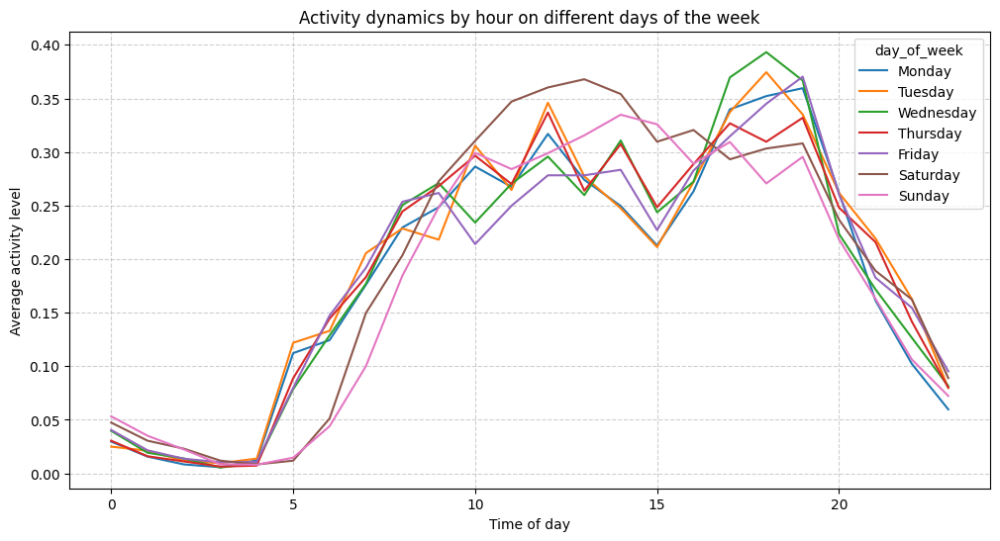

In [59]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=hourly, 
    x='Hour', 
    y='AverageIntensity', 
    hue='day_of_week',
    hue_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],ci=None
)
plt.title('Activity dynamics by hour on different days of the week')
plt.xlabel('Time of day')
plt.ylabel('Average activity level')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


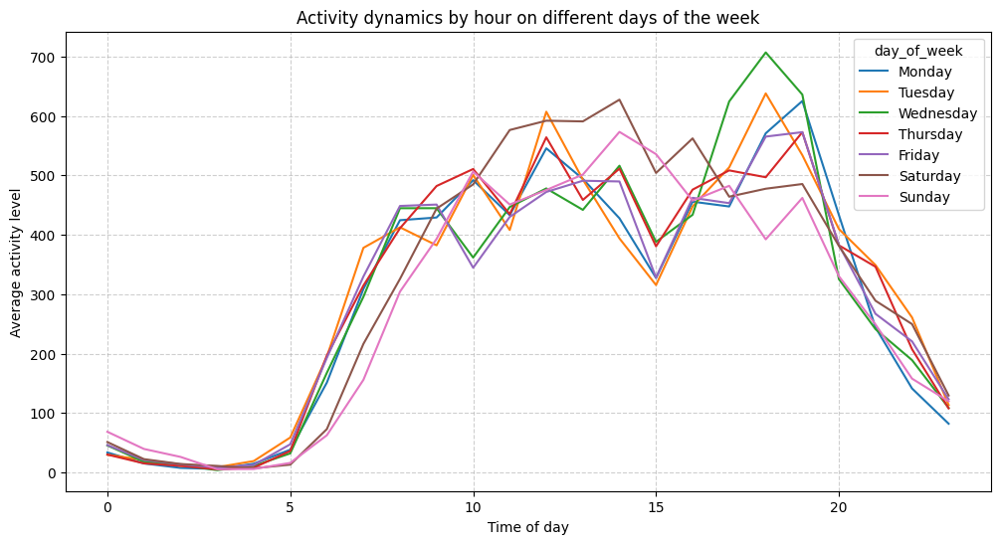

In [60]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=hourly, 
    x='Hour', 
    y='StepTotal', 
    hue='day_of_week',
    hue_order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],ci=None
)
plt.title('Activity dynamics by hour on different days of the week')
plt.xlabel('Time of day')
plt.ylabel('Average activity level')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()


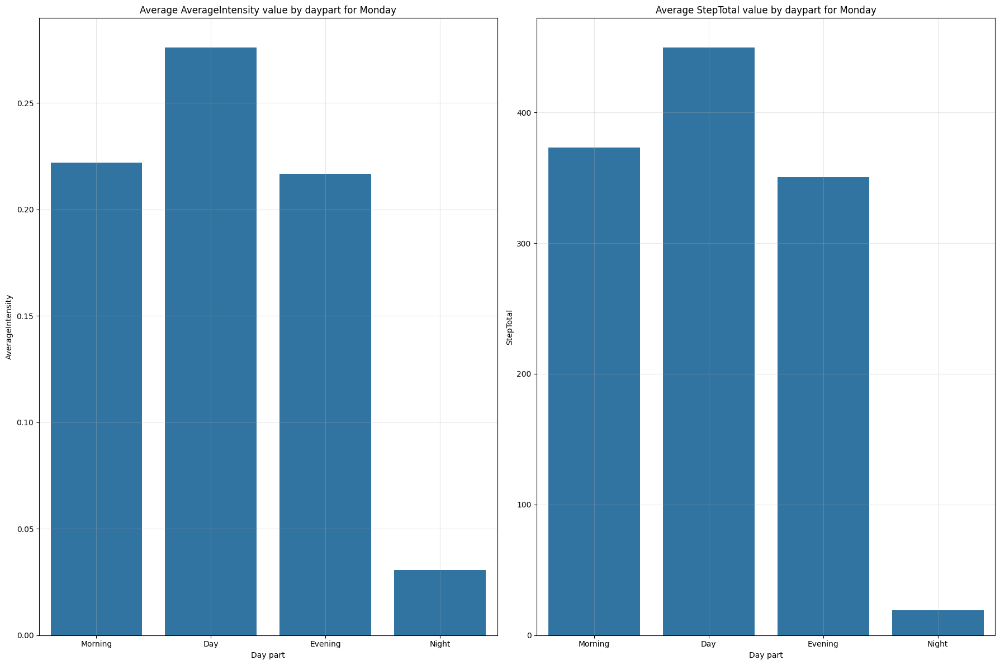

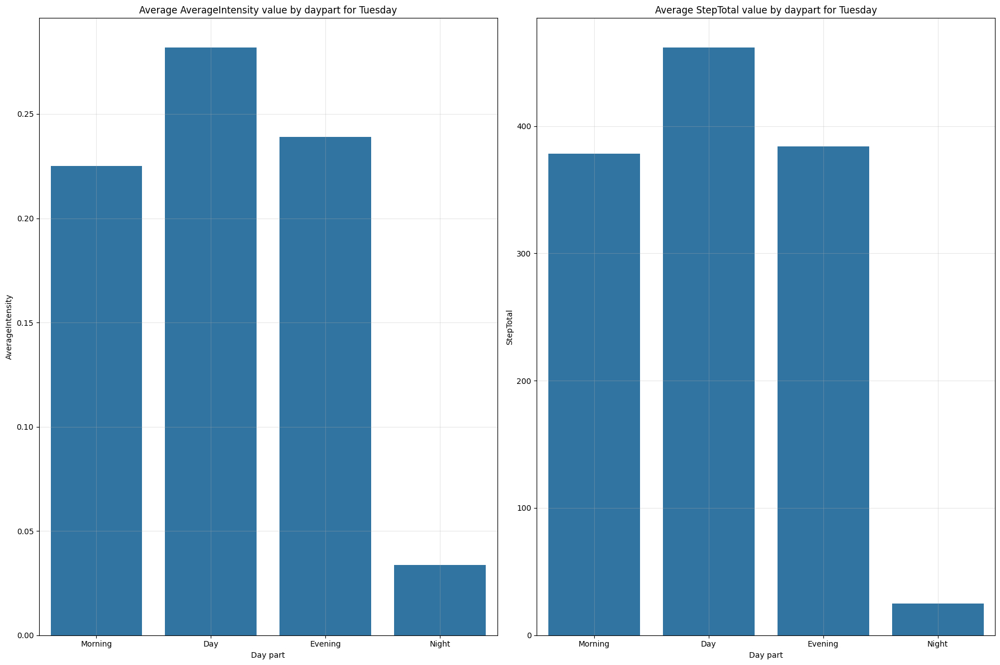

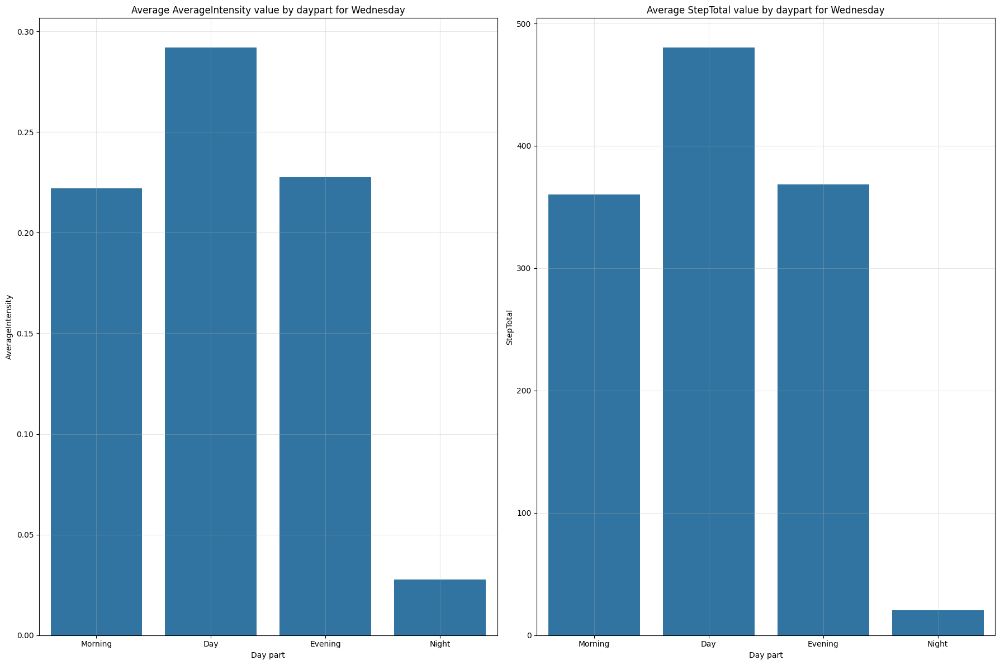

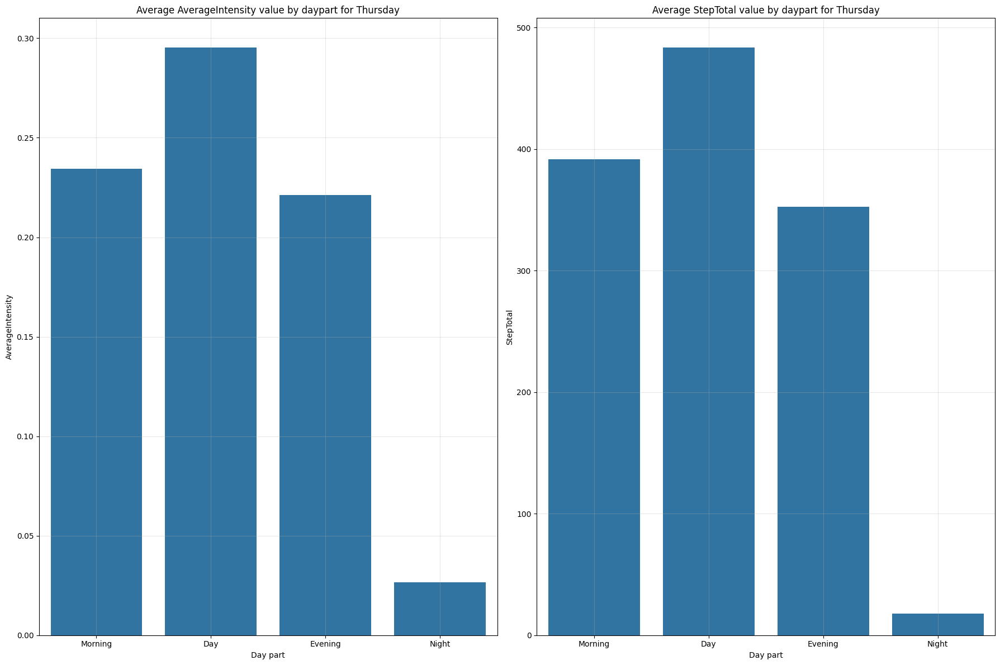

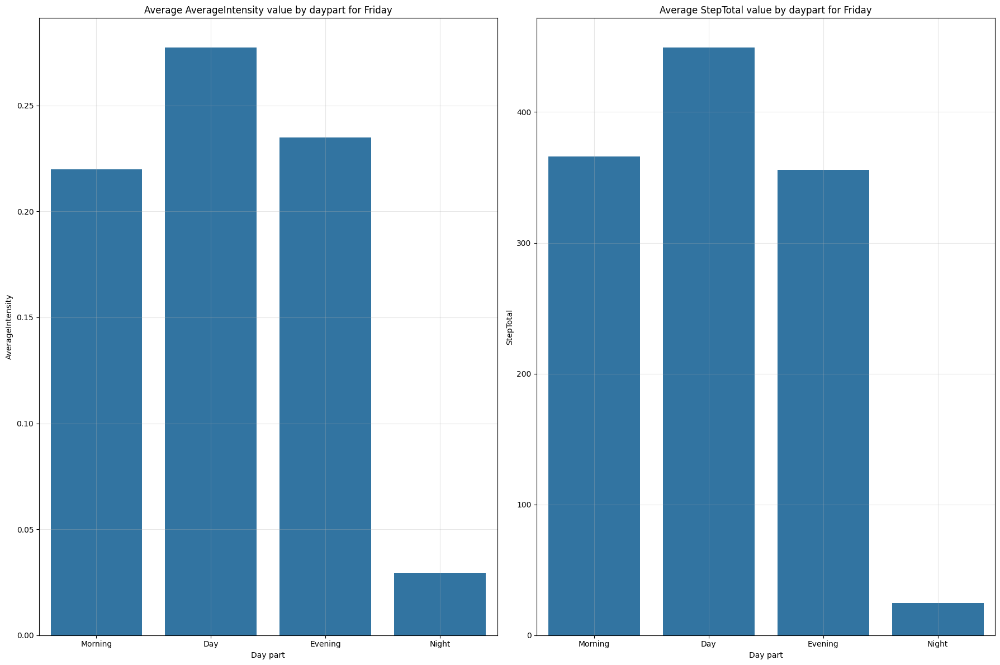

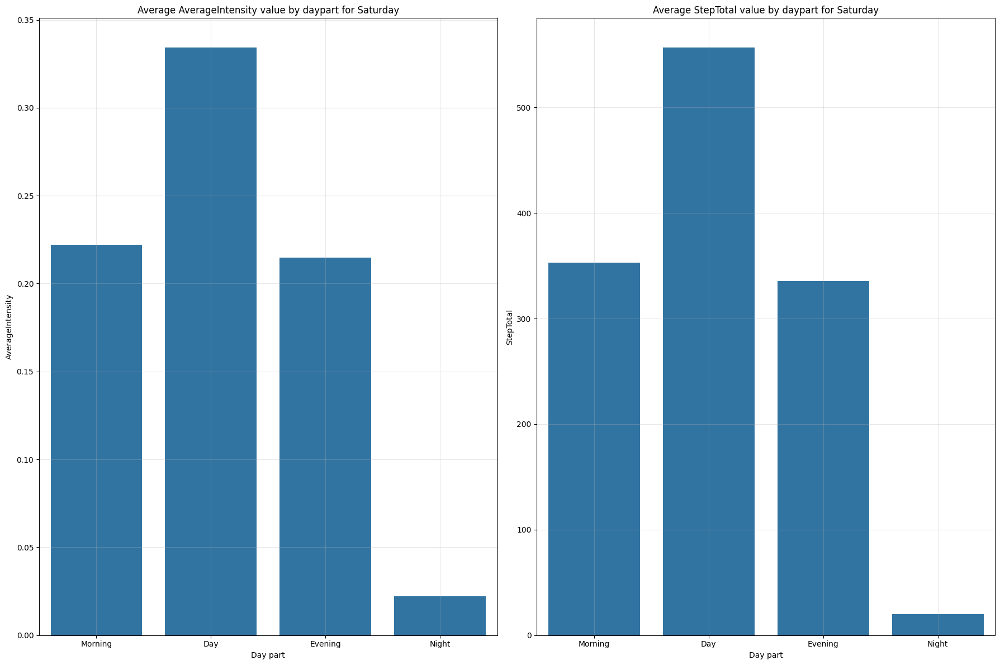

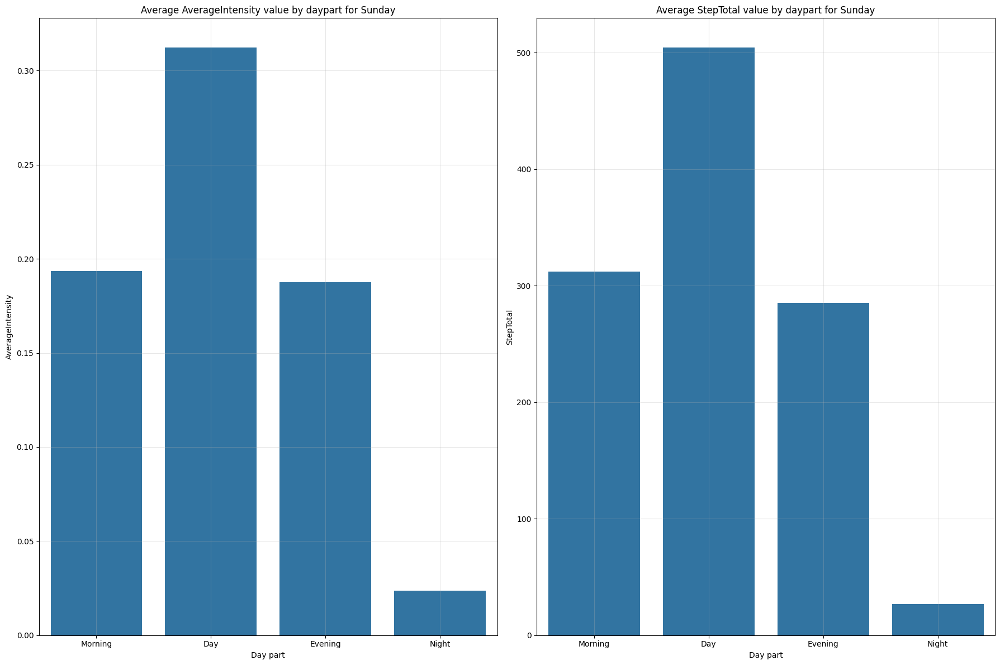

In [61]:
for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']:
    hourly_stats=hourly_stats = hourly[hourly["day_of_week"]==day].groupby('day_part')[["AverageIntensity","StepTotal"]].mean().reset_index()
    plt.figure(figsize=(18, 12))
    for i, col in enumerate(["AverageIntensity","StepTotal"], 1):
        plt.subplot(1, 2, i)
        sns.barplot(data=hourly_stats, x='day_part', y=col,order=["Morning","Day","Evening","Night"])
        plt.title(f'Average {col} value by daypart for {day}')
        plt.xlabel('Day part')
        plt.ylabel(col)
        plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# Sleep

In [62]:
sleep_day=pd.read_csv(path + "\sleep_day.csv")
sleep_day["SleepDay"]=pd.to_datetime(sleep_day["SleepDay"])
sleep_day["Id"]=sleep_day["Id"].astype(str)
sleep_day.head()

,Id,SleepDay,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed,diff,ActivityDate,TotalSteps,TotalDistance,VeryActiveDistance,...,Total_active_time,HasLoggedActivity,day_of_week,ActiveRatio,IntensityScore,IntensityLevel,VeryActiveSpeed,FairlyActiveSpeed,LightlyActiveSpeed,AvgActiveSpeed
0,1503960366,2016-04-12,1,327,346,19,2016-04-12,13162,8.50,1.88,...,1094,0,Tuesday,33.455210,38.287520,Medium,4.512000,2.538462,1.108537,1.391803
1,1503960366,2016-04-13,2,384,407,23,2016-04-13,10735,6.97,1.57,...,1033,0,Wednesday,24.878993,31.188472,Medium,4.485714,2.178947,1.302304,1.627237
2,1503960366,2016-04-15,1,412,442,30,2016-04-15,9762,6.28,2.14,...,998,0,Friday,27.254509,40.247054,High,4.427586,2.223529,0.812440,1.374265
3,1503960366,2016-04-16,2,340,367,27,2016-04-16,12669,8.16,2.71,...,1040,0,Saturday,25.673077,38.949854,Medium,4.516667,2.460000,1.368326,1.833708
4,1503960366,2016-04-17,1,700,712,12,2016-04-17,9705,6.48,3.19,...,761,0,Sunday,29.172142,39.928384,High,5.036842,2.340000,0.918293,1.751351


In [63]:
order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
slep_temp=sleep_day.groupby("day_of_week")[['TotalSleepRecords', 'TotalMinutesAsleep','TotalTimeInBed']].mean().loc[order].reset_index()
slep_temp["diff"]=slep_temp["TotalTimeInBed"]-slep_temp["TotalMinutesAsleep"]
slep_temp

,day_of_week,TotalSleepRecords,TotalMinutesAsleep,TotalTimeInBed,diff
0,Monday,1.095238,415.952381,449.380952,33.428571
1,Tuesday,1.086207,398.327586,434.775862,36.448276
2,Wednesday,1.150000,441.250000,473.166667,31.916667
3,Thursday,1.039216,399.784314,432.568627,32.784314
4,Friday,1.056604,400.584906,440.509434,39.924528
5,Saturday,1.216216,442.945946,480.027027,37.081081
6,Sunday,1.181818,451.909091,490.795455,38.886364


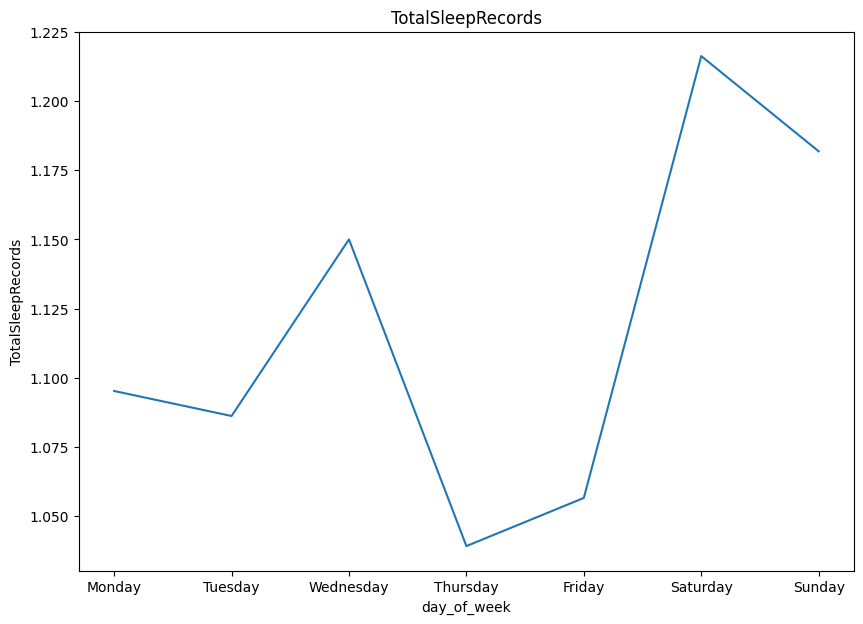

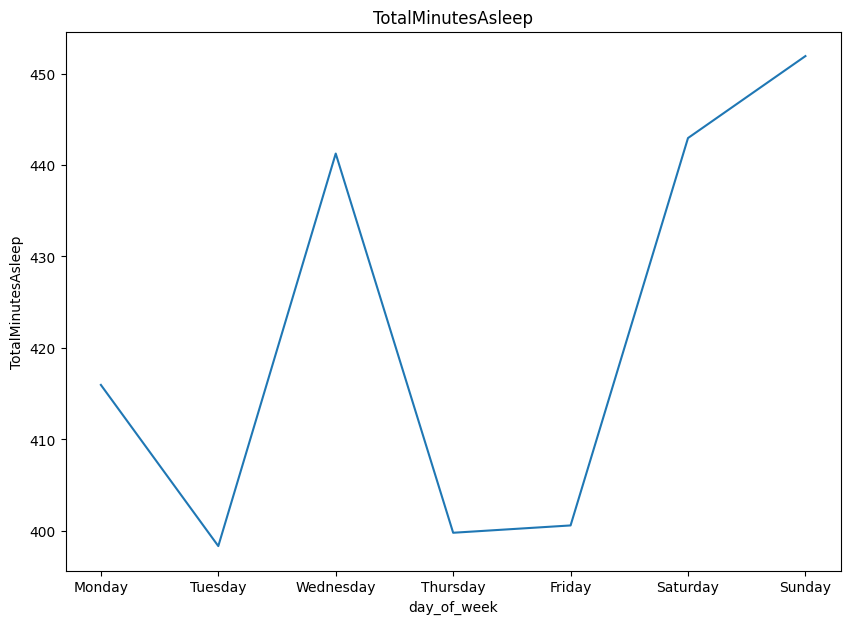

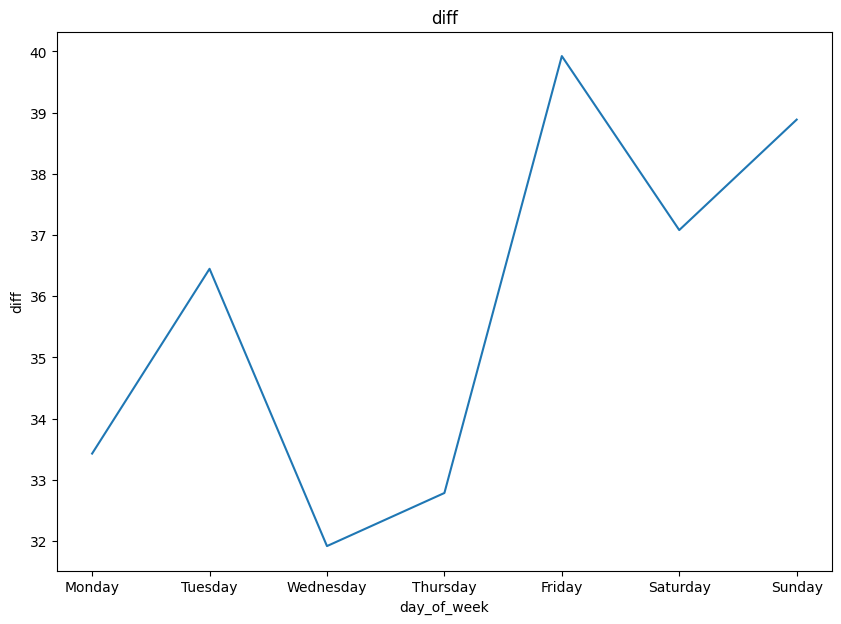

In [64]:
for att in ['TotalSleepRecords', 'TotalMinutesAsleep','diff']:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=slep_temp,x="day_of_week",y=att,sort=False)
    plt.title(att)
    plt.show()

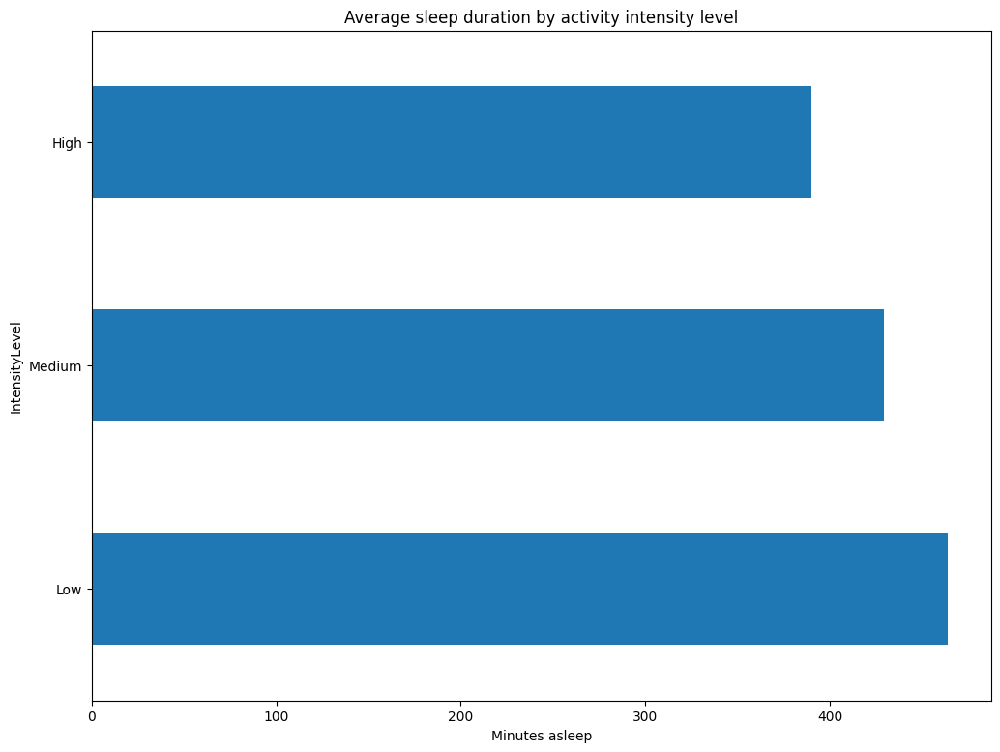

In [65]:
sleep_day.groupby("IntensityLevel")['TotalMinutesAsleep'].mean().loc[["Low","Medium","High"]].plot(kind="barh",figsize=(12,9))
plt.title('Average sleep duration by activity intensity level')
plt.xlabel('Minutes asleep')
plt.show()

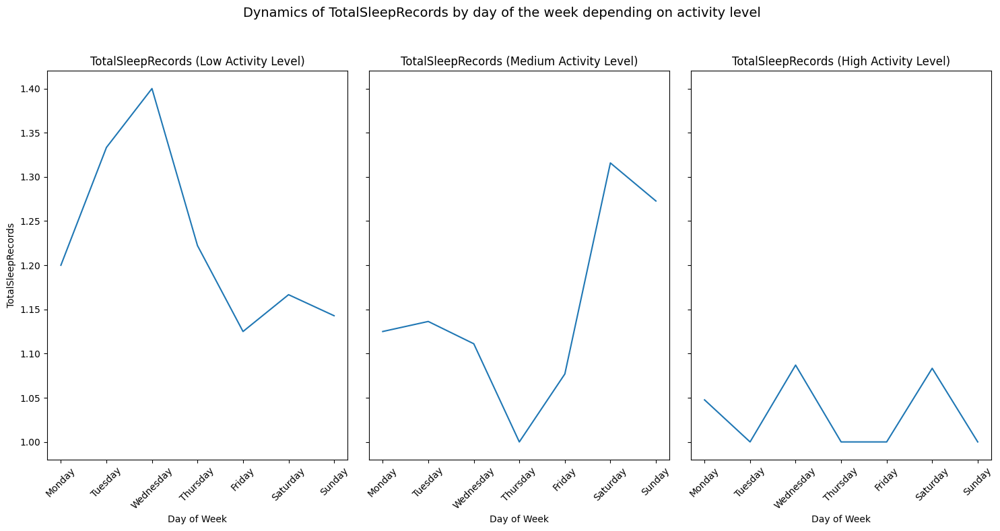

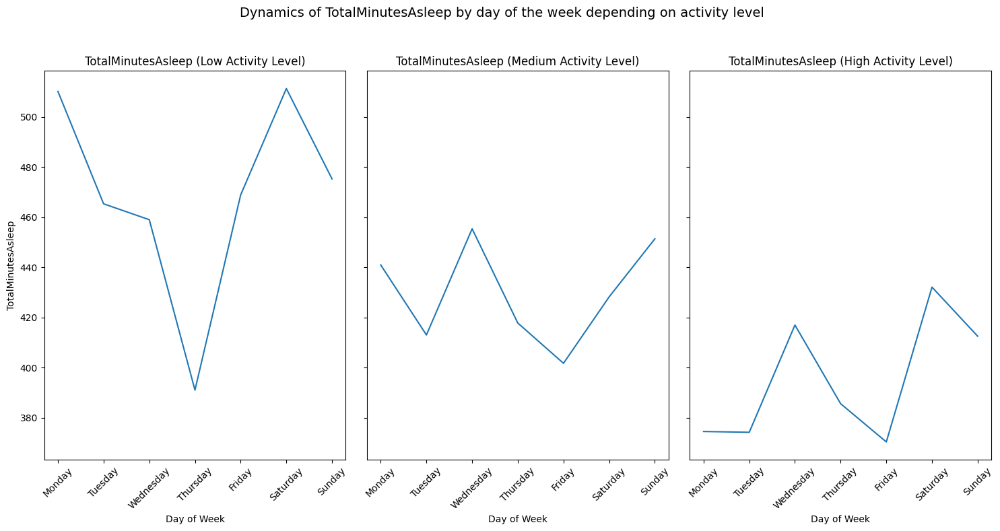

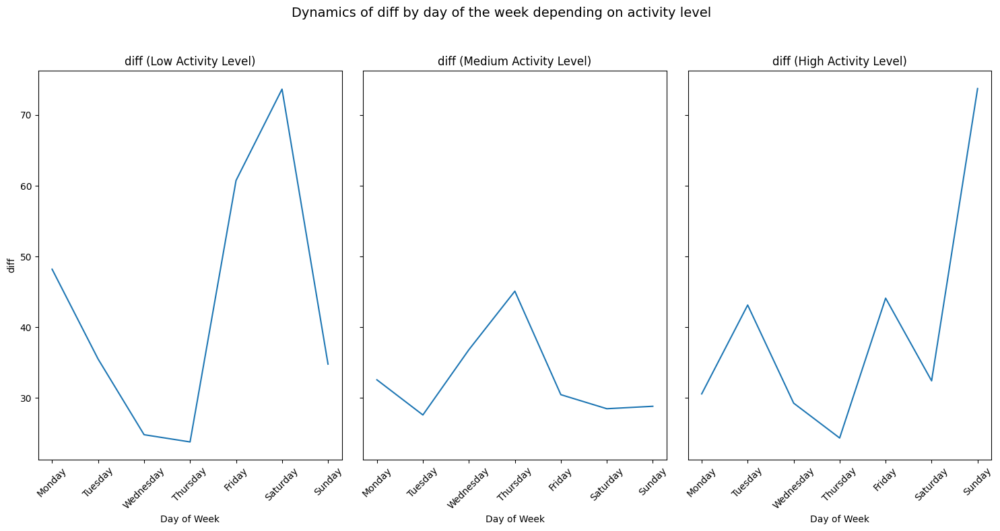

In [66]:
order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

for att in ['TotalSleepRecords', 'TotalMinutesAsleep', 'diff']:
    fig, axes = plt.subplots(1, 3, figsize=(15, 8), sharey=True)
    
    for i, type_ in enumerate(["Low", "Medium", "High"]):
        slep_temp = (
            sleep_day[sleep_day["IntensityLevel"] == type_]
            .groupby("day_of_week")[att]
            .mean()
            .loc[order]
            .reset_index()
        )
        sns.lineplot(
            data=slep_temp,
            x="day_of_week",
            y=att,
            sort=False,
            ax=axes[i]
        )
        axes[i].set_title(f"{att} ({type_} Activity Level)")
        axes[i].set_xlabel("Day of Week")
        axes[i].set_ylabel(att)
        axes[i].tick_params(axis='x', rotation=45)

    plt.suptitle(f"Dynamics of {att} by day of the week depending on activity level", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

<Axes: xlabel='IntensityScore', ylabel='TotalMinutesAsleep'>

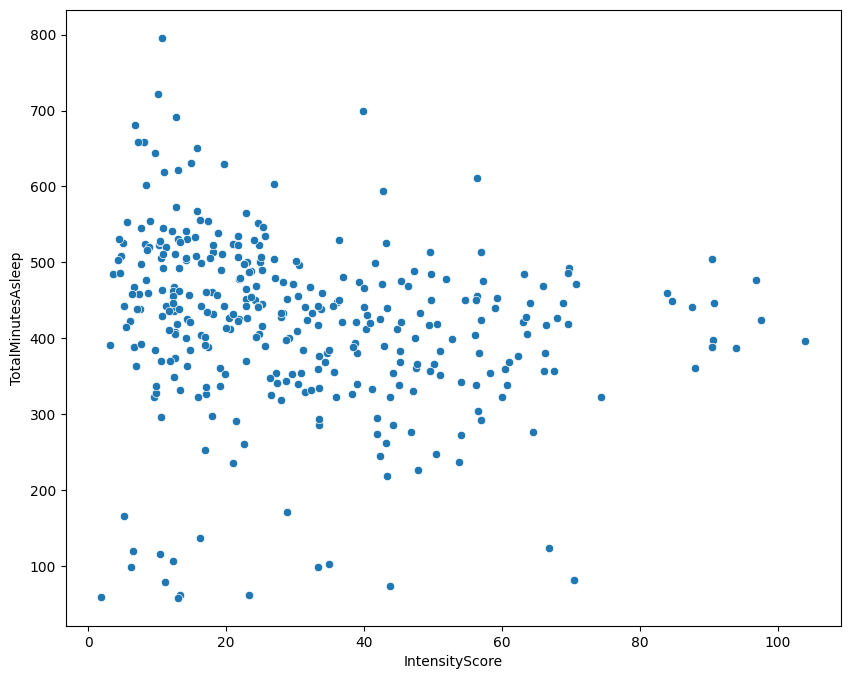

In [67]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=sleep_day,x="IntensityScore",y="TotalMinutesAsleep")

<Axes: xlabel='TotalMinutesAsleep', ylabel='Calories'>

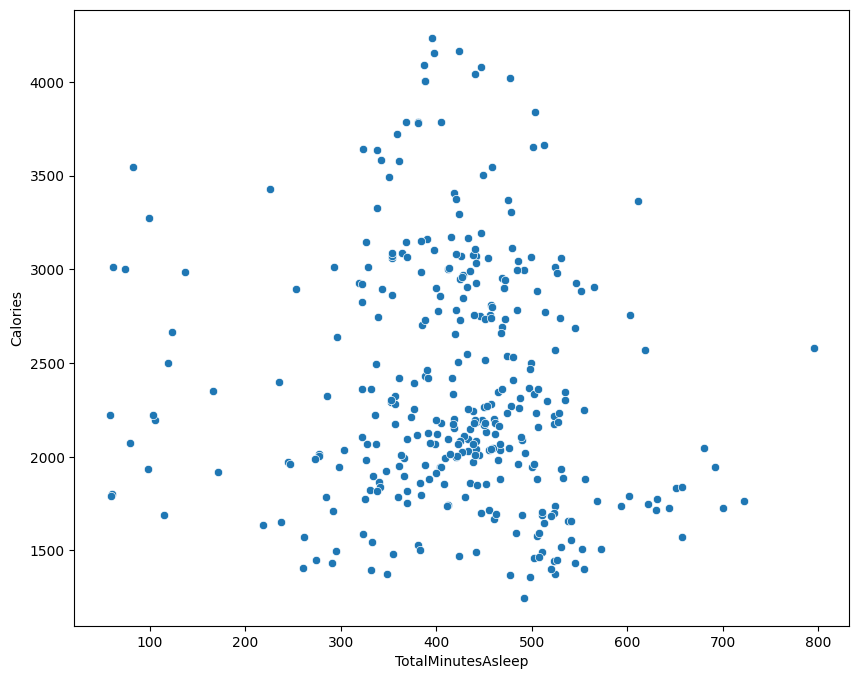

In [68]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=sleep_day,y="Calories",x="TotalMinutesAsleep")

<Axes: xlabel='IntensityScore', ylabel='TotalMinutesAsleep'>

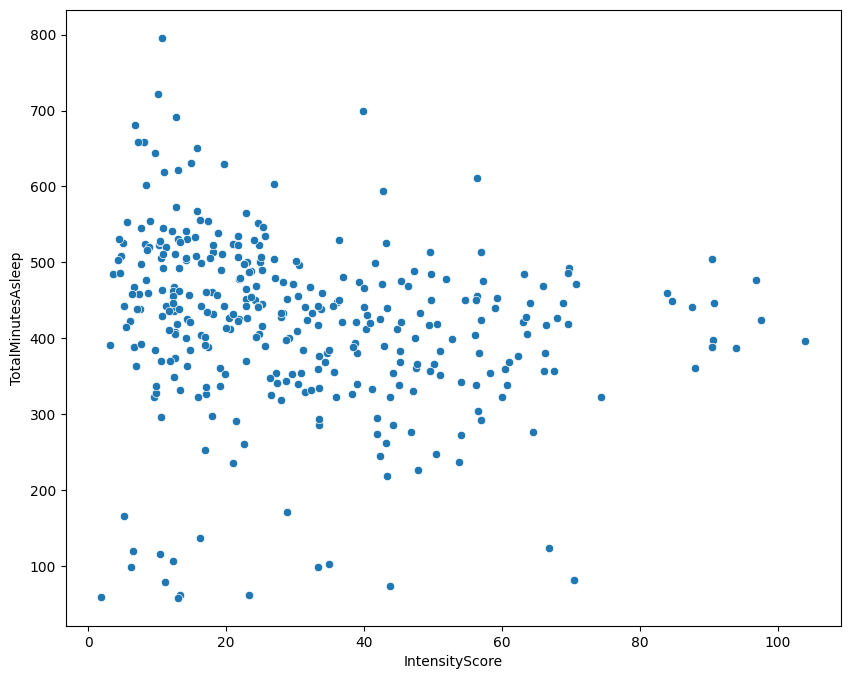

In [69]:
plt.figure(figsize=(10,8))
sns.scatterplot(data=sleep_day, x='IntensityScore', y='TotalMinutesAsleep')


<Figure size 1000x800 with 0 Axes>

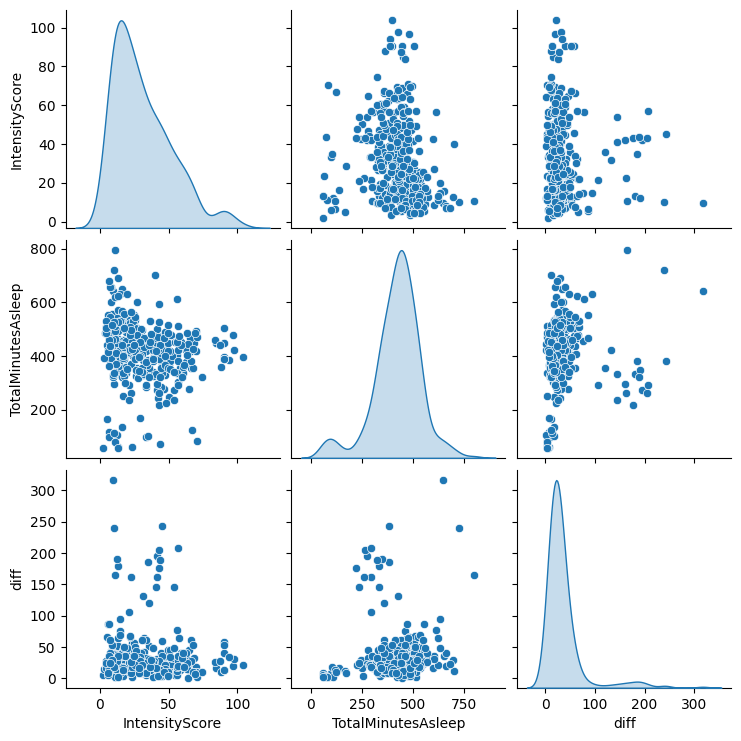

In [70]:
plt.figure(figsize=(10,8))
sns.pairplot(sleep_day[['IntensityScore','TotalMinutesAsleep','diff']], diag_kind='kde')
